In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, KFold, GridSearchCV, cross_val_score
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler
from category_encoders.binary import BinaryEncoder
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB, ComplementNB

In [2]:
data = pd.read_csv("E:/Downloads/bankdata.csv")
data

,ID,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
0,1,25,1,49,91107,4,1/60,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,1/50,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,1/00,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,2/70,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,1/00,2,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,29,3,40,92697,1,1/90,3,0,0,0,0,1,0
4996,4997,30,4,15,92037,4,0/40,1,85,0,0,0,1,0
4997,4998,63,39,24,93023,2,0/30,3,0,0,0,0,0,0
4998,4999,65,40,49,90034,3,0/50,2,0,0,0,0,1,0


### Data Exploration

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   ID                  5000 non-null   int64 
 1   Age                 5000 non-null   int64 
 2   Experience          5000 non-null   int64 
 3   Income              5000 non-null   int64 
 4   ZIP Code            5000 non-null   int64 
 5   Family              5000 non-null   int64 
 6   CCAvg               5000 non-null   object
 7   Education           5000 non-null   int64 
 8   Mortgage            5000 non-null   int64 
 9   Personal Loan       5000 non-null   int64 
 10  Securities Account  5000 non-null   int64 
 11  CD Account          5000 non-null   int64 
 12  Online              5000 non-null   int64 
 13  CreditCard          5000 non-null   int64 
dtypes: int64(13), object(1)
memory usage: 547.0+ KB


In [4]:
len(data['ID'].unique())

5000

--- As the ID column is just the range of whole numbers from 1 to 5000, it is not logically related 
to the target values. 

In [5]:
data.drop('ID', axis = 1, inplace = True)

In [6]:
data.describe(include = 'all')

,Age,Experience,Income,ZIP Code,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000
unique,NaN,NaN,NaN,NaN,NaN,108,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,0/30,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,241,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,45.338400,20.104600,73.774200,93152.503000,2.396400,NaN,1.881000,56.498800,0.096000,0.104400,0.06040,0.596800,0.294000
std,11.463166,11.467954,46.033729,2121.852197,1.147663,NaN,0.839869,101.713802,0.294621,0.305809,0.23825,0.490589,0.455637
min,23.000000,-3.000000,8.000000,9307.000000,1.000000,NaN,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
25%,35.000000,10.000000,39.000000,91911.000000,1.000000,NaN,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
50%,45.000000,20.000000,64.000000,93437.000000,2.000000,NaN,2.000000,0.000000,0.000000,0.000000,0.00000,1.000000,0.000000
75%,55.000000,30.000000,98.000000,94608.000000,3.000000,NaN,3.000000,101.000000,0.000000,0.000000,0.00000,1.000000,1.000000


In [7]:
mask = data['Experience'] < 0
data[mask].describe()

,Age,Experience,Income,ZIP Code,Family,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
count,52.000000,52.000000,52.000000,52.000000,52.000000,52.000000,52.000000,52.0,52.000000,52.0,52.000000,52.000000
mean,24.519231,-1.442308,69.942308,93240.961538,2.865385,2.076923,43.596154,0.0,0.115385,0.0,0.576923,0.288462
std,1.475159,0.639039,37.955295,1611.654806,0.970725,0.836570,90.027068,0.0,0.322603,0.0,0.498867,0.457467
min,23.000000,-3.000000,12.000000,90065.000000,1.000000,1.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000
25%,24.000000,-2.000000,40.750000,92167.750000,2.000000,1.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000
50%,24.000000,-1.000000,65.500000,93060.000000,3.000000,2.000000,0.000000,0.0,0.000000,0.0,1.000000,0.000000
75%,25.000000,-1.000000,86.750000,94720.000000,4.000000,3.000000,0.000000,0.0,0.000000,0.0,1.000000,1.000000
max,29.000000,-1.000000,150.000000,95842.000000,4.000000,3.000000,314.000000,0.0,1.000000,0.0,1.000000,1.000000


In [8]:
data[mask]['Experience'].value_counts()

-1    33
-2    15
-3     4
Name: Experience, dtype: int64

In [9]:
data[mask == False].describe()

,Age,Experience,Income,ZIP Code,Family,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
count,4948.000000,4948.000000,4948.000000,4948.000000,4948.000000,4948.000000,4948.000000,4948.000000,4948.000000,4948.000000,4948.000000,4948.000000
mean,45.557195,20.331043,73.814470,93151.573363,2.391471,1.878941,56.634398,0.097009,0.104285,0.061035,0.597009,0.294058
std,11.320735,11.311973,46.112596,2126.669017,1.148444,0.839745,101.828885,0.296000,0.305660,0.239418,0.490549,0.455664
min,24.000000,0.000000,8.000000,9307.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,36.000000,10.750000,39.000000,91911.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,46.000000,20.000000,64.000000,93437.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
75%,55.000000,30.000000,98.000000,94608.000000,3.000000,3.000000,101.000000,0.000000,0.000000,0.000000,1.000000,1.000000
max,67.000000,43.000000,224.000000,96651.000000,4.000000,3.000000,635.000000,1.000000,1.000000,1.000000,1.000000,1.000000


--- All samples with the negative "Experience" values are those with smaller values for the "Age" columns. Also, the negative values are limited to -1, -2 and -3.

--- After consutling with the instroctor of the course, it has been decided to change the nagative sign for the values in *Experince* column of these samples.

In [10]:
data ['Experience'] = data['Experience'].apply(lambda x:abs(x))
data['Experience'].nsmallest(5)

105    0
151    0
155    0
156    0
160    0
Name: Experience, dtype: int64

In [11]:
data.describe()

,Age,Experience,Income,ZIP Code,Family,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000
mean,45.338400,20.134600,73.774200,93152.503000,2.396400,1.881000,56.498800,0.096000,0.104400,0.06040,0.596800,0.294000
std,11.463166,11.415189,46.033729,2121.852197,1.147663,0.839869,101.713802,0.294621,0.305809,0.23825,0.490589,0.455637
min,23.000000,0.000000,8.000000,9307.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
25%,35.000000,10.000000,39.000000,91911.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
50%,45.000000,20.000000,64.000000,93437.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.00000,1.000000,0.000000
75%,55.000000,30.000000,98.000000,94608.000000,3.000000,3.000000,101.000000,0.000000,0.000000,0.00000,1.000000,1.000000
max,67.000000,43.000000,224.000000,96651.000000,4.000000,3.000000,635.000000,1.000000,1.000000,1.00000,1.000000,1.000000


--- Comparing statistics of the column *Experience* with the ones before changing values, the alteration is not significant.

In [12]:
data['ZIP Code'].value_counts()

94720    169
94305    127
95616    116
90095     71
93106     57
        ... 
96145      1
94087      1
90068      1
94970      1
9307       1
Name: ZIP Code, Length: 467, dtype: int64

In [13]:
for zip_code in data['ZIP Code']:
    if str(zip_code)[0] != '9':
        print(zip_code)
print('-')

-


 --- As the first digits of all the values in the "ZIP Code" column are equal to 9, it can be neglected. Also, second and third digits of American ZIP codes show the sectional center or large city post office, so it's better to extract those digits and use them instead of whole zip code.

In [14]:
city_codes = data['ZIP Code'].astype('str').str[1:3]
len(city_codes.value_counts())

57

In [16]:
city_codes.value_counts()

00    375
21    279
50    267
45    264
41    257
43    257
47    251
20    248
40    242
13    222
26    182
56    162
02    161
17    150
58    141
31    134
39    102
51     96
46     89
28     81
49     75
11     71
27     62
23     60
30     58
25     49
07     45
34     43
19     41
57     40
06     38
35     36
04     35
55     32
10     29
60     29
16     29
05     28
53     26
59     19
08     19
54     19
37     18
33     18
48     17
24     17
14     13
44     13
52     13
22     10
36      8
12      7
42      7
66      6
61      5
18      3
03      2
Name: ZIP Code, dtype: int64

In [17]:
data['City Code'] = city_codes.astype('str')
zip_codes = data['ZIP Code']   #svaing information of *ZIP Code* in case it is needed in future
data.drop('ZIP Code', axis = 1, inplace = True)
data

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard,City Code
0,25,1,49,4,1/60,1,0,0,1,0,0,0,11
1,45,19,34,3,1/50,1,0,0,1,0,0,0,00
2,39,15,11,1,1/00,1,0,0,0,0,0,0,47
3,35,9,100,1,2/70,2,0,0,0,0,0,0,41
4,35,8,45,4,1/00,2,0,0,0,0,0,1,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,29,3,40,1,1/90,3,0,0,0,0,1,0,26
4996,30,4,15,4,0/40,1,85,0,0,0,1,0,20
4997,63,39,24,2,0/30,3,0,0,0,0,0,0,30
4998,65,40,49,3,0/50,2,0,0,0,0,1,0,00


In [18]:
# Converting "CCAvg" values to numerical type.
data['CCAvg'] = data['CCAvg'].str.replace('/', '.').astype('float')
data.describe()

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000,5000.000000
mean,45.338400,20.134600,73.774200,2.396400,1.937938,1.881000,56.498800,0.096000,0.104400,0.06040,0.596800,0.294000
std,11.463166,11.415189,46.033729,1.147663,1.747659,0.839869,101.713802,0.294621,0.305809,0.23825,0.490589,0.455637
min,23.000000,0.000000,8.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
25%,35.000000,10.000000,39.000000,1.000000,0.700000,1.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
50%,45.000000,20.000000,64.000000,2.000000,1.500000,2.000000,0.000000,0.000000,0.000000,0.00000,1.000000,0.000000
75%,55.000000,30.000000,98.000000,3.000000,2.500000,3.000000,101.000000,0.000000,0.000000,0.00000,1.000000,1.000000
max,67.000000,43.000000,224.000000,4.000000,10.000000,3.000000,635.000000,1.000000,1.000000,1.00000,1.000000,1.000000


### Visualization

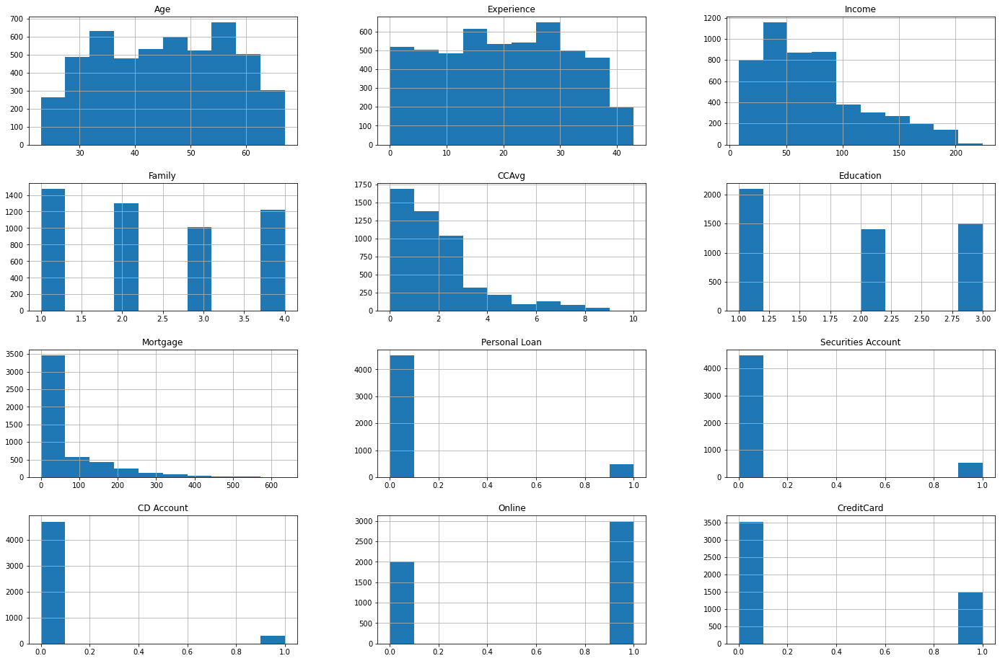

In [19]:
data.hist(figsize = (24, 16))
plt.show()

--- Values in *CCAvg* and *Mortgage* columns are not distributed normaly, nor uniformly!

In [20]:
plt.style.use('seaborn')

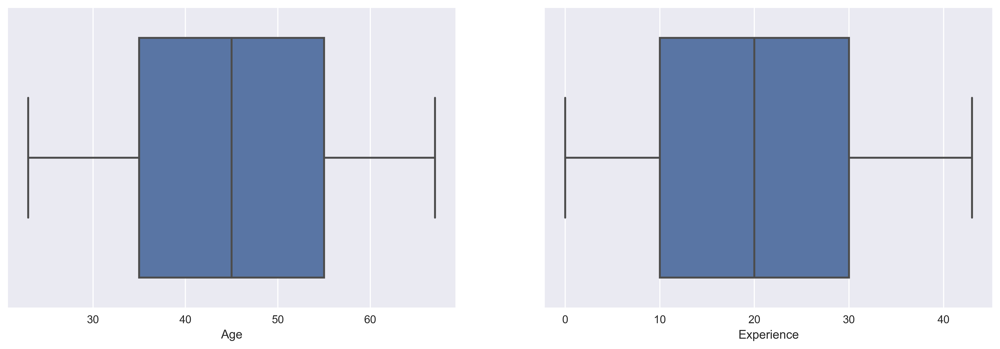

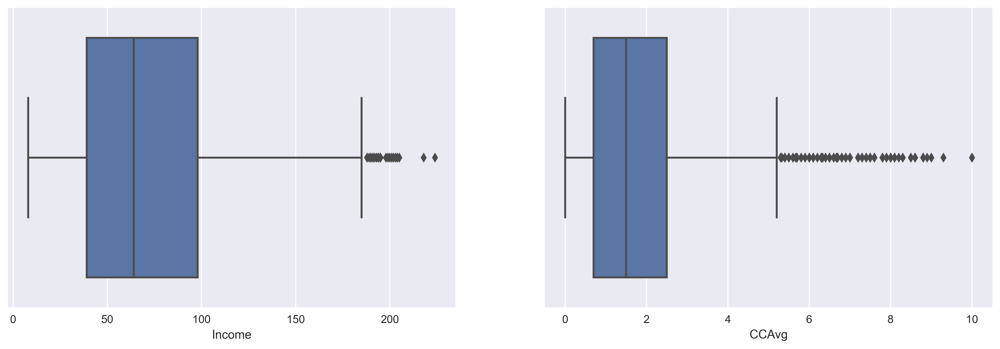

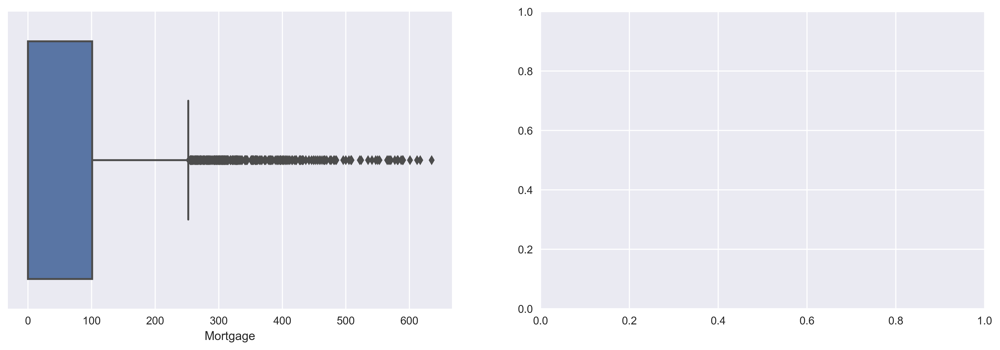

In [21]:
numerical, i = ['Age', 'Experience', 'Income', 'CCAvg', 'Mortgage'], 0
while i < 5:
    try:
        fig = plt.figure(figsize = (16, 5), dpi = 400)
        plt.subplot(1,2,1)
        sns.boxplot(x = numerical[i], data = data)
        i += 1
        plt.subplot(1,2,2)
        sns.boxplot(x = numerical[i], data = data)
        i += 1
    except IndexError:
        break
plt.show()

In [22]:
print(data['Income'].nlargest(5))
print('\n')
print(data['CCAvg'].nlargest(5))

3896    224
4993    218
526     205
2988    205
677     204
Name: Income, dtype: int64


787     10.0
2101    10.0
2337    10.0
3943     9.3
1339     9.0
Name: CCAvg, dtype: float64


--- None of the oultiers in *CCAvg* and *Income* columns seems to be noise, as they are not significantly different than their nearest samples.

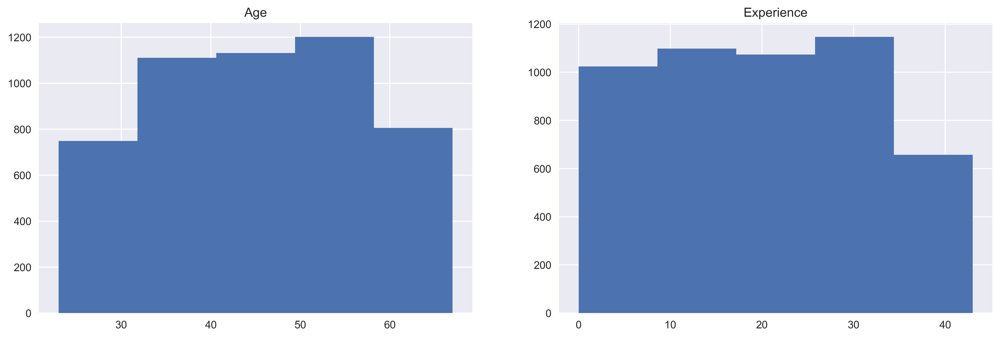

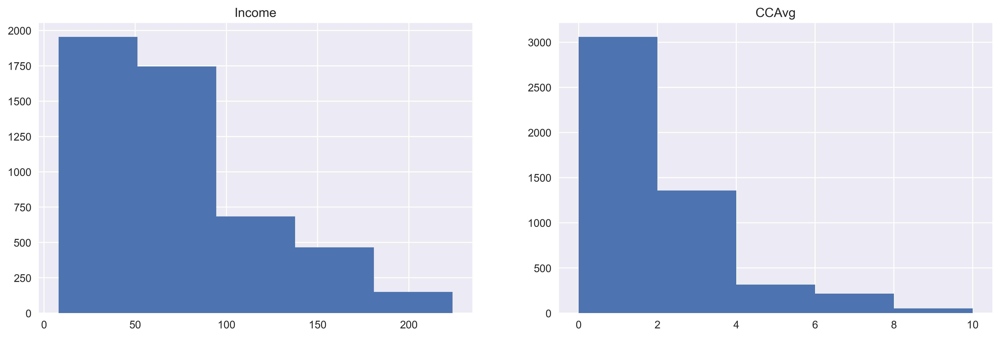

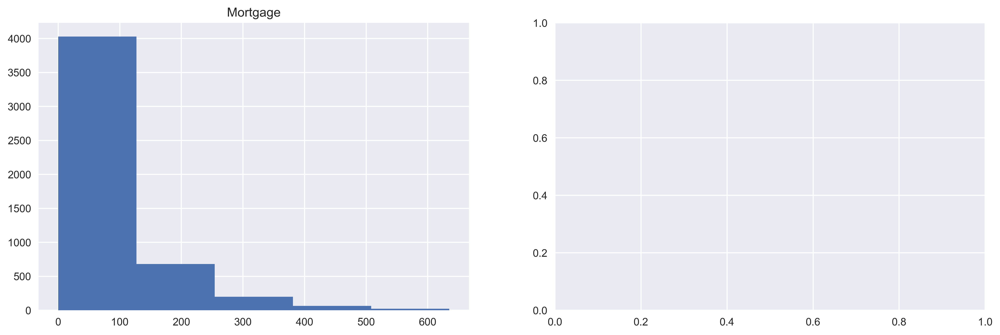

In [24]:
numerical, i = ['Age', 'Experience', 'Income', 'CCAvg', 'Mortgage'], 0
while i < 5:
    try:
        fig = plt.figure(figsize = (16, 5), dpi = 400)
        plt.subplot(1,2,1)
        plt.hist(data[numerical[i]], bins = 5)
        plt.title(numerical[i])
        i += 1
        plt.subplot(1,2,2)
        plt.hist(data[numerical[i]], bins = 5)
        plt.title(numerical[i])
        i += 1
    except IndexError:
        break
plt.show()

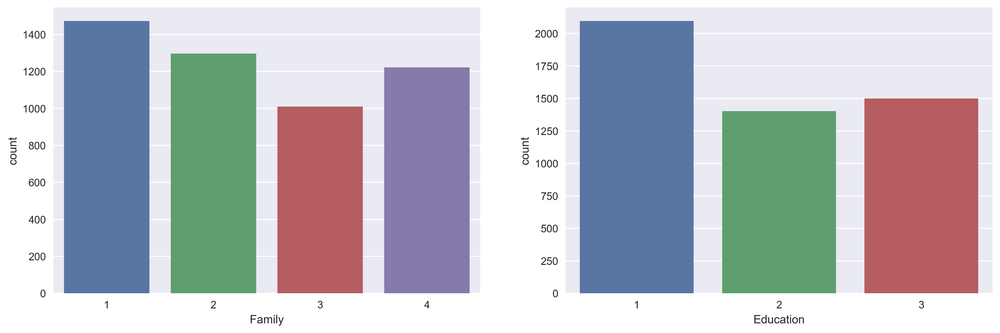

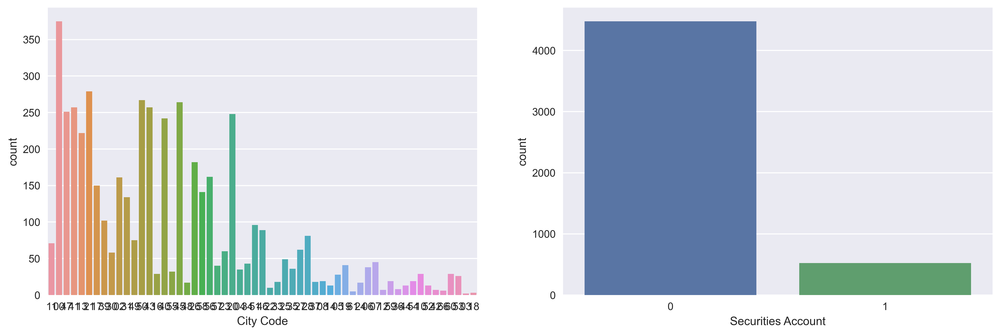

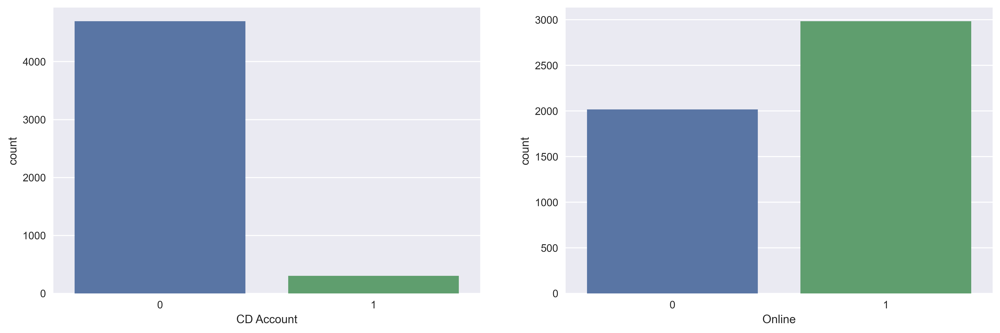

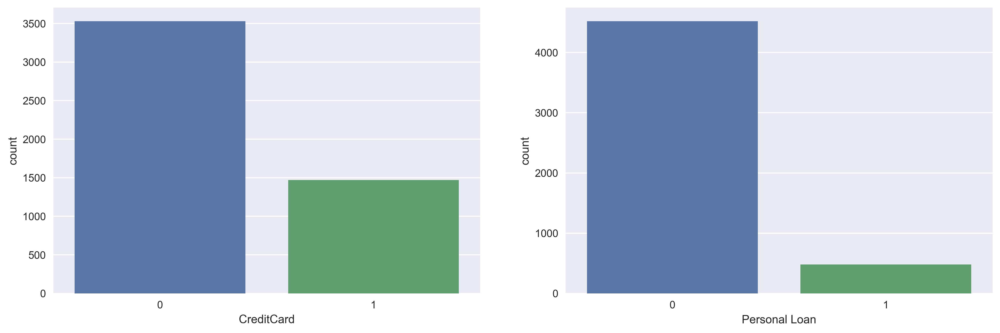

In [25]:
discrete = ['Family', 'Education', 'City Code', 'Securities Account', 'CD Account', 'Online', 'CreditCard', 'Personal Loan']
i = 0
while i < len(discrete):
    fig = plt.figure(figsize = (16, 5), dpi = 400)
    plt.subplot(1,2,1)
    sns.countplot(x = discrete[i], data = data)
    i += 1
    plt.subplot(1,2,2)
    sns.countplot(x = discrete[i], data = data)
    i += 1
plt.show()

--- Class distributions of the target and the features "CD Account", "Securities Account" and "CreditCard" are strongly imbalanced.

--- City Code could be an issue for algorithms to fit on. Encoding techniques need to be adopted.

#### Plots with Target Classes Separated

In [28]:
def scatter_plot(data, feature_1, feature_2, target):
    make = data[target] == 1
    plt.figure(figsize = (9, 6), dpi = 300)
    plt.scatter(data[mask][feature_1], data[mask][feature_2], color = 'b', label = 'PL = 1')
    plt.scatter(data[mask == False][feature_1], data[mask == False][feature_2], color = 'r', marker = '^', alpha = 0.5 , label = 'PL = 0')
    plt.xlabel(feature_1)
    plt.ylabel(feature_2)
    plt.legend()
    plt.show()

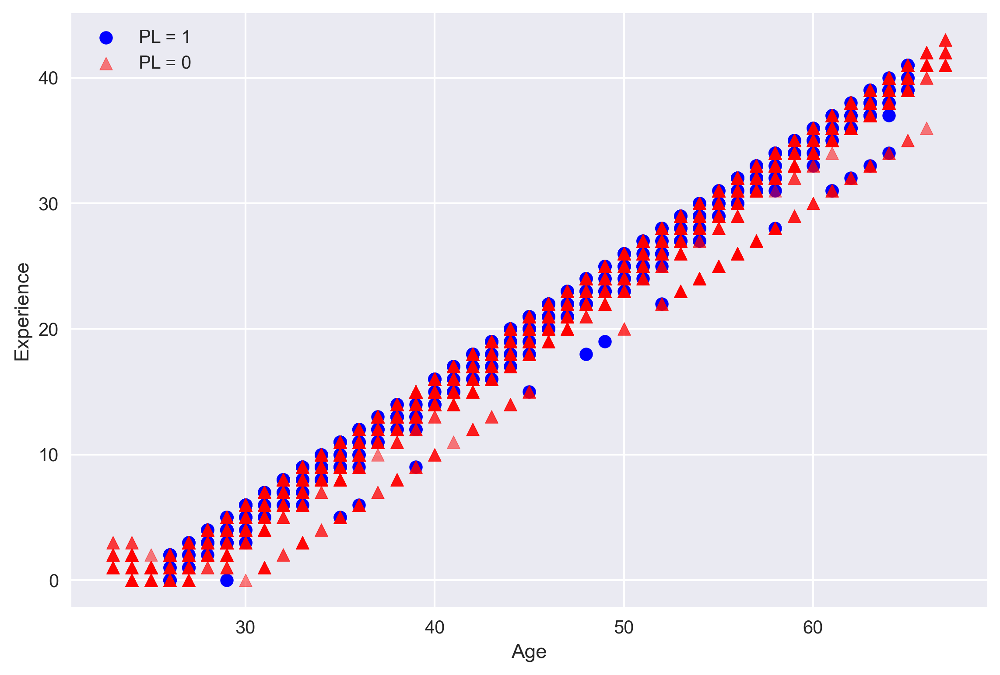

In [30]:
scatter_plot(data, 'Age', 'Experience', 'Personal Loan')

--- Age and Experinece are highly correlated. Can be an issue for Naive Bayes algorithm !

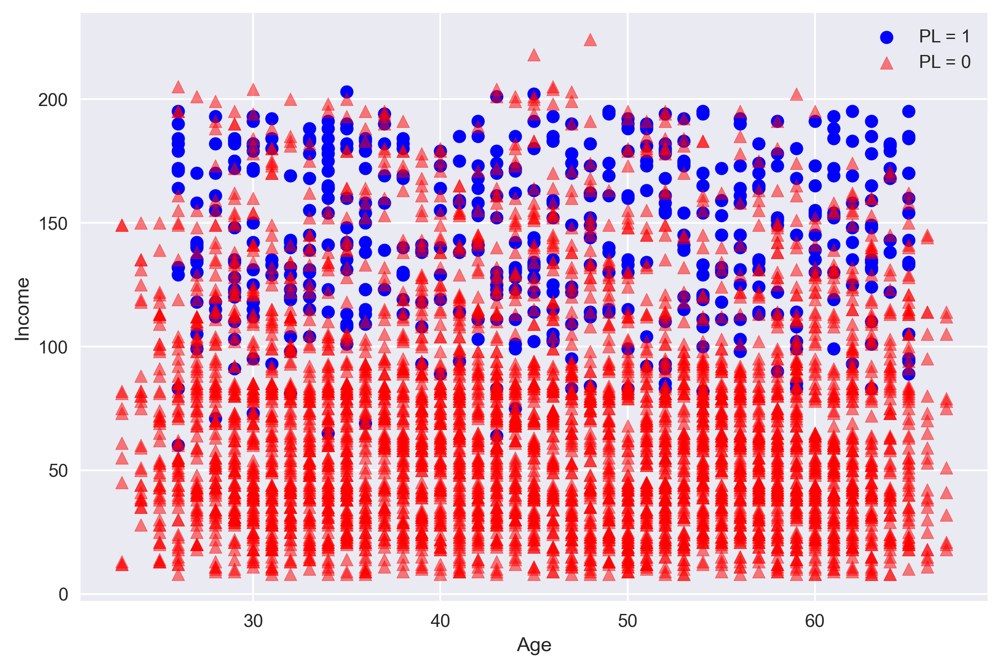

In [31]:
scatter_plot(data, 'Age', 'Income', 'Personal Loan')

--- Income is highly correlated with the target.

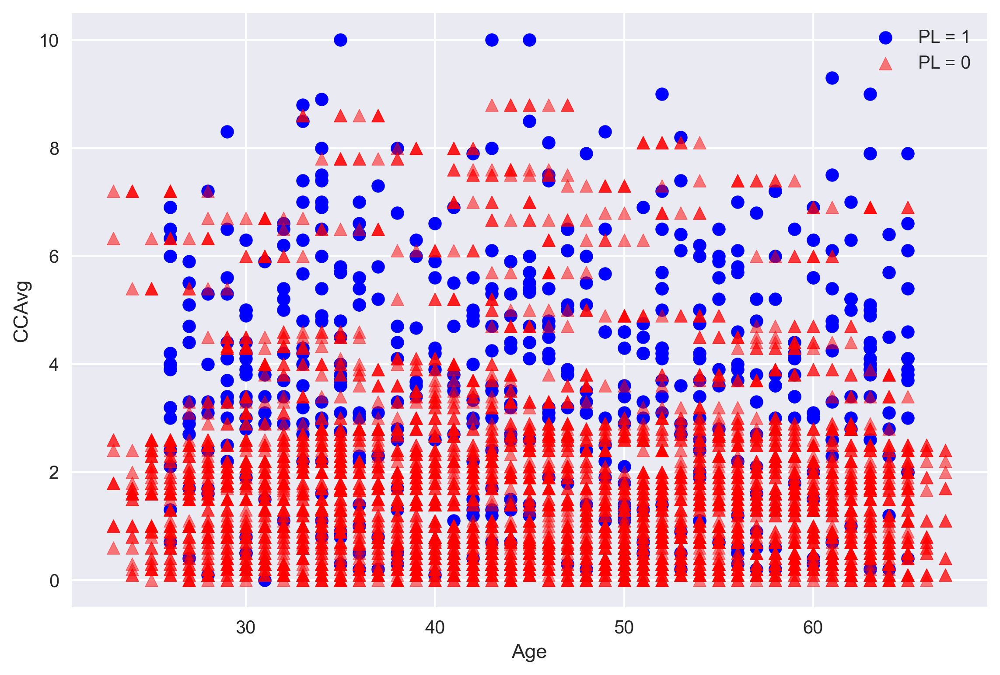

In [32]:
scatter_plot(data, 'Age', 'CCAvg', 'Personal Loan')

--- Along these two featues, class saprataion is more obvious. This can help with training a good model.

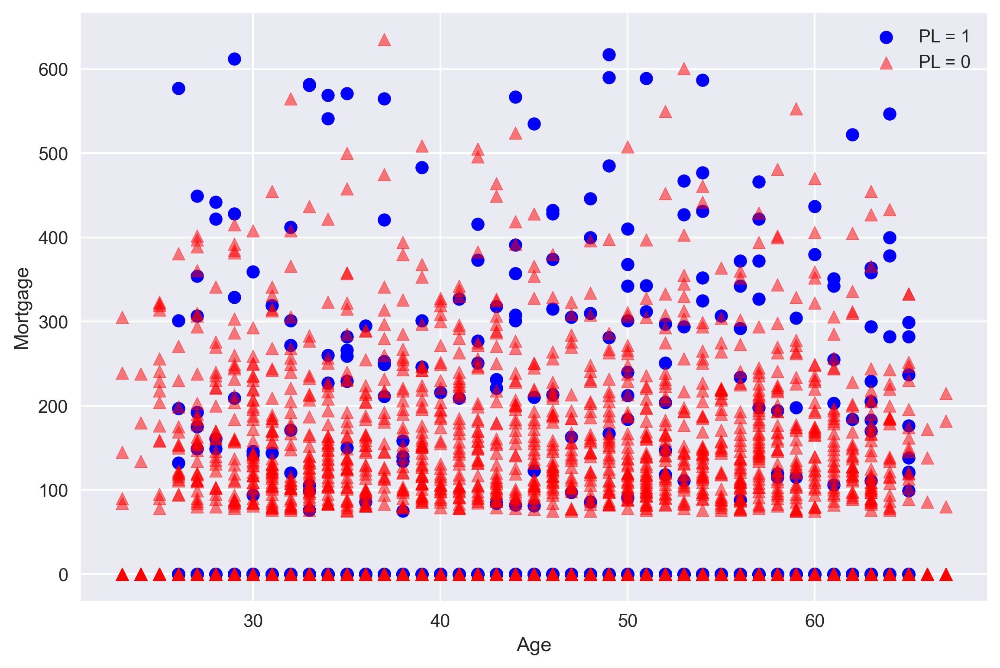

In [33]:
scatter_plot(data, 'Age', 'Mortgage', 'Personal Loan')

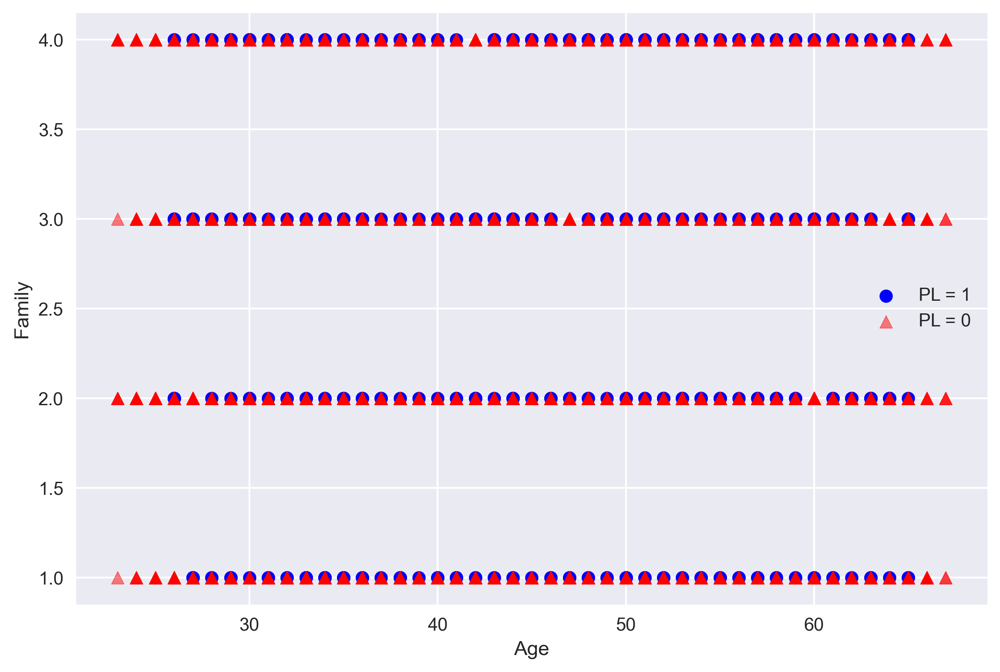

In [34]:
scatter_plot(data, 'Age', 'Family', 'Personal Loan')

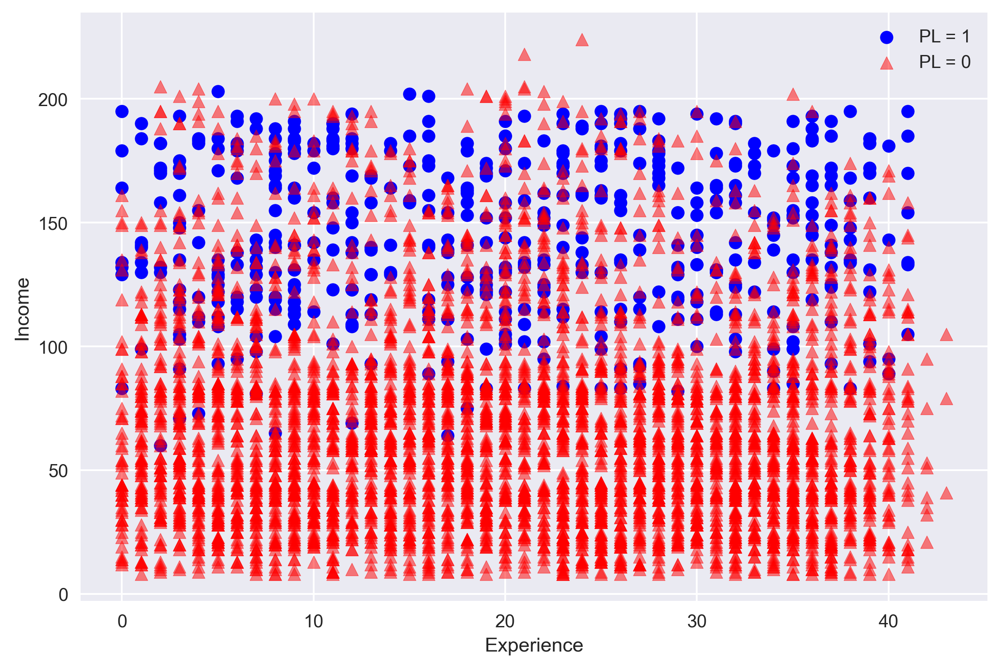

In [35]:
scatter_plot(data, 'Experience', 'Income', 'Personal Loan')

--- Just like *Age-CCAvg*, along *Experience-Income* plot classes can be separated quite easily.

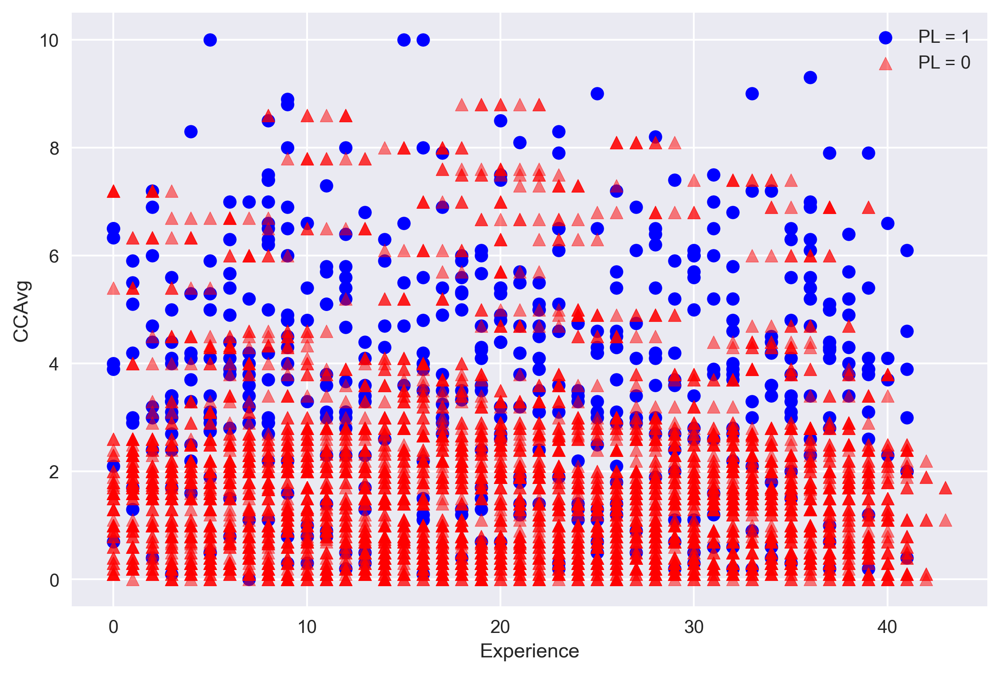

In [36]:
scatter_plot(data, 'Experience', 'CCAvg', 'Personal Loan')

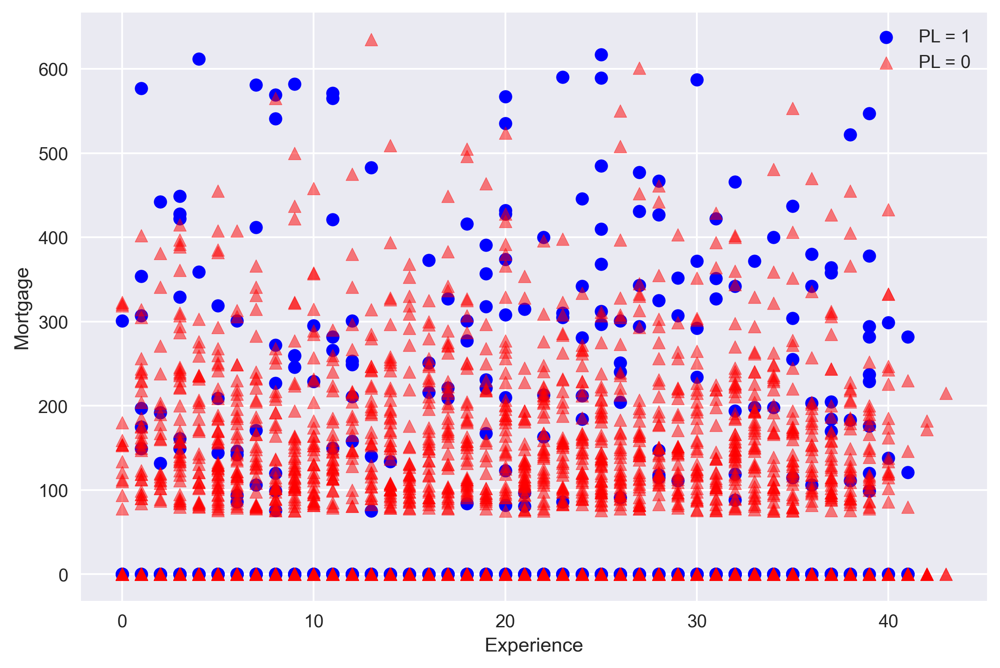

In [37]:
scatter_plot(data, 'Experience', 'Mortgage', 'Personal Loan')

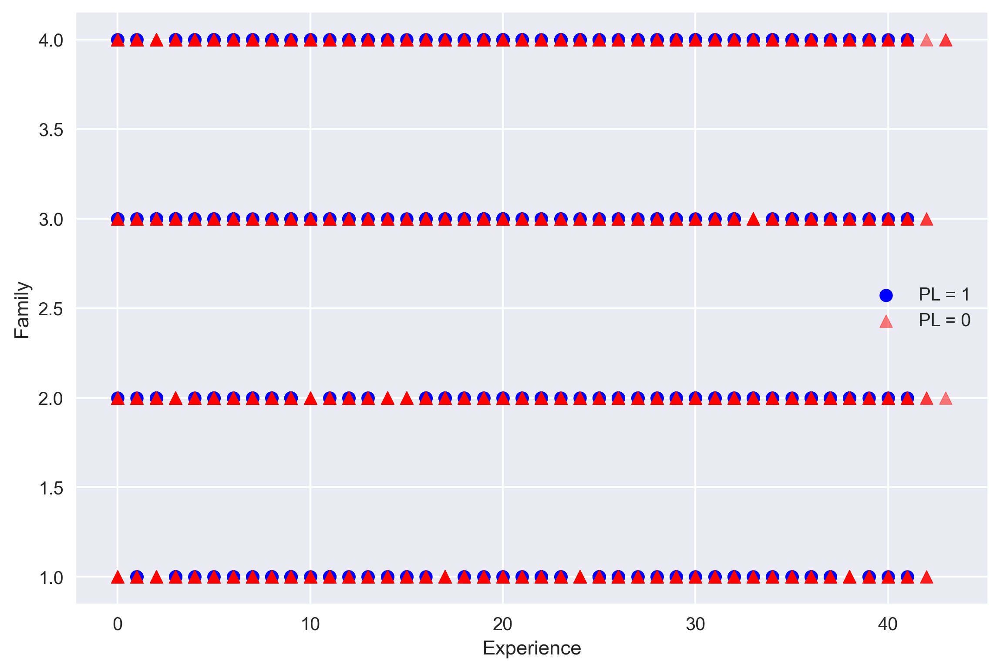

In [38]:
scatter_plot(data, 'Experience', 'Family', 'Personal Loan')

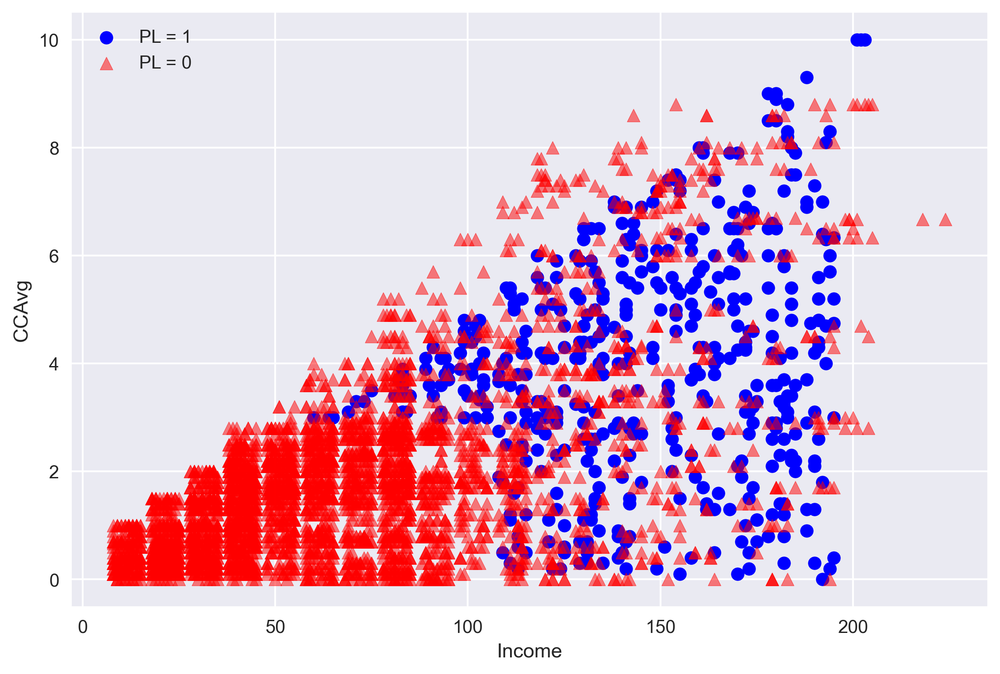

In [39]:
scatter_plot(data, 'Income', 'CCAvg', 'Personal Loan')

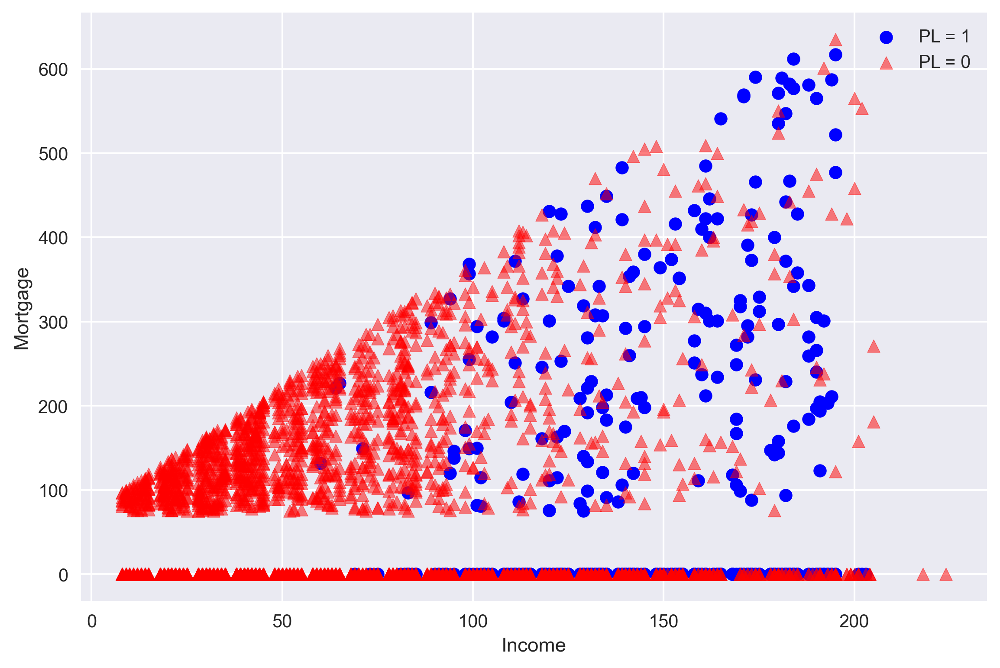

In [40]:
scatter_plot(data, 'Income', 'Mortgage', 'Personal Loan')

--- It seems that features *Income* is important for developing a classifier on this data.

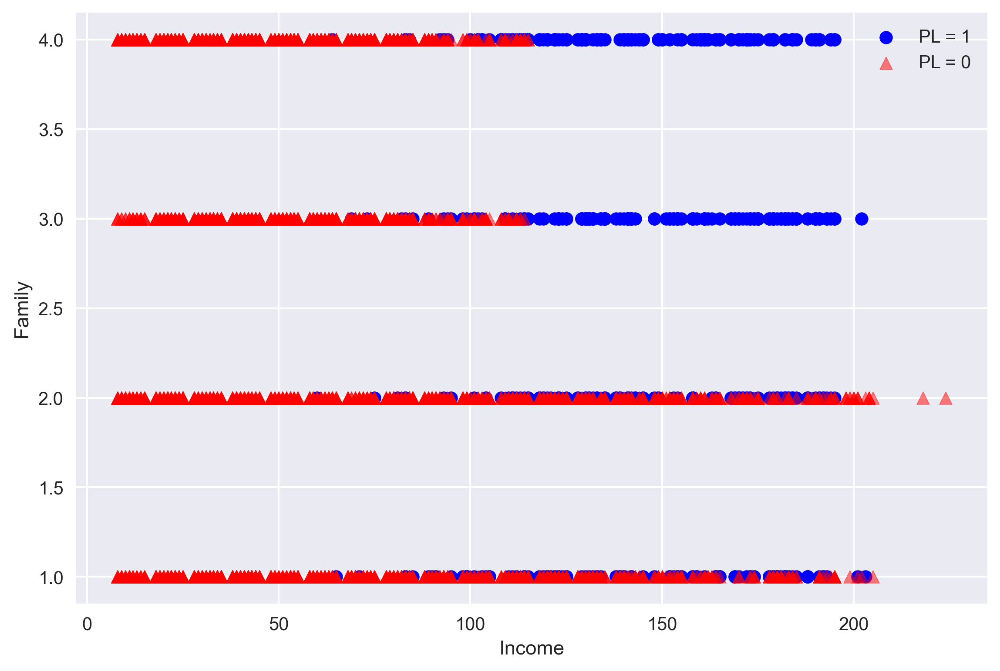

In [41]:
scatter_plot(data, 'Income', 'Family', 'Personal Loan')

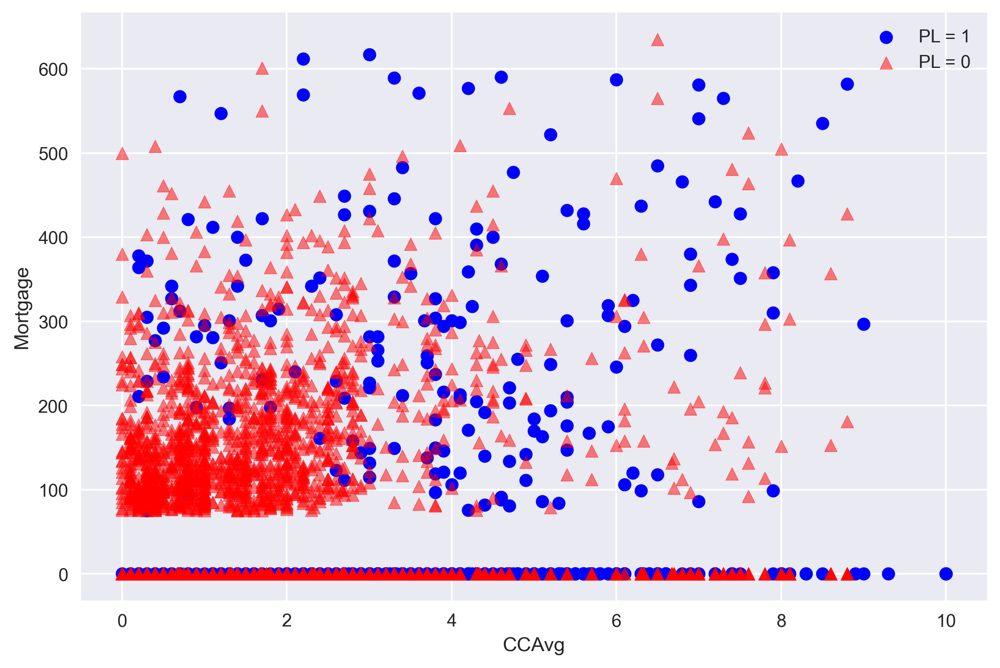

In [43]:
scatter_plot(data, 'CCAvg', 'Mortgage', 'Personal Loan')

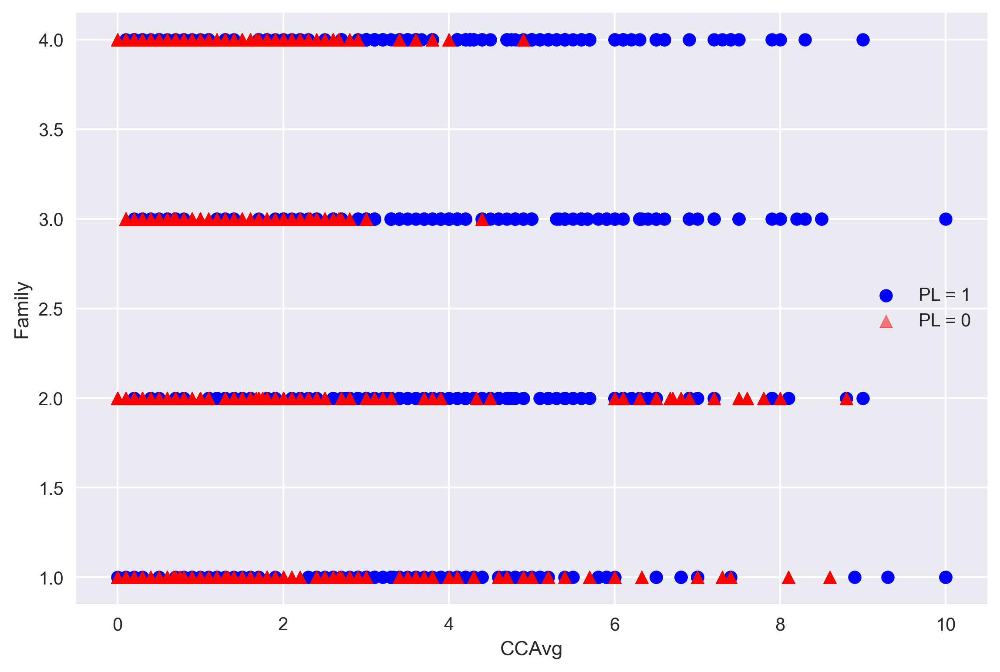

In [45]:
scatter_plot(data, 'CCAvg', 'Family', 'Personal Loan')

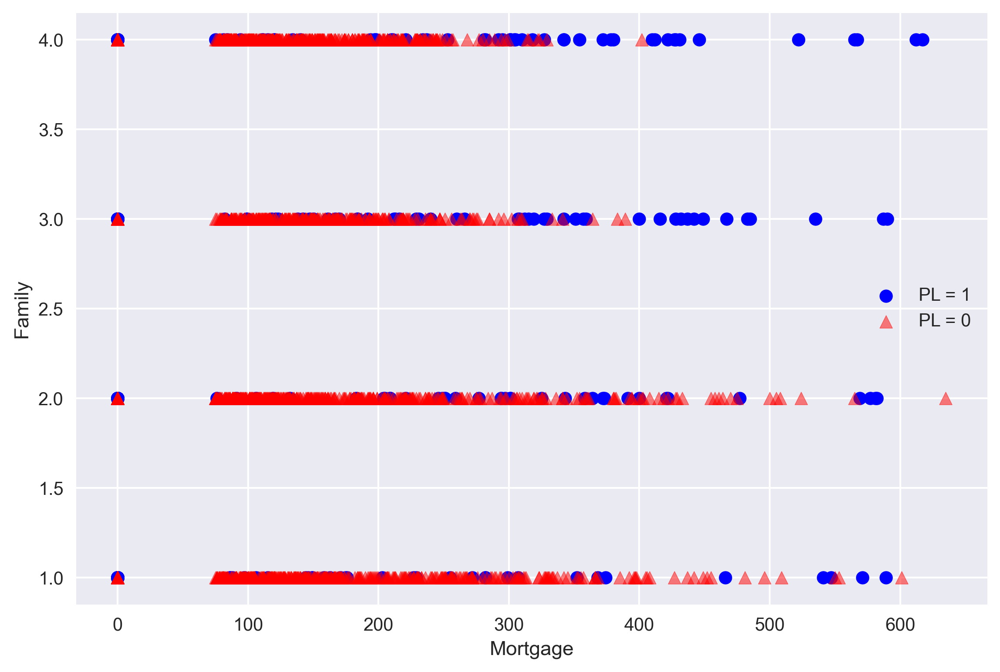

In [46]:
scatter_plot(data, 'Mortgage', 'Family', 'Personal Loan')

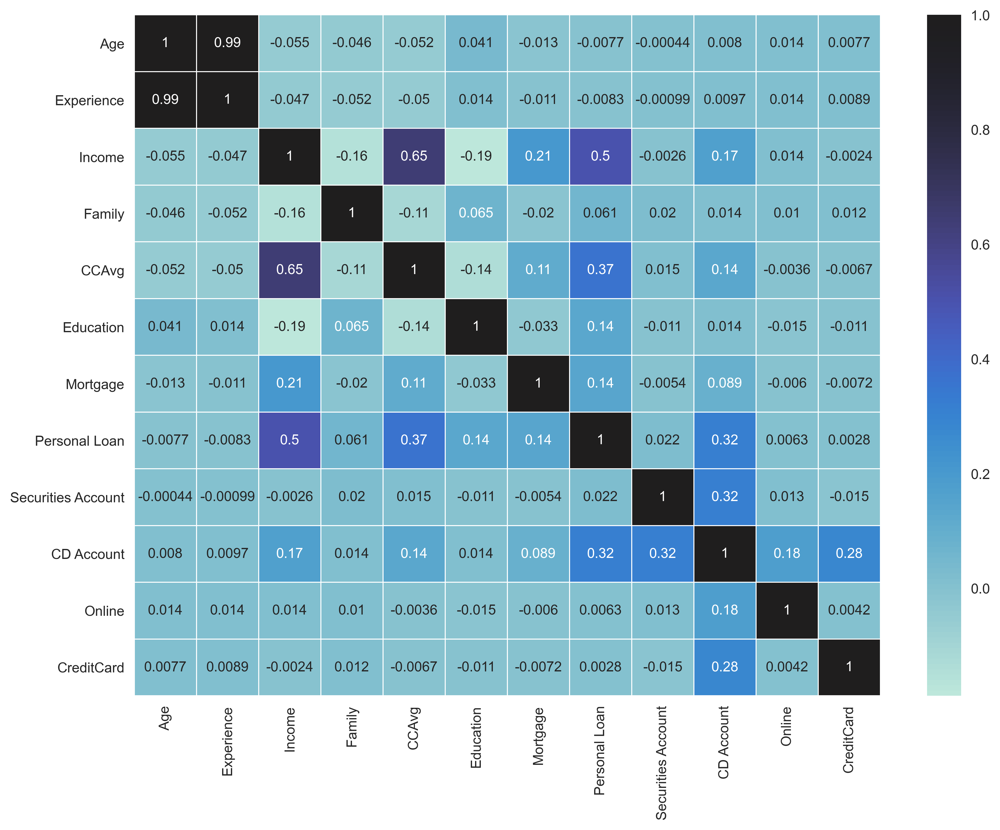

In [47]:
fig, ax = plt.subplots(figsize = (12, 9), dpi = 400)
sns.heatmap(data.corr(), center = 1, cbar = True, annot = True, linewidths = 0.5, ax = ax)
plt.show()

--- Almost 100 % correlation between *Age* and *Income*! 

--- *Income* has negative correlation with *Experience* and *Education*!

--- *Income* has the highest correlation with target. *CCAvg* and *CD Account* are the next ones.

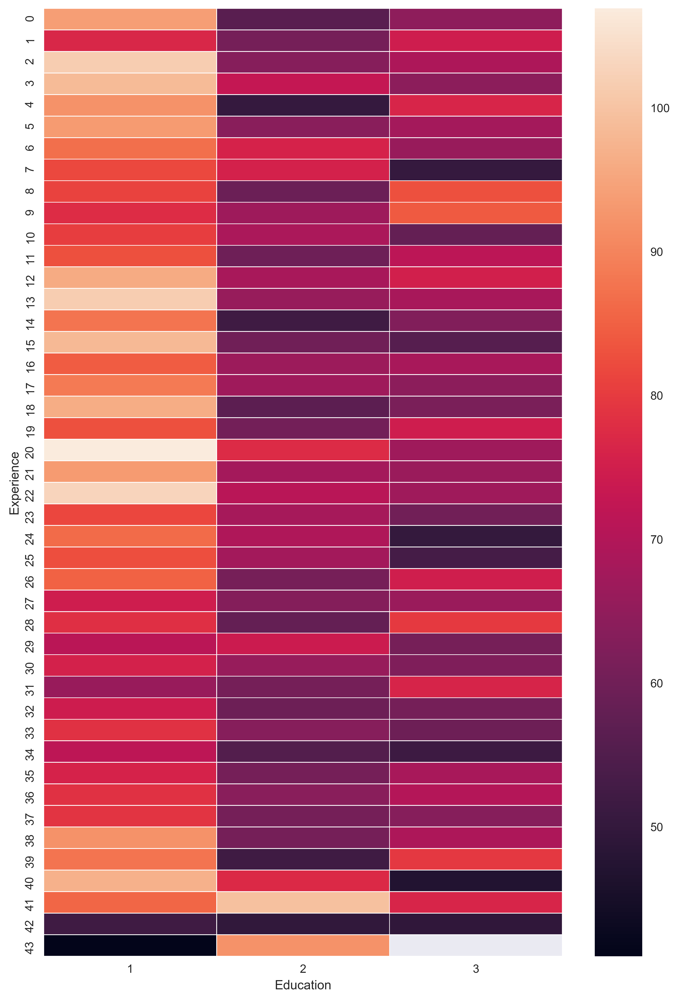

In [48]:
fig, ax = plt.subplots(figsize = (10, 15), dpi = 400)
edu_exp_inc = data.pivot_table(index = 'Experience', columns = 'Education', values = 'Income', aggfunc = 'mean')
sns.heatmap(edu_exp_inc, cbar = True, linewidths = 0.5, ax = ax)
plt.show()

--- As it can be seen, with class "1" of *Education*, *Income* values are higher regardless of *Experience* !

--- There are some groups with higher *Education* and *Experinece* with far lower income!

In [49]:
mask_edu = data['Education'] == 3
mask_exp = data['Experience'] == 40
data[mask_edu][mask_exp]

<ipython-input-49-abc842aff4b4>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data[mask_edu][mask_exp]


,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Personal Loan,Securities Account,CD Account,Online,CreditCard,City Code
255,66,40,42,2,0.7,3,138,0,0,0,0,1,21
407,64,40,58,1,1.8,3,0,0,0,0,1,0,34
444,64,40,91,2,0.0,3,0,0,0,0,1,1,31
507,64,40,32,3,0.1,3,0,0,0,0,1,0,13
907,64,40,15,2,0.3,3,115,0,0,0,1,1,17
1844,65,40,21,3,0.1,3,0,0,0,0,0,1,27
2128,65,40,40,1,1.1,3,0,0,0,0,0,0,41
2208,64,40,92,2,0.0,3,185,0,1,0,1,0,11
2220,65,40,80,1,0.8,3,0,0,0,0,1,0,41
2905,64,40,8,2,0.3,3,0,0,0,0,1,0,41


--- There are some datapoints in the table above that are suspecious to be noise, but as I don't have any access to the owner of the data, I'll keep them !

### Getting the data Ready for Training

In [55]:
data['Target'] = data['Personal Loan']
data.drop('Personal Loan', axis = 1, inplace = True)
data

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard,City Code,Target
0,25,1,49,4,1.6,1,0,1,0,0,0,11,0
1,45,19,34,3,1.5,1,0,1,0,0,0,00,0
2,39,15,11,1,1.0,1,0,0,0,0,0,47,0
3,35,9,100,1,2.7,2,0,0,0,0,0,41,0
4,35,8,45,4,1.0,2,0,0,0,0,1,13,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,29,3,40,1,1.9,3,0,0,0,1,0,26,0
4996,30,4,15,4,0.4,1,85,0,0,1,0,20,0
4997,63,39,24,2,0.3,3,0,0,0,0,0,30,0
4998,65,40,49,3,0.5,2,0,0,0,1,0,00,0


In [56]:
data_train, data_holdout = train_test_split(data, test_size = 0.05, shuffle = True, random_state = 1)
data_holdout

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard,City Code,Target
2764,31,5,84,1,2.9,3,105,0,0,0,1,13,0
4767,35,9,45,3,0.9,1,101,1,0,0,0,06,0
3814,34,9,35,3,1.3,1,0,0,0,0,0,43,0
3499,49,23,114,1,0.3,1,286,0,0,1,0,45,0
2735,36,12,70,3,2.6,2,165,0,0,1,0,21,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3904,29,5,18,1,0.4,3,94,0,0,1,1,41,0
4932,59,35,111,1,4.3,1,0,0,0,1,0,11,0
1050,53,27,145,2,6.1,3,294,0,1,1,1,00,1
4340,34,10,92,2,2.7,1,0,1,1,0,1,00,0


--- *data_holdout* will be used only for evaluation of the final model.

In [57]:
mask = data_train['Target'] == 1
len(data_train[mask]) / len(data_train)

0.09747368421052631

--- As only less than 10 percent of the 'Target' are in class "1", some extra techneques need to be adopted for tackling imbalanced classes problems.

In [58]:
mask = data_train['Target'] == 0
len(data_train[mask]) / len(data_train)   

0.9025263157894737

--- By setting all predctions equal to 0, we'll get accuracy score of 90.3 %, so accuracy is not a reliable evaluation metric for this imbalanced dataset!

In [59]:
for code in data_holdout['City Code'].value_counts().index:
    if code not in data_train['City Code'].value_counts().index:
        print(code)
print('-')

-


--- As the number of unique values in the "City Code" columns are too much to be encoded with One_Hot encoder, and as Label encoding technique can cause miscorrelation problem, binary encoding technique might be more snesible.

In [60]:
encoder = BinaryEncoder(cols = ['City Code'])
df_train = encoder.fit_transform(data_train)
df_train

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard,City Code_0,City Code_1,City Code_2,City Code_3,City Code_4,City Code_5,Target
1277,45,20,194,2,8.8,1,428,0,0,0,0,0,0,0,0,0,1,0
1398,42,18,141,1,3.5,1,0,0,0,0,0,0,0,0,0,1,0,0
3455,43,19,28,3,0.5,1,0,0,0,1,1,0,0,0,0,1,1,0
1333,62,38,99,4,1.7,2,0,0,0,1,0,0,0,0,1,0,0,0
3857,63,39,39,1,1.9,2,0,0,0,0,0,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2895,60,36,39,4,1.3,2,140,0,0,1,0,0,1,0,0,1,0,0
2763,55,31,13,4,0.7,1,0,0,0,1,0,0,1,1,0,0,1,0
905,46,22,28,1,1.0,1,84,0,0,1,1,0,0,0,1,1,1,0
3980,46,22,89,4,1.4,2,0,0,0,1,0,0,1,0,0,1,1,0


In [61]:
data_holdout = encoder.transform(data_holdout)

--- Encoder first fitted on the train set, then used to transform the final test set. It will be used as is for future data.

### Logistic Regression Classifier

In [62]:
# Function to check all metrics gievn true labels and predictions.

def classification_metrics(y_true, y_pred):
    print("accuracy :  ", metrics.accuracy_score(y_true, y_pred))
    print("precision : ", metrics.precision_score(y_true, y_pred))
    print("recall :    ", metrics.recall_score(y_true, y_pred))
    print("f1 :        ", metrics.f1_score(y_true, y_pred))
    print(metrics.confusion_matrix(y_true, y_pred))
    print(metrics.classification_report(y_true, y_pred))
    pass

In [70]:
# Function to compare solvres with normalizing process.

def scaled_logreg_cv(solver, features, target, max_iter):
    reg = LogisticRegression(solver = solver, max_iter = max_iter)
    scaler = MinMaxScaler()
    pipeline = Pipeline(steps = [('scale', scaler), ('model', reg)])
    kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
    scores = cross_val_score(pipeline, features, target.ravel(), scoring = 'f1', cv = kfold)
    return f'{solver} : \n{np.mean(scores)} \n{scores}\n'

In [71]:
# Function to compare solvers without any normalization.

def logreg_cv(solver, features, target, max_iter):
    reg = LogisticRegression(solver = solver, max_iter = max_iter)
    kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
    scores = cross_val_score(reg, features, target.ravel(), scoring = 'f1', cv = kfold)
    return f'{solver} : \n{np.mean(scores)} \n{scores}\n'

In [72]:
X = df_train.drop('Target', axis = 1).values
y = df_train['Target'].values
X.shape

(4750, 17)

In [73]:
solvers = ['newton-cg', 'liblinear', 'lbfgs', 'sag', 'saga']
for solver in solvers:
    print(scaled_logreg_cv(solver, X, y, 5000))

newton-cg : 
0.6927146723854041 
[0.68918919 0.61333333 0.76623377 0.70731707 0.6875    ]

liblinear : 
0.6851276978684794 
[0.68918919 0.59459459 0.75       0.69565217 0.69620253]

lbfgs : 
0.6927146723854041 
[0.68918919 0.61333333 0.76623377 0.70731707 0.6875    ]

sag : 
0.6927146723854041 
[0.68918919 0.61333333 0.76623377 0.70731707 0.6875    ]

saga : 
0.6944741499838079 
[0.69798658 0.61333333 0.76623377 0.70731707 0.6875    ]



In [74]:
solvers = ['newton-cg', 'liblinear', 'lbfgs', 'sag', 'saga']
for solver in solvers:
    print(logreg_cv(solver, X, y, 5000))

newton-cg : 
0.7052741776466784 
[0.6875     0.6163522  0.7875     0.73563218 0.6993865 ]

liblinear : 
0.7042160563428078 
[0.67924528 0.6025641  0.8        0.73988439 0.6993865 ]

lbfgs : 
0.7052741776466784 
[0.6875     0.6163522  0.7875     0.73563218 0.6993865 ]



C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the

sag : 
0.6746163638719398 
[0.62820513 0.56953642 0.78205128 0.71005917 0.68322981]

saga : 
0.662663775775395 
[0.64968153 0.55263158 0.76129032 0.67455621 0.67515924]



--- We can rule-out "sag" and "saga" solvers, as they have poor performance compared to the other solvers, and "sag" needs more iteration to converge so it is computationly cost inefficient for this dataset.

--- All models performed better without scaling.

--- Also, it is obvious that none of the folds has performed significantly lower than the others.

---"newton-cg" and "lbfgs" have almost identical performance.

##### 1 ---> "lbfgs"     2 ---> "newton-cg"     3 ---> "liblinaer"

In [75]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True, 
                                                    random_state = 1)

In [76]:
reg = LogisticRegression(solver = 'lbfgs', max_iter = 5000, n_jobs = -1)
params = {'penalty' : ['l2', 'none'], 'C' : [0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100], 
          'class_weight' : [None, 'balanced'], 'warm_start' : [False, True]}
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
gridsearch = GridSearchCV(reg, param_grid = params, scoring = 'f1', n_jobs = -1, cv = kfold)

In [77]:
gridsearch.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
             estimator=LogisticRegression(max_iter=5000, n_jobs=-1), n_jobs=-1,
             param_grid={'C': [0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100],
                         'class_weight': [None, 'balanced'],
                         'penalty': ['l2', 'none'],
                         'warm_start': [False, True]},
             scoring='f1')

In [78]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'C': 1, 'class_weight': None, 'penalty': 'l2', 'warm_start': False}
0.7078229043683588


--- Best Log Reg with "lbfgs" : default values

In [80]:
reg = LogisticRegression(solver = 'newton-cg', max_iter = 5000, n_jobs = -1)
params = {'penalty' : ['l2', 'none'], 'C' : [0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100], 
          'class_weight' : [None, 'balanced'], 'warm_start' : [False, True]}
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
gridsearch = GridSearchCV(reg, param_grid = params, scoring = 'f1', n_jobs = -1, cv = kfold)

In [81]:
gridsearch.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
             estimator=LogisticRegression(max_iter=5000, n_jobs=-1,
                                          solver='newton-cg'),
             n_jobs=-1,
             param_grid={'C': [0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100],
                         'class_weight': [None, 'balanced'],
                         'penalty': ['l2', 'none'],
                         'warm_start': [False, True]},
             scoring='f1')

In [82]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'C': 1, 'class_weight': None, 'penalty': 'l2', 'warm_start': False}
0.7078229043683588


--- Best Log Reg with "newton-cg" : default values

In [84]:
reg = LogisticRegression(solver = 'liblinear', max_iter = 20000)
params = {'penalty' : ['l1', 'l2'], 'C' : [0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100], 
          'class_weight' : [None, 'balanced'], 'dual' : [True, False], 'warm_start' : [False, True]}
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
gridsearch = GridSearchCV(reg, param_grid = params, scoring = 'f1', n_jobs = -1, cv = kfold)

In [85]:
gridsearch.fit(X_train, y_train)

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:918: UserWarning: One or more of the test scores are non-finite: [       nan        nan 0.67919851 0.67919851 0.67592198 0.67592198
 0.67919851 0.67919851        nan        nan 0.59743486 0.59801175
 0.5971116  0.5971116  0.59534768 0.59534768        nan        nan
 0.70136641 0.70136641 0.69254944 0.69254944 0.70136641 0.70136641
        nan        nan 0.60794067 0.60515905 0.60017839 0.60017839
 0.60011905 0.60011905        nan        nan 0.69492611 0.69606465
 0.69637465 0.69637465 0.69563634 0.69563634        nan        nan
 0.6200191  0.61687667 0.61986138 0.61928722 0.61077337 0.61077337
        nan        nan 0.69627225 0.69599621 0.696624   0.696624
 0.6989541  0.6989541         nan        nan 0.6273001  0.61581076
 0.61998407 0.61998407 0.61362381 0.61362381        nan        nan
 0.70419041 0.69480925 0.70422625 0.70422625 0.69754223 0.69754223
        nan        nan 0.64787953 0.64558612 0.61880295 

GridSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
             estimator=LogisticRegression(max_iter=20000, n_jobs=-1,
                                          solver='liblinear'),
             n_jobs=-1,
             param_grid={'C': [0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100],
                         'class_weight': [None, 'balanced'],
                         'dual': [True, False], 'penalty': ['l1', 'l2'],
                         'warm_start': [False, True]},
             scoring='f1')

--- After inspecting the warning above by setting the 'error_score' argument of GridSearchCV to 'raise', I realized that it stems from the combination of penalty = 'l1' and dual = True. So, it is not a problem for tuning the hyperparameters.

--- Another warning also raised as solver did not fully converge, so I changed max iteration to solve this problem and get consistent performance.

In [86]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'C': 50, 'class_weight': None, 'dual': False, 'penalty': 'l1', 'warm_start': False}
0.7052547447280173


--- Best Log Reg with "liblinar" : penalty = l1, C = 50

In [88]:
logreg_lbfgs = LogisticRegression(solver = 'lbfgs', max_iter = 5000, n_jobs = -1)
logreg_newton = LogisticRegression(solver = 'newton-cg', max_iter = 5000, n_jobs = -1)
logreg_liblin = LogisticRegression(solver = 'liblinear', penalty = 'l1', C = 50, max_iter = 20000)

In [89]:
logreg_lbfgs.fit(X_train, y_train.ravel())
logreg_liblin.fit(X_train, y_train.ravel())
logreg_newton.fit(X_train, y_train.ravel())

LogisticRegression(max_iter=5000, n_jobs=-1, solver='newton-cg')

In [90]:
# Performance on the train set:

y_lbfgs = logreg_lbfgs.predict(X_train)
y_liblin = logreg_liblin.predict(X_train)
y_newton = logreg_newton.predict(X_train)
i, solvers = 0, ['lbfgs', 'liblinaer', 'newton-cg']
for y_pred in [y_lbfgs, y_liblin, y_newton]:
    print(solvers[i])
    classification_metrics(y_train, y_pred)
    print('\n')
    i += 1

lbfgs
accuracy :   0.9502631578947368
precision :  0.8339350180505415
recall :     0.6176470588235294
f1 :         0.7096774193548389
[[3380   46]
 [ 143  231]]
              precision    recall  f1-score   support

           0       0.96      0.99      0.97      3426
           1       0.83      0.62      0.71       374

    accuracy                           0.95      3800
   macro avg       0.90      0.80      0.84      3800
weighted avg       0.95      0.95      0.95      3800



liblinaer
accuracy :   0.9505263157894737
precision :  0.8321428571428572
recall :     0.6229946524064172
f1 :         0.7125382262996942
[[3379   47]
 [ 141  233]]
              precision    recall  f1-score   support

           0       0.96      0.99      0.97      3426
           1       0.83      0.62      0.71       374

    accuracy                           0.95      3800
   macro avg       0.90      0.80      0.84      3800
weighted avg       0.95      0.95      0.95      3800



newton-cg
accura

--- All three solvers' performance are nearly identical.

---The problem is the relatively poor performance of the models on the positive class.

In [91]:
# Performace on the test set:

y_pred_lbfgs = logreg_lbfgs.predict(X_test)
y_pred_liblin = logreg_liblin.predict(X_test)
y_pred_newton = logreg_newton.predict(X_test)
i, solvers = 0, ['lbfgs', 'liblinaer', 'newton-cg']
for y_pred in [y_pred_lbfgs, y_pred_liblin, y_pred_newton]:
    print(solvers[i])
    classification_metrics(y_test, y_pred)
    print('\n')
    i += 1

lbfgs
accuracy :   0.9473684210526315
precision :  0.7746478873239436
recall :     0.6179775280898876
f1 :         0.6875
[[845  16]
 [ 34  55]]
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       861
           1       0.77      0.62      0.69        89

    accuracy                           0.95       950
   macro avg       0.87      0.80      0.83       950
weighted avg       0.94      0.95      0.94       950



liblinaer
accuracy :   0.9505263157894737
precision :  0.7916666666666666
recall :     0.6404494382022472
f1 :         0.7080745341614907
[[846  15]
 [ 32  57]]
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       861
           1       0.79      0.64      0.71        89

    accuracy                           0.95       950
   macro avg       0.88      0.81      0.84       950
weighted avg       0.95      0.95      0.95       950



newton-cg
accuracy :   0.94736842105

--- It can be seen that the performance of the model on the test set is slightly behind it's performance on the train set. However, the differences are not much, so overfitting is not a problem yet.

--- "liblinear" solver performed better and it's advantage is it's prediction power for class "1" .

##### As the classes of "Target" in the dataset are heavily imbalanced, I'll compare roc_auc_score for better insight and I'll use roc-curve and precision_recall_curve for threshold adjustment.

In [92]:
y_proba_lbfgs = logreg_lbfgs.predict_proba(X_test)[:, 1]
y_proba_liblin = logreg_liblin.predict_proba(X_test)[:, 1]
y_proba_newton = logreg_newton.predict_proba(X_test)[:, 1]

In [93]:
print("lbfgs AUC score :     ", round(metrics.roc_auc_score(y_test, y_proba_lbfgs), 5))
print("liblinear AUC score : ", round(metrics.roc_auc_score(y_test, y_proba_liblin), 5))
print("newton AUC score :    ", round(metrics.roc_auc_score(y_test, y_proba_newton), 5))

lbfgs AUC score :      0.96496
liblinear AUC score :  0.96514
newton AUC score :     0.96487


--- The differences are not significant.

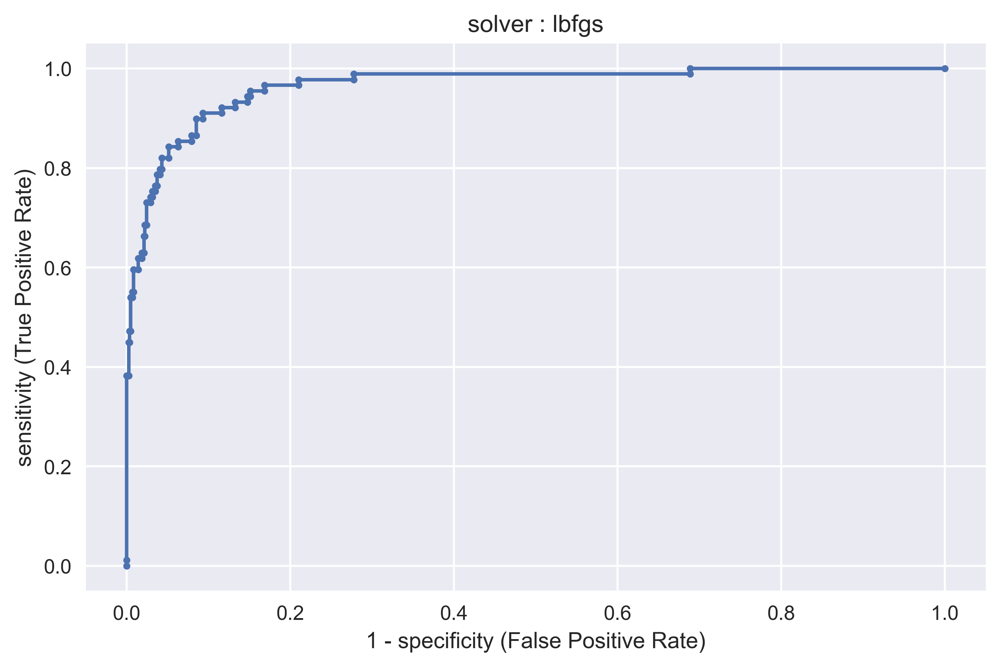

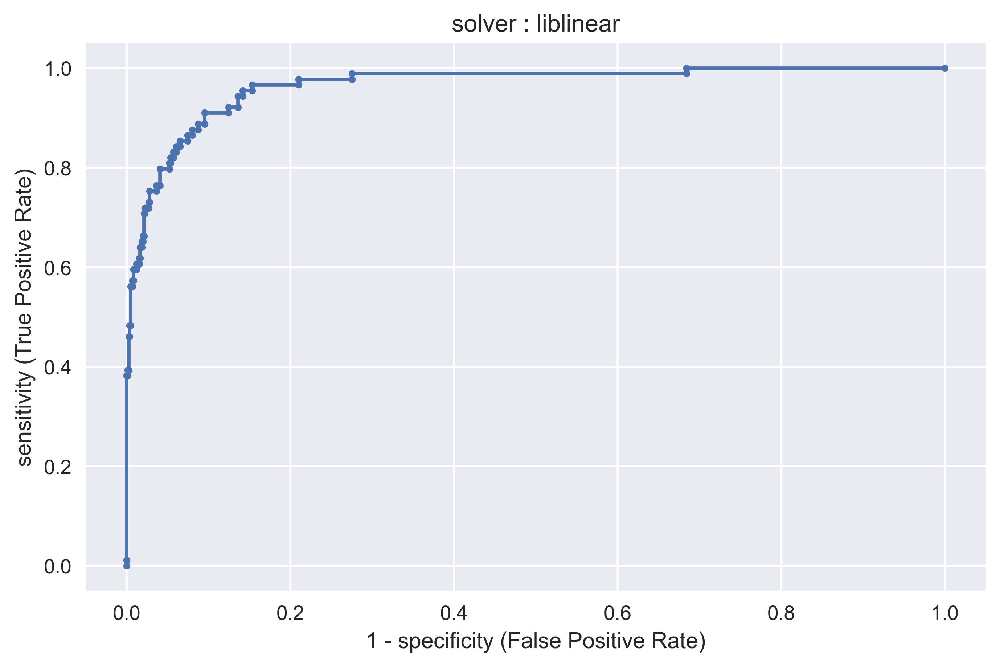

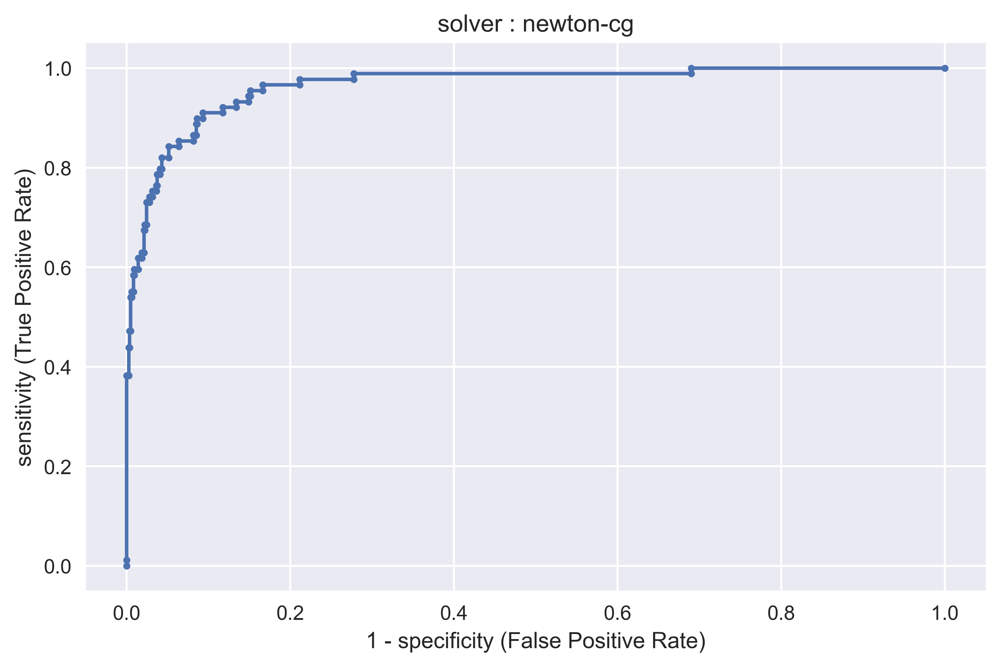

In [94]:
probabilities = (y_proba_lbfgs, y_proba_liblin, y_proba_newton)
solvers = ('lbfgs', 'liblinear', 'newton-cg')
for i in range(3):
    fpr, tpr, thresholds = metrics.roc_curve(y_test, probabilities[i])
    fig = plt.figure(figsize = (8, 5), dpi = 400)
    plt.plot(fpr, tpr, marker = '.')
    plt.xlabel('1 - specificity (False Positive Rate)')
    plt.ylabel('sensitivity (True Positive Rate)')
    plt.title(f'solver : {solvers[i]}')
plt.show()

In [98]:
probabilities = (y_proba_lbfgs, y_proba_liblin, y_proba_newton)
solvers = ('lbfgs', 'liblinear', 'newton-cg')
for i in range(3):
    fpr, tpr, thresholds = metrics.roc_curve(y_test, probabilities[i])
    j = tpr - fpr
    best_index = np.argmax(j)
    best_threshold = thresholds[best_index]
    print(f'{solvers[i]} : {best_threshold}', end = '\n')

lbfgs : 0.13090149523728392
liblinear : 0.12229870508052769
newton-cg : 0.13102381434014268


In [99]:
y_pred_lbfgs = y_proba_lbfgs >= 0.13090149523728392
y_pred_liblin = y_proba_liblin >= 0.12229870508052769
y_pred_newton = y_proba_newton >= 0.13102381434014268

In [100]:
i, solvers = 0, ['lbfgs', 'liblinaer', 'newton-cg']
for y_pred in [y_pred_lbfgs, y_pred_liblin, y_pred_newton]:
    print(solvers[i])
    classification_metrics(y_test, y_pred)
    print('\n')
    i += 1

lbfgs
accuracy :   0.9073684210526316
precision :  0.5031055900621118
recall :     0.9101123595505618
f1 :         0.648
[[781  80]
 [  8  81]]
              precision    recall  f1-score   support

           0       0.99      0.91      0.95       861
           1       0.50      0.91      0.65        89

    accuracy                           0.91       950
   macro avg       0.75      0.91      0.80       950
weighted avg       0.94      0.91      0.92       950



liblinaer
accuracy :   0.9052631578947369
precision :  0.49693251533742333
recall :     0.9101123595505618
f1 :         0.6428571428571429
[[779  82]
 [  8  81]]
              precision    recall  f1-score   support

           0       0.99      0.90      0.95       861
           1       0.50      0.91      0.64        89

    accuracy                           0.91       950
   macro avg       0.74      0.91      0.79       950
weighted avg       0.94      0.91      0.92       950



newton-cg
accuracy :   0.90736842105

--- Adjusting threshold using roc_curve worsened the performance of the models!

--- For getting a better result, precision_recall_curve will be used.

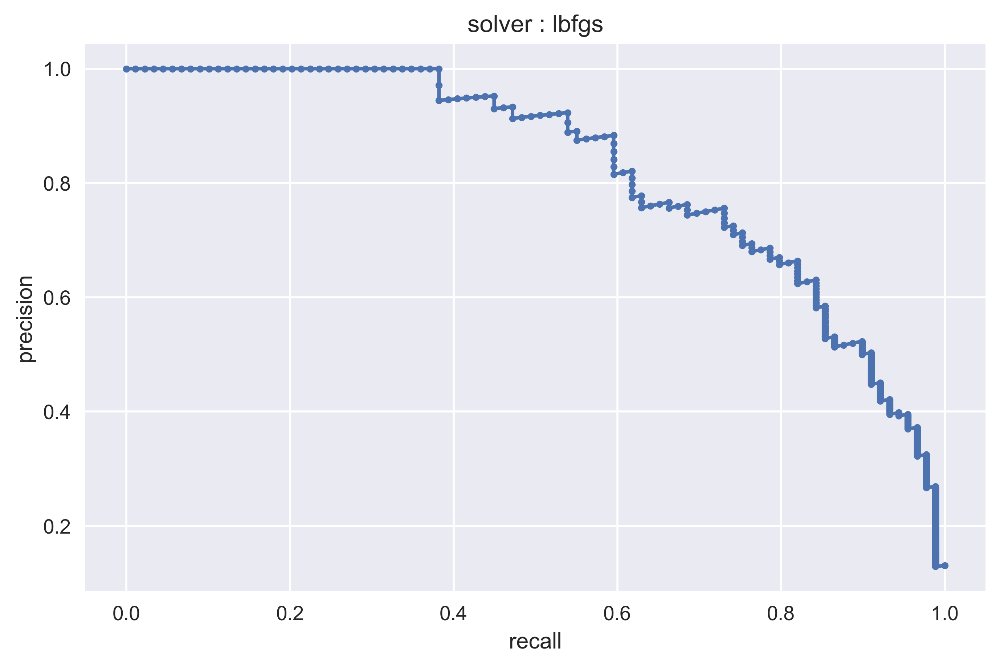

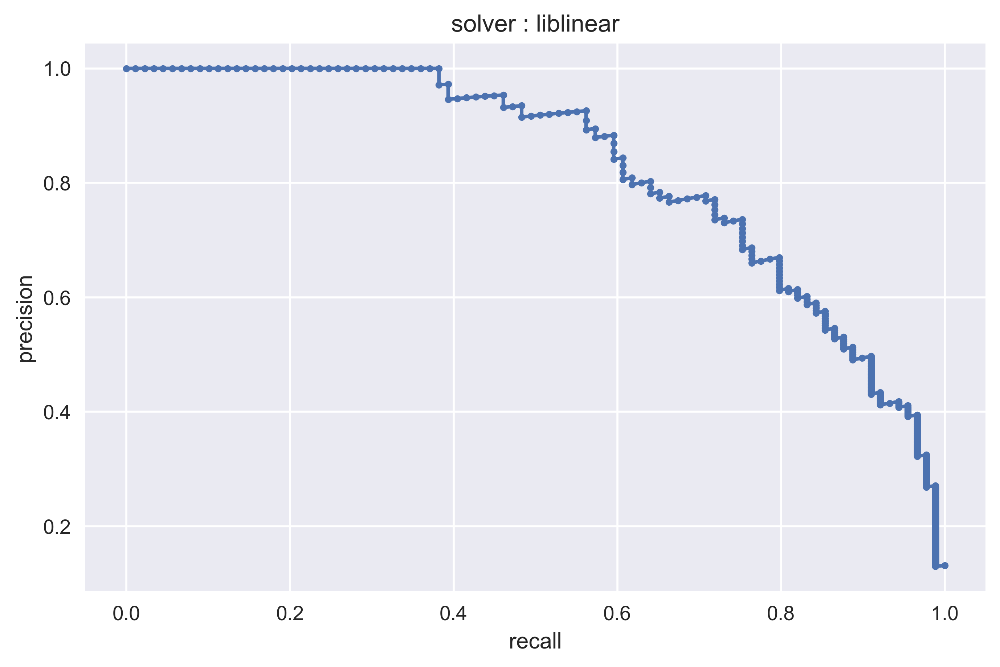

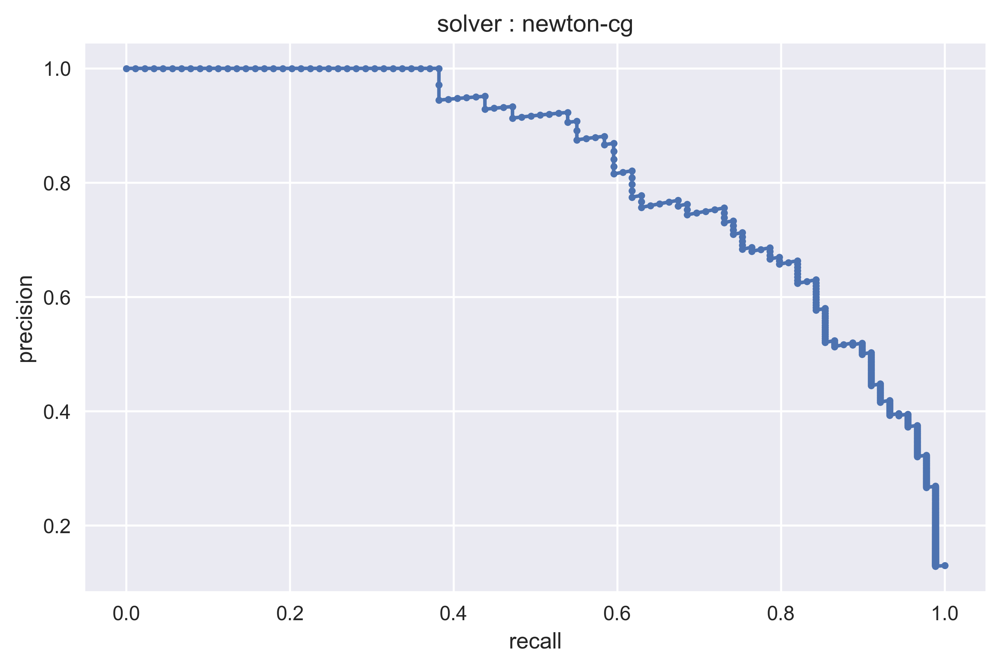

In [101]:
probabilities = (y_proba_lbfgs, y_proba_liblin, y_proba_newton)
solvers = ('lbfgs', 'liblinear', 'newton-cg')
for i in range(3):
    precision, recall, thresholds = metrics.precision_recall_curve(y_test, probabilities[i])
    fig = plt.figure(figsize = (8, 5), dpi = 400)
    plt.plot(recall, precision, marker = '.')
    plt.xlabel('recall')
    plt.ylabel('precision')
    plt.title(f'solver : {solvers[i]}')
plt.show()

In [102]:
probabilities = (y_proba_lbfgs, y_proba_liblin, y_proba_newton)
solvers = ('lbfgs', 'liblinear', 'newton-cg')
for i in range(3):
    precision, recall, thresholds = metrics.precision_recall_curve(y_test, probabilities[i])
    f1 = (2 * precision * recall) / (precision + recall)
    best_index = np.argmax(f1)
    best_threshold = thresholds[best_index]
    print(f'{solvers[i]} : {best_threshold}', end = '\n')

lbfgs : 0.370066327261714
liblinear : 0.35101267224121285
newton-cg : 0.37220331241134413


In [103]:
y_pred_lbfgs = y_proba_lbfgs >= 0.370066327261714
y_pred_liblin = y_proba_liblin >= 0.35101267224121285
y_pred_newton = y_proba_newton >= 0.37220331241134413

In [104]:
i, solvers = 0, ['lbfgs', 'liblinaer', 'newton-cg']
for y_pred in [y_pred_lbfgs, y_pred_liblin, y_pred_newton]:
    print(solvers[i])
    classification_metrics(y_test, y_pred)
    print('\n')
    i += 1

lbfgs
accuracy :   0.9526315789473684
precision :  0.7558139534883721
recall :     0.7303370786516854
f1 :         0.7428571428571429
[[840  21]
 [ 24  65]]
              precision    recall  f1-score   support

           0       0.97      0.98      0.97       861
           1       0.76      0.73      0.74        89

    accuracy                           0.95       950
   macro avg       0.86      0.85      0.86       950
weighted avg       0.95      0.95      0.95       950



liblinaer
accuracy :   0.9515789473684211
precision :  0.7362637362637363
recall :     0.7528089887640449
f1 :         0.7444444444444445
[[837  24]
 [ 22  67]]
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       861
           1       0.74      0.75      0.74        89

    accuracy                           0.95       950
   macro avg       0.86      0.86      0.86       950
weighted avg       0.95      0.95      0.95       950



newton-cg
accuracy :   0

--- As it can be seen, unlike roc_curve, adjusting threshold using precision_recall_curve improved the models So, for the next parts roc_curve will not be used for threshold adjustment.

In [105]:
cols_corr = []
for col in df_train.columns[:-1]:
    score = np.corrcoef(df_train[col], df_train['Target'])[0][1]
    cols_corr.append(f'{col} : {score}')
cols_corr = sorted(cols_corr, key = lambda x:abs(float(x.split(' : ')[-1])), reverse = True)
print('\n'.join(cols_corr))

Income : 0.5071716837233925
CCAvg : 0.3671895627523366
CD Account : 0.31229490861459186
Mortgage : 0.1445939823951202
Education : 0.13629030636047107
Family : 0.06106769831155606
City Code_1 : -0.050921535186928095
City Code_2 : 0.03521232875459312
City Code_4 : 0.02484746816589264
Securities Account : 0.02373711400188962
City Code_0 : 0.015640186231966592
Experience : -0.011285380285991777
Age : -0.010669093003494022
City Code_5 : -0.008540400713413946
City Code_3 : -0.008413034022976365
Online : 0.007826116691945679
CreditCard : -0.002625098384089532


--- As both "Age" and "Experience" has low correlation coef with the target, and because they are highly correlated with each other, dropping one of them may improve the model.

In [106]:
X = df_train.drop(['Target', 'Age'], axis = 1).values
y = df_train['Target'].values

In [107]:
solvers = ['newton-cg', 'liblinear', 'lbfgs']
for solver in solvers:
    print(logreg_cv(solver, X, y, 5000))

newton-cg : 
0.7053794551965826 
[0.69565217 0.6163522  0.77987421 0.73563218 0.6993865 ]

liblinear : 
0.6905351507780639 
[0.69281046 0.59872611 0.75816993 0.70731707 0.69565217]

lbfgs : 
0.7069655692172321 
[0.69565217 0.6163522  0.77987421 0.73563218 0.70731707]



--- It seems that multicollinearity is not a problem here as scores didn't change at all!

### More Visualization and Experiment with Logistic Regression

--- Returning to the scatter plots on the data analysis section, it can be seen that the target classes are not always separable along features. But, there are some features along which, target classes are seperable to a good extent. Thus, creating features from the original ones might help the model to perform better.

--- Aiming this, some explaratory plots will be drawn before training the model on each part.

--- Plots will be drawn against "Age" because of the low separability of target classes along it, so it can provide us with a better insight.

In [108]:
data['Income - CCAvg'] = data['Income'] * data['CCAvg']
data['Income - Mortgage'] = data['Income'] * data['Mortgage']
data['CCAvg - Mortgage'] = data['CCAvg'] * data['Mortgage']
mask = data['Target'] == 1

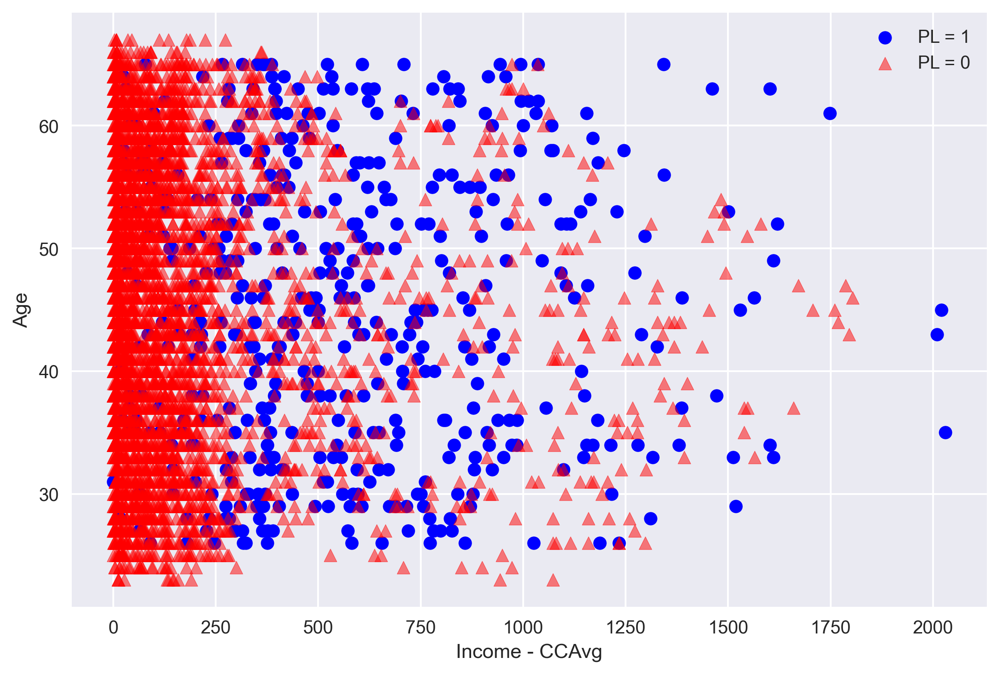

In [111]:
scatter_plot(data, 'Income - CCAvg', 'Age', 'Target')

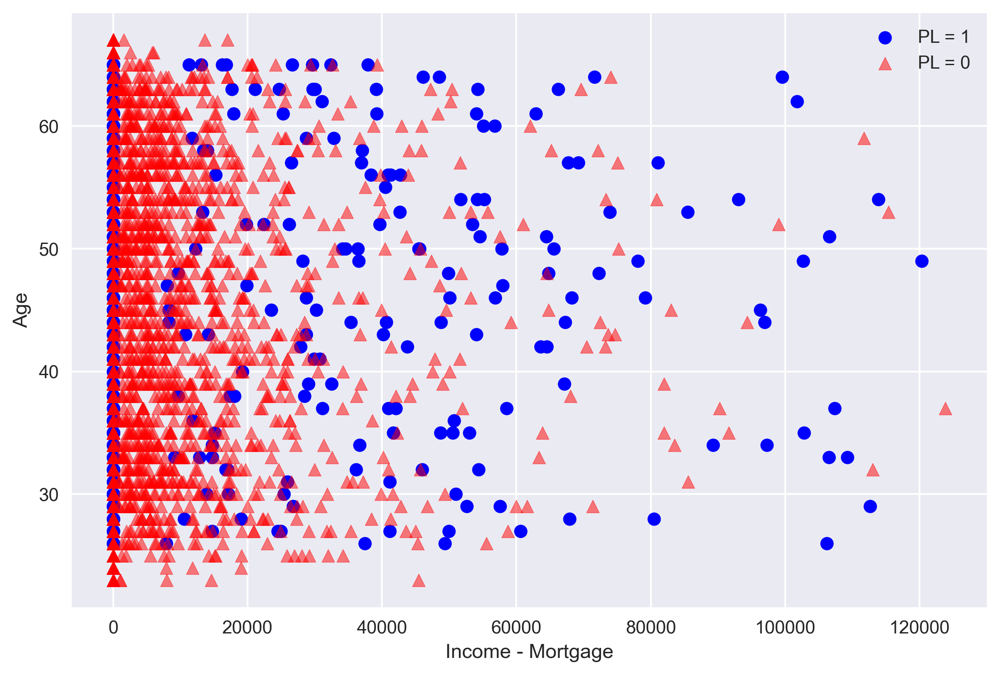

In [112]:
scatter_plot(data, 'Income - Mortgage', 'Age', 'Target')

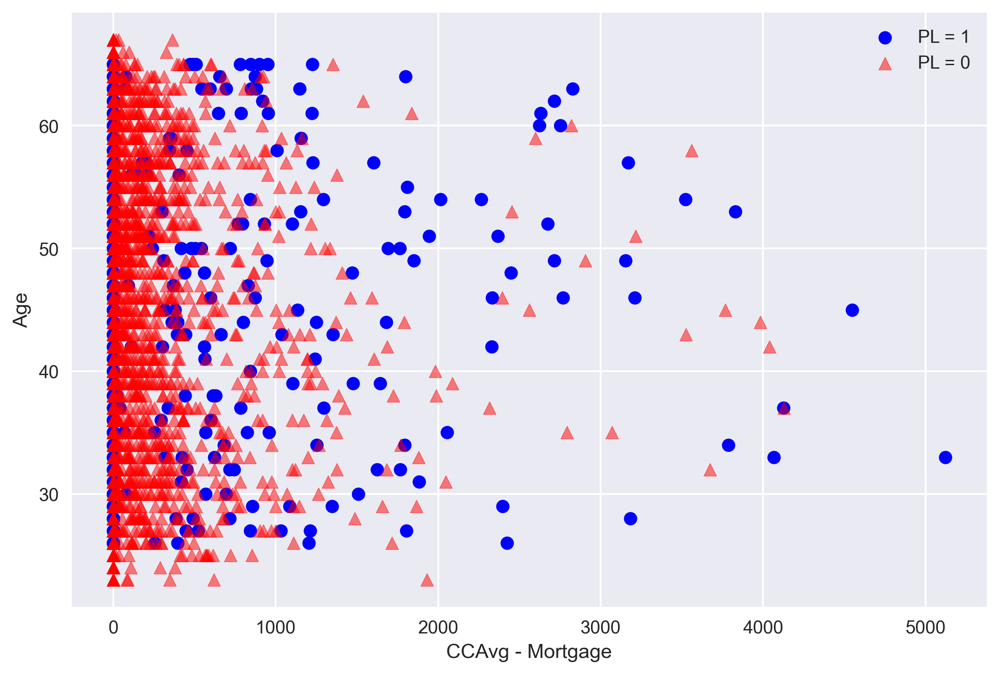

In [113]:
scatter_plot(data, 'CCAvg - Mortgage', 'Age', 'Target')

--- As it can be seen, target classes along the synthetic feature "Income - CCAvg" are separable. In comparison, along synthetic features using "Mortgage", target classes are not seperable enough due to the high number of zero values in the "Mortgage" column.

In [114]:
# removing added features from the original data, and add chosen ones to the training data
data.drop(['Income - CCAvg', 'Income - Mortgage', 'CCAvg - Mortgage'], axis = 1, inplace = True)

df_train['Income - CCAvg'] = df_train['Income'] * df_train['CCAvg']

In [115]:
X = df_train.drop('Target', axis = 1).values
y = df_train['Target'].values

In [116]:
solvers = ['newton-cg', 'liblinear', 'lbfgs']
for solver in solvers:
    print(scaled_logreg_cv(solver, X, y, 5000))

newton-cg : 
0.7030928915889101 
[0.72483221 0.62162162 0.77419355 0.70731707 0.6875    ]

liblinear : 
0.691025763786375 
[0.69798658 0.60273973 0.75       0.7        0.70440252]

lbfgs : 
0.7030928915889101 
[0.72483221 0.62162162 0.77419355 0.70731707 0.6875    ]



In [117]:
solvers = ['newton-cg', 'liblinear', 'lbfgs']
for solver in solvers:
    print(logreg_cv(solver, X, y, 5000))

newton-cg : 
0.7493006635234583 
[0.76363636 0.68322981 0.8125     0.74725275 0.73988439]

liblinear : 
0.7417681025865123 
[0.74846626 0.67088608 0.81290323 0.74285714 0.73372781]

lbfgs : 
0.747654700790539 
[0.76363636 0.675      0.8125     0.74725275 0.73988439]



--- Performance of the models improved considerately, so "Income - CCAvg" will be kept.

--- based on the results, normalizing data worsens the f1 score, so it will not be used.

In [119]:
data['Income - Family'] = data['Income'] * data['Family']
data['CCAvg - Family'] = data['CCAvg'] * data['Family']

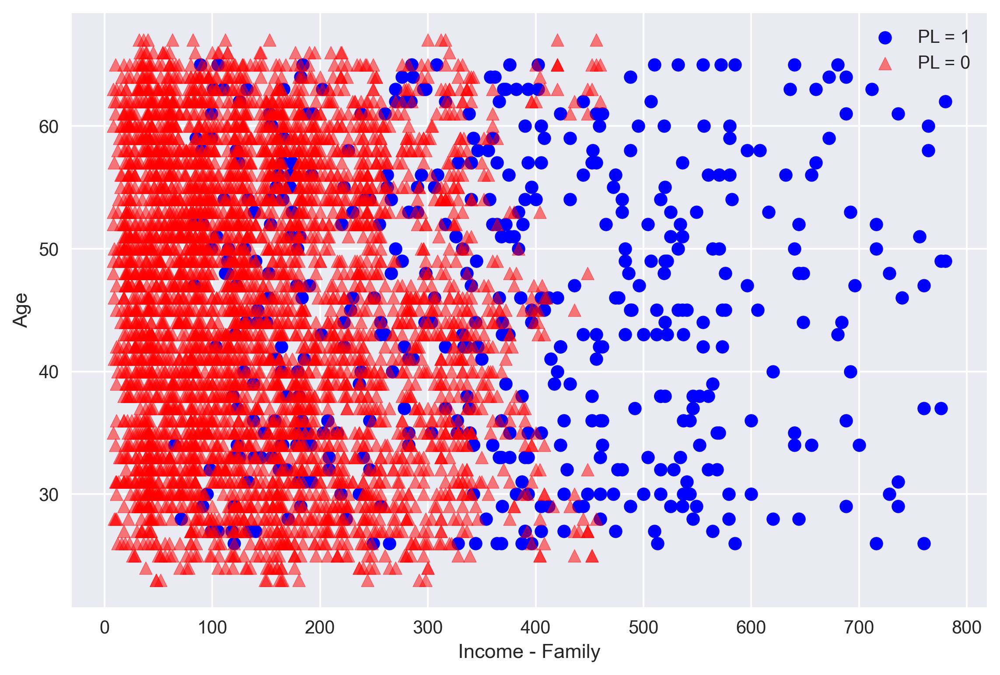

In [120]:
scatter_plot(data, 'Income - Family', 'Age', 'Target')

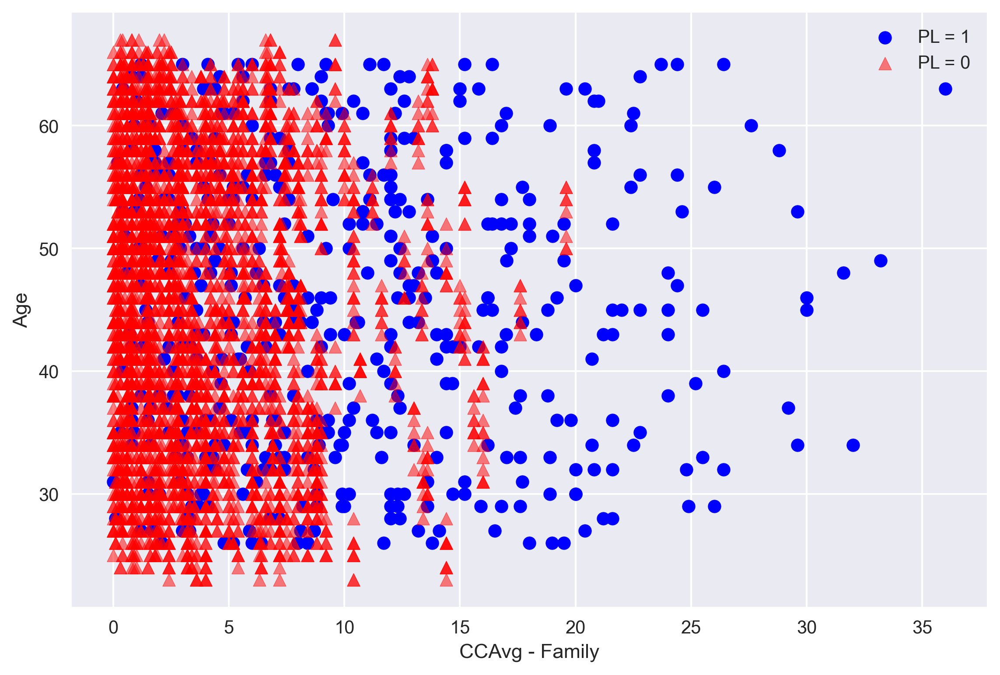

In [121]:
scatter_plot(data, 'CCAvg - Family', 'Age', 'Target')

--- Synthetic feature created by multiplying "Income" and "Family" shows a feature along which, target classes are well separable. 

--- Combination of "CCAvg" and "Family" is not as good as the one mentioned above, but it might improve the model.

In [122]:
data.drop(['Income - Family','CCAvg - Family'], axis = 1, inplace = True)

df_train['Income - Family'] = df_train['Income'] * df_train['Family']

In [123]:
X = df_train.drop('Target', axis = 1).values
y = df_train['Target'].values

In [124]:
solvers = ['newton-cg', 'liblinear', 'lbfgs']
for solver in solvers:
    print(logreg_cv(solver, X, y, 5000))

newton-cg : 
0.7812895973034004 
[0.80924855 0.69565217 0.83229814 0.76243094 0.80681818]

liblinear : 
0.7805431191339136 
[0.80473373 0.6875     0.85       0.76502732 0.79545455]

lbfgs : 
0.7799259609397641 
[0.80924855 0.69565217 0.83229814 0.76243094 0.8       ]



In [125]:
df_train['CCAvg - Family'] = df_train['CCAvg'] * df_train['Family']

X = df_train.drop('Target', axis = 1).values
y = df_train['Target'].values

In [126]:
solvers = ['newton-cg', 'liblinear', 'lbfgs']
for solver in solvers:
    print(logreg_cv(solver, X, y, 5000))

newton-cg : 
0.7787949056591519 
[0.80924855 0.7        0.82716049 0.77595628 0.7816092 ]

liblinear : 
0.7795354243252276 
[0.80473373 0.6875     0.85714286 0.76923077 0.77906977]

lbfgs : 
0.7787949056591519 
[0.80924855 0.7        0.82716049 0.77595628 0.7816092 ]



--- Based on the f1 scores above, "Income - Family" improved all the models , but "CCAvg - Family" did not imporve any of the models.

In [127]:
df_train.drop('CCAvg - Family', axis = 1, inplace = True)

In [128]:
data['Income - Age'] = data['Income'] * data['Age']
data['Income - Expereince'] = data['Income'] * data['Experience']

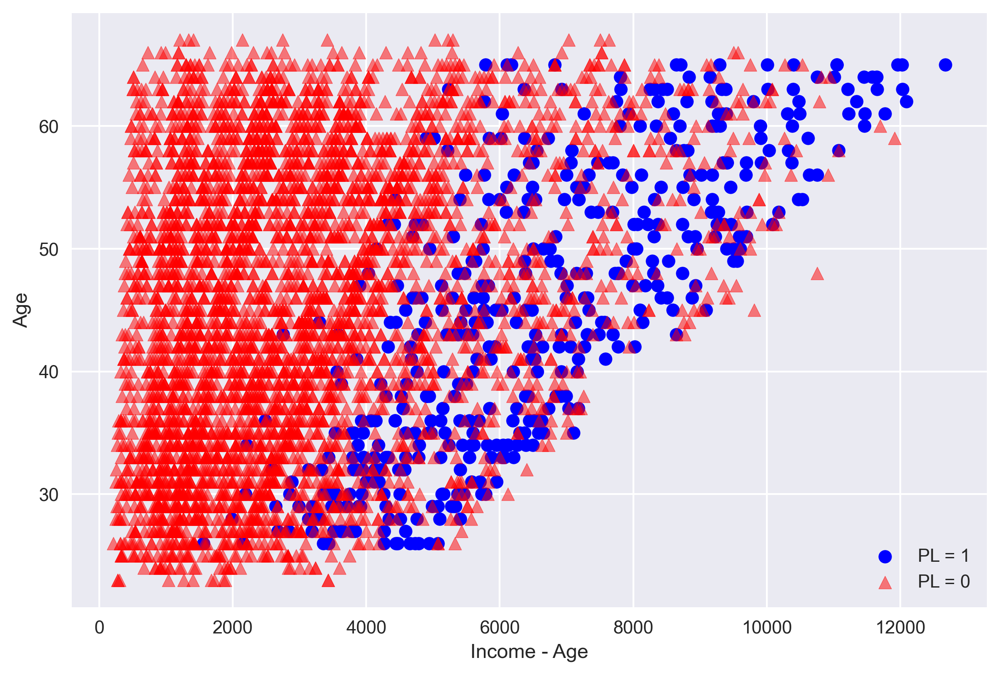

In [129]:
scatter_plot(data, 'Income - Age', 'Age', 'Target')

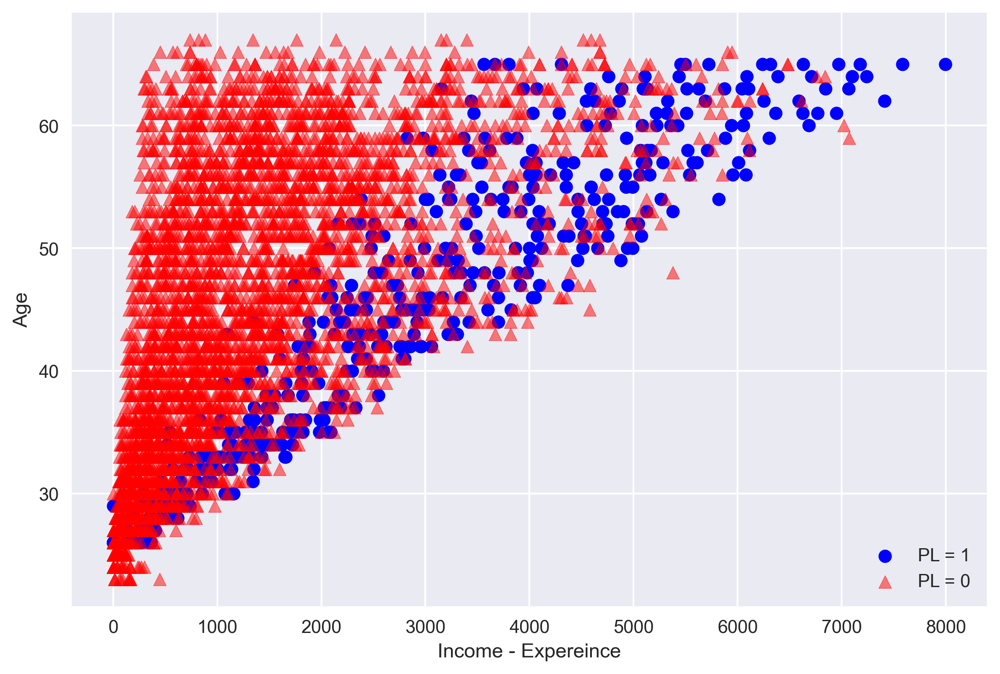

In [131]:
scatter_plot(data, 'Income - Expereince', 'Age', 'Target')

--- Linear multiplication of "Income" with "Age" and "Experience" can show the difference between two classes of the target far better than the sole "Age" or "Expereince".

In [132]:
data.drop(['Income - Age','Income - Expereince'], axis = 1, inplace = True)

df_train['Income - Age'] = df_train['Income'] * df_train['Age']

In [133]:
X = df_train.drop('Target', axis = 1).values
y = df_train['Target'].values

In [134]:
solvers = ['newton-cg', 'liblinear', 'lbfgs']
for solver in solvers:
    print(logreg_cv(solver, X, y, 5000))

C:\Users\ASUS\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\ASUS\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\ASUS\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\ASUS\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\ASUS\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line searc

newton-cg : 
0.7851653005717392 
[0.80924855 0.7037037  0.84146341 0.77595628 0.79545455]

liblinear : 
0.7727607624759049 
[0.8        0.68322981 0.83229814 0.76666667 0.7816092 ]

lbfgs : 
0.7785911853414145 
[0.79310345 0.69135802 0.84662577 0.77777778 0.78409091]



--- Because of the convergence warning, max_iter must be set to higher numbers.

In [135]:
solvers = ['newton-cg', 'liblinear', 'lbfgs']
for solver in solvers:
    print(logreg_cv(solver, X, y, 50000))

C:\Users\ASUS\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\ASUS\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\ASUS\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\ASUS\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\ASUS\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line searc

newton-cg : 
0.7851653005717392 
[0.80924855 0.7037037  0.84146341 0.77595628 0.79545455]

liblinear : 
0.7727607624759049 
[0.8        0.68322981 0.83229814 0.76666667 0.7816092 ]

lbfgs : 
0.7785911853414145 
[0.79310345 0.69135802 0.84662577 0.77777778 0.78409091]



--- As it can be seen on the former cell, "newton-cg" solver cannot converge even within 50000 iterations. So it will not be used as it might show inconsistent performance and poor generalization.

In [136]:
df_train.drop('Income - Age', axis = 1, inplace = True)
df_train['Income - Experience'] = df_train['Income'] * df_train['Experience']

X = df_train.drop(['Target'], axis = 1).values
y = df_train['Target'].values

In [137]:
solvers = ['newton-cg', 'liblinear', 'lbfgs']
for solver in solvers:
    print(logreg_cv(solver, X, y, 5000))

newton-cg : 
0.7833482102998761 
[0.80924855 0.7037037  0.83229814 0.76923077 0.80225989]

liblinear : 
0.7798779214595059 
[0.79069767 0.70731707 0.83950617 0.77777778 0.78409091]

lbfgs : 
0.7737592515453906 
[0.80701754 0.68292683 0.83950617 0.76923077 0.77011494]



In [139]:
df_train['Income - Age'] = df_train['Income'] * df_train['Age']

X = df_train.drop('Target', axis = 1).values
y = df_train['Target'].values

In [140]:
solvers = ['newton-cg', 'liblinear', 'lbfgs']
for solver in solvers:
    print(logreg_cv(solver, X, y, 5000))

C:\Users\ASUS\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\ASUS\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\ASUS\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\ASUS\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:327: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
C:\Users\ASUS\anaconda3\lib\site-packages\scipy\optimize\linesearch.py:478: LineSearchWarning: The line search algorithm did not converge
  warn('The line searc

newton-cg : 
0.7938099170952119 
[0.81176471 0.71604938 0.85889571 0.78688525 0.79545455]

liblinear : 
0.7821572734603178 
[0.8045977  0.71165644 0.83950617 0.77595628 0.77906977]

lbfgs : 
0.7770312374113268 
[0.77966102 0.71165644 0.8447205  0.76502732 0.78409091]



--- "newton-cg" solver fails to work properly while "Income - Age" is included in the dataset !
  
--- Presence of both features "Income - Age" and "Income - Experience" imporved models, but "liblinear" changed more than "lbfgs", and "newton-cg" did not converge.

--- Apart from "Income" and "CCAvg", using other continuous feature for creating synthtic features cannot imporve the model. "Age" and "Experience" are not correlated with the target at all, and "Mortgage" has a lot of values equal to 0, cause miscorrelation and worsen the model.

In [141]:
df_train.columns

Index(['Age', 'Experience', 'Income', 'Family', 'CCAvg', 'Education',
       'Mortgage', 'Securities Account', 'CD Account', 'Online', 'CreditCard',
       'City Code_0', 'City Code_1', 'City Code_2', 'City Code_3',
       'City Code_4', 'City Code_5', 'Target', 'Income - CCAvg',
       'Income - Family', 'Income - Experience', 'Income - Age'],
      dtype='object')

In [142]:
X = df_train.drop('Target', axis = 1).values
y = df_train['Target'].values

In [143]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True, 
                                                    random_state = 1)

---Agian, GridSearchCV is being used for tuning hyperparameters, and threshold adjustment techniques are being implemneted.

In [144]:
reg = LogisticRegression(solver = 'lbfgs', max_iter = 5000, n_jobs = -1)
params = {'penalty' : ['l2', 'none'], 'C' : [0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100], 
          'class_weight' : [None, 'balanced'], 'warm_start' : [False, True]}
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
gridsearch = GridSearchCV(reg, param_grid = params, scoring = 'f1', n_jobs = -1, cv = kfold)

In [145]:
gridsearch.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
             estimator=LogisticRegression(max_iter=5000, n_jobs=-1), n_jobs=-1,
             param_grid={'C': [0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100],
                         'class_weight': [None, 'balanced'],
                         'penalty': ['l2', 'none'],
                         'warm_start': [False, True]},
             scoring='f1')

In [146]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'C': 5, 'class_weight': None, 'penalty': 'l2', 'warm_start': False}
0.7796737810168314


--- Best Log reg with "lbfgs" : C = 5

In [147]:
reg = LogisticRegression(solver = 'liblinear', max_iter = 20000)
params = {'penalty' : ['l1', 'l2'], 'C' : [0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100], 
          'class_weight' : [None, 'balanced'], 'dual' : [True, False], 'warm_start' : [False, True]}
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
gridsearch = GridSearchCV(reg, param_grid = params, scoring = 'f1', n_jobs = -1, cv = kfold)

In [148]:
gridsearch.fit(X_train, y_train)

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:918: UserWarning: One or more of the test scores are non-finite: [       nan        nan 0.49415124 0.49300797 0.75840387 0.75840387
 0.74826309 0.74826309        nan        nan 0.58990831 0.56930944
 0.66502264 0.66502264 0.66525955 0.66525955        nan        nan
 0.54880691 0.49688396 0.76724074 0.76724074 0.76468548 0.76468548
        nan        nan 0.61478438 0.59802216 0.67785336 0.67785336
 0.67233889 0.67233889        nan        nan 0.47977256 0.52726813
 0.77345483 0.77345483 0.76591689 0.76591689        nan        nan
 0.4333387  0.56549525 0.68641101 0.68641101 0.6866161  0.6866161
        nan        nan 0.51371214 0.45390928 0.77331538 0.77331538
 0.76807625 0.76807625        nan        nan 0.61391253 0.57941763
 0.69064713 0.69064713 0.68503228 0.68503228        nan        nan
 0.46599955 0.5767658  0.77370597 0.77370597 0.77055306 0.77055306
        nan        nan 0.56646018 0.61631977 0.6941019 

GridSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
             estimator=LogisticRegression(max_iter=20000, solver='liblinear'),
             n_jobs=-1,
             param_grid={'C': [0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100],
                         'class_weight': [None, 'balanced'],
                         'dual': [True, False], 'penalty': ['l1', 'l2'],
                         'warm_start': [False, True]},
             scoring='f1')

In [149]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'C': 20, 'class_weight': None, 'dual': False, 'penalty': 'l2', 'warm_start': False}
0.7773900670691429


--- Best Log reg with "liblinear" : C = 20

In [150]:
logreg_lbfgs = LogisticRegression(solver = 'lbfgs', C = 5, max_iter = 5000, n_jobs = -1)
logreg_liblin = LogisticRegression(solver = 'liblinear', C = 20, max_iter = 5000)

In [151]:
X = df_train.drop('Target', axis = 1).values
y = df_train['Target'].values

In [152]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True, 
                                                    random_state = 1)

In [153]:
logreg_lbfgs.fit(X_train, y_train.ravel())
logreg_liblin.fit(X_train, y_train.ravel())

LogisticRegression(C=20, max_iter=5000, solver='liblinear')

In [154]:
# Performance on the train set:

y_lbfgs = logreg_lbfgs.predict(X_train)
y_liblin = logreg_liblin.predict(X_train)
i, solvers = 0, ['lbfgs', 'liblinaer']
for y_pred in [y_lbfgs, y_liblin]:
    print(solvers[i])
    classification_metrics(y_train, y_pred)
    print('\n')
    i += 1

lbfgs
accuracy :   0.9610526315789474
precision :  0.8509316770186336
recall :     0.732620320855615
f1 :         0.7873563218390806
[[3378   48]
 [ 100  274]]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      3426
           1       0.85      0.73      0.79       374

    accuracy                           0.96      3800
   macro avg       0.91      0.86      0.88      3800
weighted avg       0.96      0.96      0.96      3800



liblinaer
accuracy :   0.9615789473684211
precision :  0.8653846153846154
recall :     0.7219251336898396
f1 :         0.7871720116618076
[[3384   42]
 [ 104  270]]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      3426
           1       0.87      0.72      0.79       374

    accuracy                           0.96      3800
   macro avg       0.92      0.85      0.88      3800
weighted avg       0.96      0.96      0.96      3800





--- On the train set, "lbfgs" performed slightly better than "liblinear"

In [155]:
# Performace on the test set:

y_pred_lbfgs = logreg_lbfgs.predict(X_test)
y_pred_liblin = logreg_liblin.predict(X_test)
i, solvers = 0, ['lbfgs', 'liblinaer']
for y_pred in [y_pred_lbfgs, y_pred_liblin]:
    print(solvers[i])
    classification_metrics(y_test, y_pred)
    print('\n')
    i += 1

lbfgs
accuracy :   0.9673684210526315
precision :  0.8452380952380952
recall :     0.797752808988764
f1 :         0.8208092485549132
[[848  13]
 [ 18  71]]
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       861
           1       0.85      0.80      0.82        89

    accuracy                           0.97       950
   macro avg       0.91      0.89      0.90       950
weighted avg       0.97      0.97      0.97       950



liblinaer
accuracy :   0.9631578947368421
precision :  0.813953488372093
recall :     0.7865168539325843
f1 :         0.8
[[845  16]
 [ 19  70]]
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       861
           1       0.81      0.79      0.80        89

    accuracy                           0.96       950
   macro avg       0.90      0.88      0.89       950
weighted avg       0.96      0.96      0.96       950





--- Like train set, "lbfgs" also performed better on the test set.

--- Metrics on the test set are not much different than the train set.

In [156]:
y_proba_lbfgs = logreg_lbfgs.predict_proba(X_test)[:, 1]
y_proba_liblin = logreg_liblin.predict_proba(X_test)[:, 1]

In [157]:
print("lbfgs AUC score :    ", round(metrics.roc_auc_score(y_test, y_proba_lbfgs), 5))
print("liblinear AUC score : ", round(metrics.roc_auc_score(y_test, y_proba_liblin), 5))

lbfgs AUC score :     0.98429
liblinear AUC score :  0.98264


--- "lbfgs" also has higher auc_score.

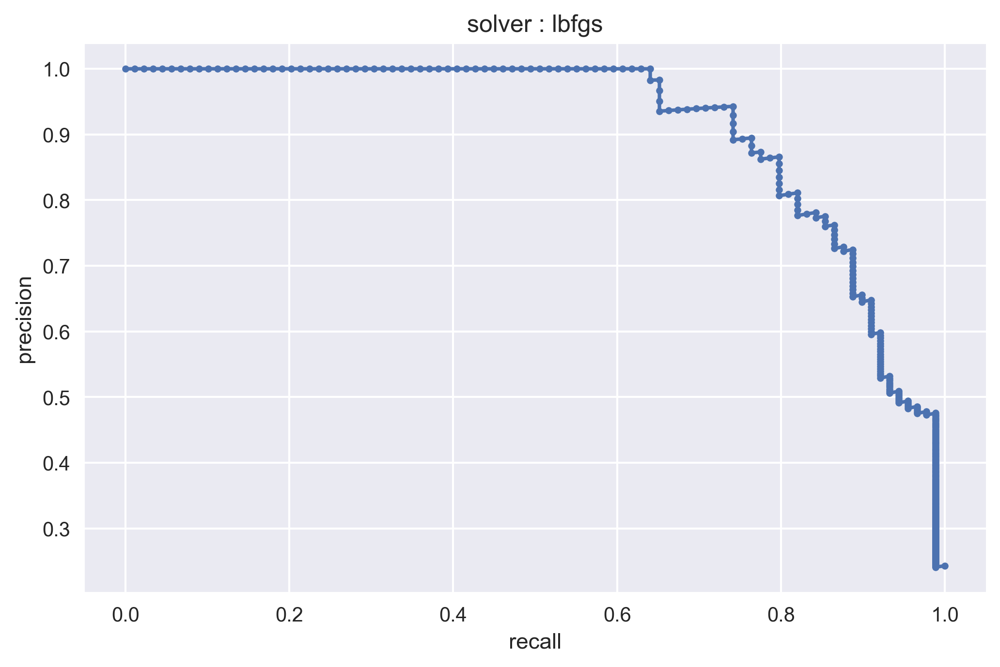

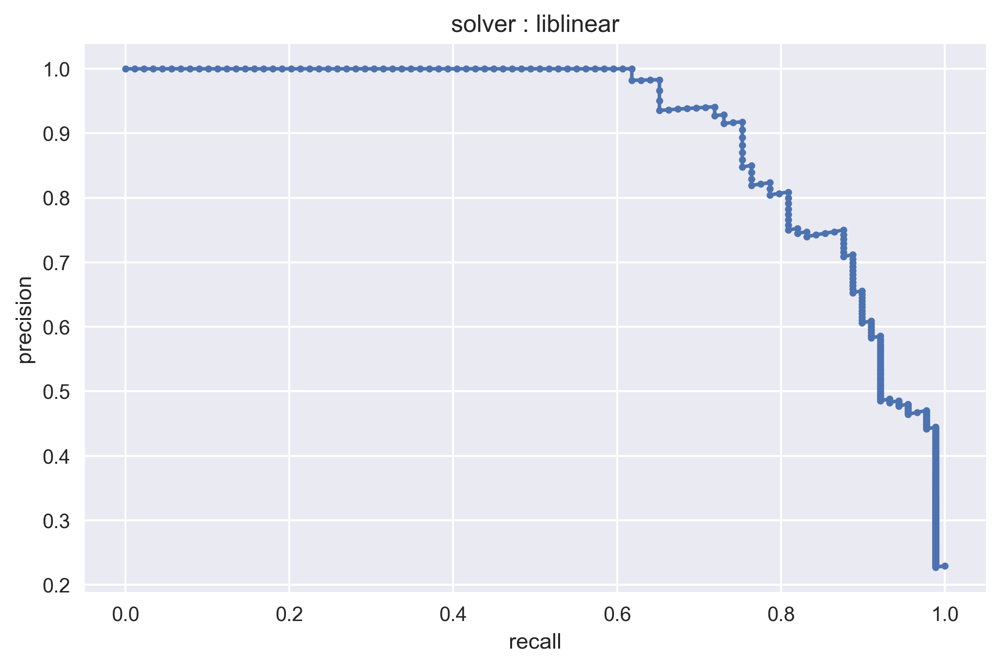

In [158]:
probabilities = (y_proba_lbfgs, y_proba_liblin)
solvers = ('lbfgs', 'liblinear')
for i in range(2):
    precision, recall, thresholds = metrics.precision_recall_curve(y_test, probabilities[i])
    fig = plt.figure(figsize = (8, 5), dpi = 300)
    plt.plot(recall, precision, marker = '.')
    plt.xlabel('recall')
    plt.ylabel('precision')
    plt.title(f'solver : {solvers[i]}')
plt.show()

In [159]:
probabilities = (y_proba_lbfgs, y_proba_liblin)
solvers = ('lbfgs', 'liblinear')
for i in range(2):
    precision, recall, thresholds = metrics.precision_recall_curve(y_test, probabilities[i])
    f1 = (2 * precision * recall) / (precision + recall)
    best_index = np.argmax(f1)
    best_threshold = thresholds[best_index]
    print(f'{solvers[i]} : {best_threshold}', end = '\n')

lbfgs : 0.5392638610152132
liblinear : 0.5885798129642335


In [160]:
y_pred_lbfgs = y_proba_lbfgs >= 0.5392638610152132
y_pred_liblin = y_proba_liblin >= 0.5885798129642335

In [161]:
i, solvers = 0, ['lbfgs', 'liblinaer']
for y_pred in [y_pred_lbfgs, y_pred_liblin]:
    print(solvers[i])
    classification_metrics(y_test, y_pred)
    print('\n')
    i += 1

lbfgs
accuracy :   0.9694736842105263
precision :  0.8658536585365854
recall :     0.797752808988764
f1 :         0.8304093567251462
[[850  11]
 [ 18  71]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.98       861
           1       0.87      0.80      0.83        89

    accuracy                           0.97       950
   macro avg       0.92      0.89      0.91       950
weighted avg       0.97      0.97      0.97       950



liblinaer
accuracy :   0.9705263157894737
precision :  0.9178082191780822
recall :     0.7528089887640449
f1 :         0.8271604938271604
[[855   6]
 [ 22  67]]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       861
           1       0.92      0.75      0.83        89

    accuracy                           0.97       950
   macro avg       0.95      0.87      0.91       950
weighted avg       0.97      0.97      0.97       950





--- After adjusting threshold using precision_recall_curve, "lbfgs" performed better, however regarding class *1* the results are the same.

##### Best performance yet : "lbfgs" with threshold adjustment using precision_recall_curve ---> f1 = 0.830

--- Among all the features, adding higher powers of "Income", "Experience" and "Age" might help the model for improvement. However, as "Experience" and "Age" are highly correlated with each other, and they are also not correlated with target values, this hypothesis will be tested only for "Income".

In [163]:
df_train['Income2'] = df_train['Income'] ** 2

X = df_train.drop(['Target'], axis = 1).values
y = df_train['Target'].values

In [164]:
solvers = ['lbfgs', 'liblinear']
for solver in solvers:
    print(logreg_cv(solver, X, y, 5000))

lbfgs : 
0.814500476559663 
[0.80722892 0.72839506 0.87654321 0.8        0.8603352 ]

liblinear : 
0.814010027010027 
[0.84571429 0.72839506 0.86419753 0.8021978  0.82954545]



--- As it was expected, "Income2" imporved the models.

--- Again model will go through frid search for hyperparameter optimization.

In [166]:
X = df_train.drop(['Target'], axis = 1).values
y = df_train['Target'].values

In [167]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True, 
                                                    random_state = 1)

In [168]:
reg = LogisticRegression(solver = 'lbfgs', max_iter = 5000, n_jobs = -1)
params = {'penalty' : ['l2', 'none'], 'C' : [0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100], 
          'class_weight' : [None, 'balanced'], 'warm_start' : [False, True]}
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
gridsearch = GridSearchCV(reg, param_grid = params, scoring = 'f1', n_jobs = -1, cv = kfold)

In [169]:
gridsearch.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
             estimator=LogisticRegression(max_iter=5000, n_jobs=-1), n_jobs=-1,
             param_grid={'C': [0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100],
                         'class_weight': [None, 'balanced'],
                         'penalty': ['l2', 'none'],
                         'warm_start': [False, True]},
             scoring='f1')

In [170]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'C': 20, 'class_weight': None, 'penalty': 'l2', 'warm_start': False}
0.8104107775058583


--- Best Log reg with "lbfgs" : C = 20

In [171]:
reg = LogisticRegression(solver = 'liblinear', max_iter = 5000)
params = {'penalty' : ['l1', 'l2'], 'C' : [0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100], 
          'class_weight' : [None, 'balanced'], 'dual' : [True, False], 'warm_start' : [False, True]}
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
gridsearch = GridSearchCV(reg, param_grid = params, scoring = 'f1', n_jobs = -1, cv = kfold)

In [172]:
gridsearch.fit(X_train, y_train)

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:918: UserWarning: One or more of the test scores are non-finite: [       nan        nan 0.415788   0.36812872 0.77976438 0.77976438
 0.78631944 0.78631944        nan        nan 0.44461704 0.3110247
 0.66073473 0.66073473 0.65326762 0.65326762        nan        nan
 0.35363833 0.42560018 0.79278763 0.79278763 0.79528982 0.79528982
        nan        nan 0.45355422 0.34018975 0.67435174 0.67435174
 0.64980117 0.64980117        nan        nan 0.4328194  0.35196064
 0.81358734 0.81358734 0.80288176 0.80288176        nan        nan
 0.49932342 0.41930323 0.68396027 0.68396027 0.66180415 0.66180415
        nan        nan 0.42073055 0.42511648 0.81125214 0.81125214
 0.80634217 0.80634217        nan        nan 0.46560878 0.1627473
 0.69004947 0.69004947 0.64813598 0.64813598        nan        nan
 0.4236666  0.37731838 0.81074388 0.81074388 0.7971082  0.7971082
        nan        nan 0.48321166 0.43783068 0.6873032  0

GridSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
             estimator=LogisticRegression(max_iter=5000, solver='liblinear'),
             n_jobs=-1,
             param_grid={'C': [0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100],
                         'class_weight': [None, 'balanced'],
                         'dual': [True, False], 'penalty': ['l1', 'l2'],
                         'warm_start': [False, True]},
             scoring='f1')

In [173]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'C': 0.5, 'class_weight': None, 'dual': False, 'penalty': 'l1', 'warm_start': False}
0.8135873418179764


--- Best Log reg with "liblinear" : penalty = 'l1', C = 0.5

--- I noticed an error in conda log files stating that "liblinear" solver fails to converge. Aiming to tackle this problem "max_iter" value for "liblinear" will be increased.

In [174]:
logreg_lbfgs = LogisticRegression(solver = 'lbfgs', C = 20, max_iter = 5000, n_jobs = -1)
logreg_liblin = LogisticRegression(solver = 'liblinear', penalty = 'l1', C = 0.5, max_iter = 20000)

In [175]:
X = df_train.drop('Target', axis = 1).values
y = df_train['Target'].values

In [176]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True, 
                                                    random_state = 1)

In [177]:
logreg_lbfgs.fit(X_train, y_train.ravel())
logreg_liblin.fit(X_train, y_train.ravel())

LogisticRegression(C=0.5, max_iter=20000, penalty='l1', solver='liblinear')

In [178]:
# Performance on the train set:

y_lbfgs = logreg_lbfgs.predict(X_train)
y_liblin = logreg_liblin.predict(X_train)
i, solvers = 0, ['lbfgs', 'liblinaer']
for y_pred in [y_lbfgs, y_liblin]:
    print(solvers[i])
    classification_metrics(y_train, y_pred)
    print('\n')
    i += 1

lbfgs
accuracy :   0.9655263157894737
precision :  0.8881789137380192
recall :     0.7433155080213903
f1 :         0.8093158660844249
[[3391   35]
 [  96  278]]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      3426
           1       0.89      0.74      0.81       374

    accuracy                           0.97      3800
   macro avg       0.93      0.87      0.90      3800
weighted avg       0.96      0.97      0.96      3800



liblinaer
accuracy :   0.966842105263158
precision :  0.8827160493827161
recall :     0.7647058823529411
f1 :         0.8194842406876792
[[3388   38]
 [  88  286]]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      3426
           1       0.88      0.76      0.82       374

    accuracy                           0.97      3800
   macro avg       0.93      0.88      0.90      3800
weighted avg       0.97      0.97      0.97      3800





--- "liblinear" performance is quite better regarding the train set.

In [179]:
# Performace on the test set:

y_pred_lbfgs = logreg_lbfgs.predict(X_test)
y_pred_liblin = logreg_liblin.predict(X_test)
i, solvers = 0, ['lbfgs', 'liblinaer']
for y_pred in [y_pred_lbfgs, y_pred_liblin]:
    print(solvers[i])
    classification_metrics(y_test, y_pred)
    print('\n')
    i += 1

lbfgs
accuracy :   0.9631578947368421
precision :  0.8375
recall :     0.7528089887640449
f1 :         0.7928994082840237
[[848  13]
 [ 22  67]]
              precision    recall  f1-score   support

           0       0.97      0.98      0.98       861
           1       0.84      0.75      0.79        89

    accuracy                           0.96       950
   macro avg       0.91      0.87      0.89       950
weighted avg       0.96      0.96      0.96       950



liblinaer
accuracy :   0.9726315789473684
precision :  0.8705882352941177
recall :     0.8314606741573034
f1 :         0.8505747126436781
[[850  11]
 [ 15  74]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.98       861
           1       0.87      0.83      0.85        89

    accuracy                           0.97       950
   macro avg       0.93      0.91      0.92       950
weighted avg       0.97      0.97      0.97       950





--- On the test set, "liblinear" performance is much better and the differenece is significant.

In [180]:
y_proba_lbfgs = logreg_lbfgs.predict_proba(X_test)[:, 1]
y_proba_liblin = logreg_liblin.predict_proba(X_test)[:, 1]

In [181]:
print("lbfgs AUC score :    ", round(metrics.roc_auc_score(y_test, y_proba_lbfgs), 5))
print("liblinear AUC score : ", round(metrics.roc_auc_score(y_test, y_proba_liblin), 5))

lbfgs AUC score :     0.97832
liblinear AUC score :  0.98662


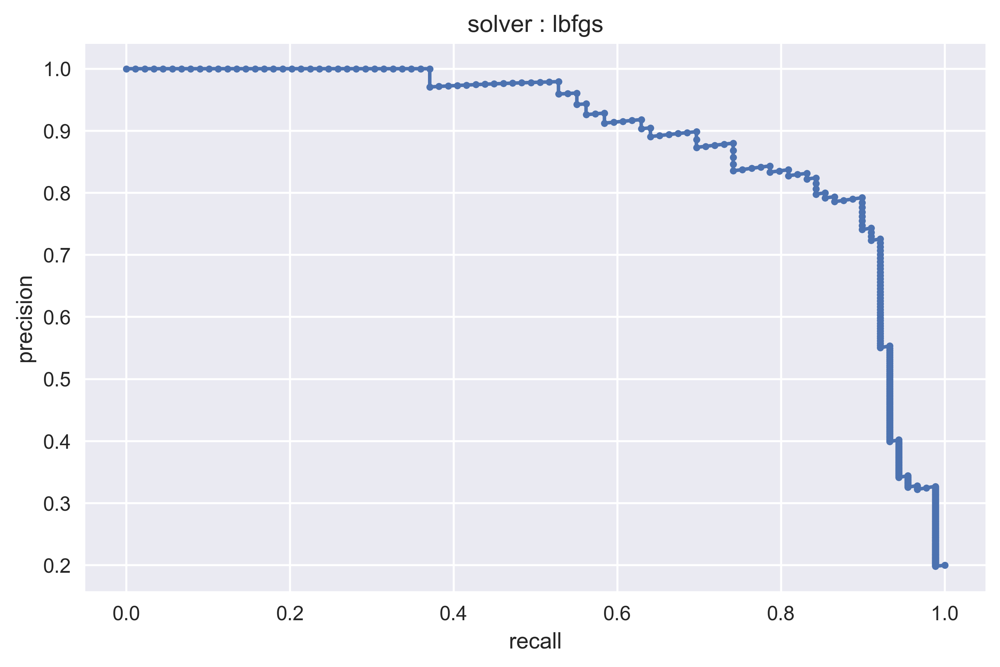

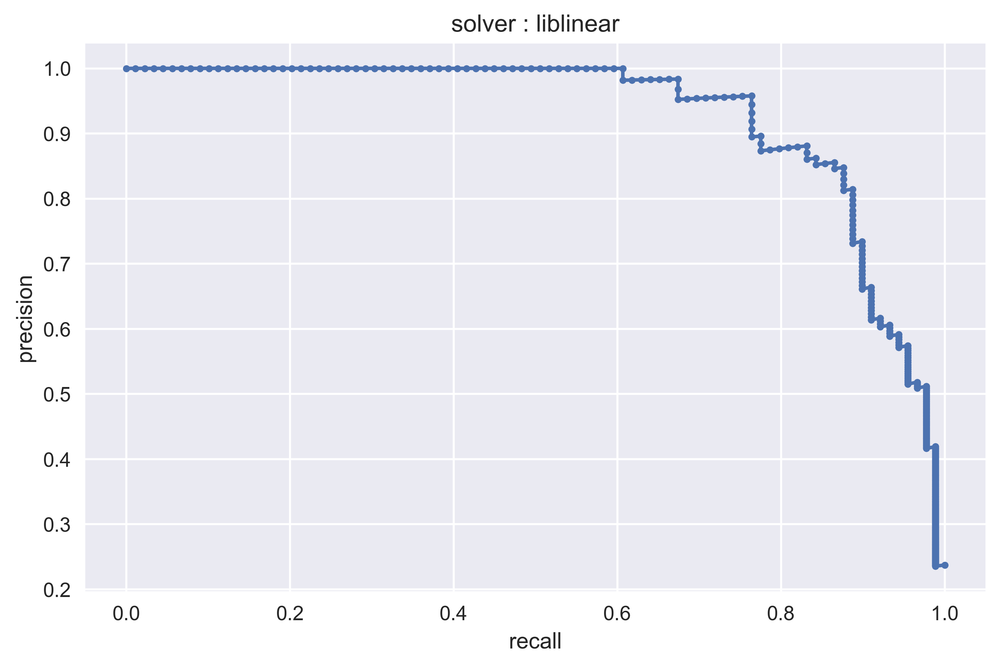

In [182]:
probabilities = (y_proba_lbfgs, y_proba_liblin)
solvers = ('lbfgs', 'liblinear')
for i in range(2):
    precision, recall, thresholds = metrics.precision_recall_curve(y_test, probabilities[i])
    fig = plt.figure(figsize = (8, 5), dpi = 400)
    plt.plot(recall, precision, marker = '.')
    plt.xlabel('recall')
    plt.ylabel('precision')
    plt.title(f'solver : {solvers[i]}')
plt.show()

In [183]:
probabilities = (y_proba_lbfgs, y_proba_liblin)
solvers = ('lbfgs', 'liblinear')
for i in range(2):
    precision, recall, thresholds = metrics.precision_recall_curve(y_test, probabilities[i])
    f1 = (2 * precision * recall) / (precision + recall)
    best_index = np.argmax(f1)
    best_threshold = thresholds[best_index]
    print(f'{solvers[i]} : {best_threshold}', end = '\n')

lbfgs : 0.3140512525529909
liblinear : 0.4390214360296572


In [184]:
y_pred_lbfgs = y_proba_lbfgs >= 0.3140512525529909
y_pred_liblin = y_proba_liblin >= 0.4390214360296572

In [185]:
i, solvers = 0, ['liblinaer', 'lbfgs']
for y_pred in [y_pred_liblin, y_pred_lbfgs]:
    print(solvers[i])
    classification_metrics(y_test, y_pred)
    print('\n')
    i += 1

liblinaer
accuracy :   0.9736842105263158
precision :  0.8478260869565217
recall :     0.8764044943820225
f1 :         0.861878453038674
[[847  14]
 [ 11  78]]
              precision    recall  f1-score   support

           0       0.99      0.98      0.99       861
           1       0.85      0.88      0.86        89

    accuracy                           0.97       950
   macro avg       0.92      0.93      0.92       950
weighted avg       0.97      0.97      0.97       950



lbfgs
accuracy :   0.968421052631579
precision :  0.7920792079207921
recall :     0.898876404494382
f1 :         0.8421052631578948
[[840  21]
 [  9  80]]
              precision    recall  f1-score   support

           0       0.99      0.98      0.98       861
           1       0.79      0.90      0.84        89

    accuracy                           0.97       950
   macro avg       0.89      0.94      0.91       950
weighted avg       0.97      0.97      0.97       950





--- However, the performance of "lbfgs" after threshold adjustment changed much more in comparison to "liblinear", "liblinear" is still the better solver regarding both classes.

--- Aiming to made the model better, only "liblinear" is being examinated and tuned, as it has the better overall performance after threshold optimization.

In [191]:
X = df_train.drop(['Target'], axis = 1)
y = df_train['Target']

In [192]:
print(logreg_cv('liblinear', X, y, 20000))

liblinear : 
0.814010027010027 
[0.84571429 0.72839506 0.86419753 0.8021978  0.82954545]



--- A loop is being run to find features without which, models can perform better.

In [193]:
liblin_score = 0.814010027010027

for col in df_train.columns:
    X = df_train.drop(['Target', col], axis = 1)
    y = df_train['Target']
    liblin_reg = LogisticRegression(solver = 'liblinear', max_iter = 20000)
    kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
    liblin_new = np.mean(cross_val_score(liblin_reg, X, y.ravel(), scoring = 'f1', cv = kfold))
    if liblin_new > liblin_score:
        print(f'liblinear : {col} ---> {liblin_new}')

liblinear : CCAvg ---> 0.8196671089206135
liblinear : City Code_3 ---> 0.8146384479717812
liblinear : City Code_4 ---> 0.8163717041643002


--- Based on the results above, removing some of the "City Code" columns can improve f1 score. But, due to the encoding technique implemented on the "City Code", all columns show a unique value in the "City Code" column and they cannot be removed separately.

--- Apart from "City Code", by removing "CCAvg", "liblinear" showed a better performance.

--- Before removing, correlations are being checked again to see if these results are caused by multicollinearity.

In [194]:
df_new = df_train.drop(['City Code_0', 'City Code_1', 'City Code_2', 'City Code_3', 'City Code_4', 'City Code_5'], axis = 1)

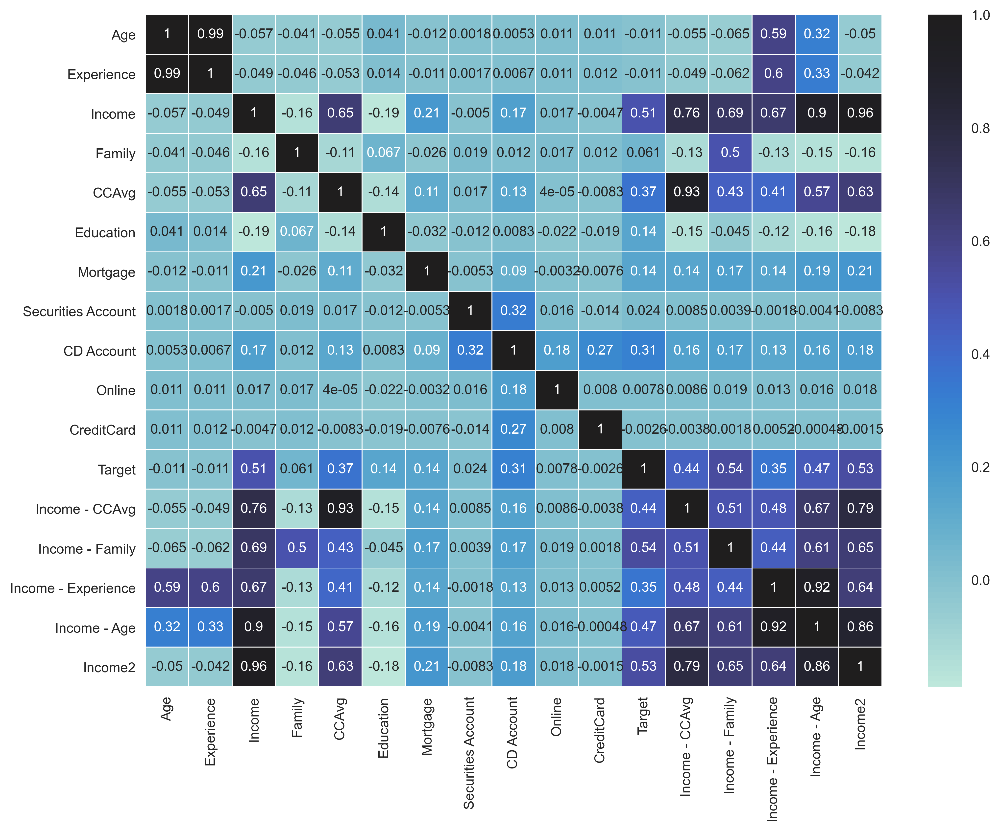

In [195]:
fig, ax = plt.subplots(figsize = (12, 9), dpi = 400)
sns.heatmap(df_new.corr(), center = 1, cbar = True, annot = True, linewidths = 0.5, ax = ax)
plt.show()

--- Based on the correlation heat map, synthtic features are highly correalted with the target.

--- "CCAvg" is highly correlated with "Income - CCAvg" which is reasonable, but it might be multicollinearity.

In [196]:
X = df_train.drop(['Target', 'CCAvg'], axis = 1)
y = df_train['Target']

In [198]:
print(logreg_cv('liblinear', X, y, 20000))

liblinear : 
0.8196671089206135 
[0.85882353 0.74846626 0.8427673  0.80434783 0.84393064]



In [199]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True, 
                                                    random_state = 1)

In [200]:
reg = LogisticRegression(solver = 'liblinear', max_iter = 20000)
params = {'penalty' : ['l1', 'l2'], 'C' : [0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100], 
          'class_weight' : [None, 'balanced'], 'dual' : [True, False], 'warm_start' : [False, True]}
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
gridsearch = GridSearchCV(reg, param_grid = params, scoring = 'f1', n_jobs = -1, cv = kfold)

In [201]:
gridsearch.fit(X_train, y_train)

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:918: UserWarning: One or more of the test scores are non-finite: [       nan        nan 0.49894453 0.34811693 0.76640325 0.76640325
 0.78209161 0.78209161        nan        nan 0.49448779 0.51677431
 0.67490797 0.67490797 0.65604578 0.65604578        nan        nan
 0.38319478 0.38876235 0.78523777 0.78523777 0.77539417 0.77539417
        nan        nan 0.51170023 0.46775498 0.68198381 0.68198381
 0.65912033 0.65912033        nan        nan 0.34907285 0.4517797
 0.7958237  0.7958237  0.77892375 0.77892375        nan        nan
 0.45309275 0.48209146 0.68008714 0.67935541 0.65868516 0.65868516
        nan        nan 0.36430676 0.53871033 0.79878767 0.79878767
 0.78882121 0.78882121        nan        nan 0.3756009  0.47529623
 0.68212342 0.68279381 0.66267464 0.66267464        nan        nan
 0.46481415 0.40859065 0.79907576 0.79907576 0.77485766 0.77485766
        nan        nan 0.51186541 0.42556447 0.68003717

GridSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
             estimator=LogisticRegression(max_iter=20000, solver='liblinear'),
             n_jobs=-1,
             param_grid={'C': [0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100],
                         'class_weight': [None, 'balanced'],
                         'dual': [True, False], 'penalty': ['l1', 'l2'],
                         'warm_start': [False, True]},
             scoring='f1')

In [202]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'C': 2, 'class_weight': None, 'dual': False, 'penalty': 'l1', 'warm_start': False}
0.7990757598234234


--- Best Log reg with "liblinear" : penalty = 'l1', C = 2

In [203]:
logreg_liblin = LogisticRegression(solver = 'liblinear', penalty = 'l1', C = 2, max_iter = 50000)

In [204]:
X = df_train.drop(['Target', 'CCAvg'], axis = 1)
y = df_train['Target']

In [205]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True, 
                                                    random_state = 1)

In [206]:
logreg_liblin.fit(X_train, y_train.ravel())

LogisticRegression(C=2, max_iter=50000, penalty='l1', solver='liblinear')

In [207]:
# Performance on the train set:

y_liblin = logreg_liblin.predict(X_train)
i, solvers = 0, ['liblinaer']
for y_pred in [y_liblin]:
    print(solvers[i])
    classification_metrics(y_train, y_pred)
    print('\n')
    i += 1

liblinaer
accuracy :   0.9657894736842105
precision :  0.8836477987421384
recall :     0.7513368983957219
f1 :         0.8121387283236994
[[3389   37]
 [  93  281]]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      3426
           1       0.88      0.75      0.81       374

    accuracy                           0.97      3800
   macro avg       0.93      0.87      0.90      3800
weighted avg       0.96      0.97      0.96      3800





In [208]:
# Performace on the test set:

y_pred_liblin = logreg_liblin.predict(X_test)
i, solvers = 0, ['liblinaer']
for y_pred in [y_pred_liblin]:
    print(solvers[i])
    classification_metrics(y_test, y_pred)
    print('\n')
    i += 1

liblinaer
accuracy :   0.9747368421052631
precision :  0.9012345679012346
recall :     0.8202247191011236
f1 :         0.8588235294117647
[[853   8]
 [ 16  73]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       861
           1       0.90      0.82      0.86        89

    accuracy                           0.97       950
   macro avg       0.94      0.91      0.92       950
weighted avg       0.97      0.97      0.97       950





In [209]:
y_proba_liblin = logreg_liblin.predict_proba(X_test)[:, 1]
print("liblinear AUC score : ", round(metrics.roc_auc_score(y_test, y_proba_liblin), 5))

liblinear AUC score :  0.98525


In [210]:
precision, recall, thresholds = metrics.precision_recall_curve(y_test, y_proba_liblin)
f1 = (2 * precision * recall) / (precision + recall)
best_index = np.argmax(f1)
best_threshold = thresholds[best_index]
print(best_threshold)

0.553590643618796


In [211]:
y_pred_liblin = y_proba_liblin >= 0.553590643618796

In [212]:
classification_metrics(y_test, y_pred_liblin)

accuracy :   0.9768421052631578
precision :  0.935064935064935
recall :     0.8089887640449438
f1 :         0.8674698795180723
[[856   5]
 [ 17  72]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       861
           1       0.94      0.81      0.87        89

    accuracy                           0.98       950
   macro avg       0.96      0.90      0.93       950
weighted avg       0.98      0.98      0.98       950



--- Comparing the results of models with adjusted threshold and non_adjusted ones, it seems in the absence of "CCAvg" as a predictor, adjusting threshold worsens the models.

--- Up to now 2 Logistic regression models showed better performance regarding that recall is preferred to precision. Both models have "liblinear" as their solver, one of which bulit upon data with "CCAvg" and the other without it. Full details of these models can be seen below :

##### reg_1 : "liblinear" with "CCAvg"    ---> penalty = 'l1', C = 0.5 / adjusted threshold
##### reg_2 : "liblinear" without "CCAvg" ---> penalty = 'l1', C = 2 / without adjusted threshold

In [213]:
reg_1 = LogisticRegression(solver = 'liblinear', penalty = 'l1', C = 0.5, max_iter = 50000)
reg_2 = LogisticRegression(solver = 'liblinear', penalty = 'l1', C = 2.0, max_iter = 50000)

In [214]:
X_1 = df_train.drop(['Target'], axis = 1)
y_1 = df_train['Target']
X_1_train, X_1_test, y_1_train, y_1_test = train_test_split(X_1, y_1, test_size = 0.2, shuffle = True, 
                                                    random_state = 1)
reg_1.fit(X_1_train, y_1_train)

LogisticRegression(C=0.5, max_iter=50000, penalty='l1', solver='liblinear')

In [215]:
X_2 = df_train.drop(['Target', 'CCAvg'], axis = 1)
y_2 = df_train['Target']
X_2_train, X_2_test, y_2_train, y_2_test = train_test_split(X_2, y_2, test_size = 0.2, shuffle = True, 
                                                    random_state = 1)
reg_2.fit(X_2_train, y_2_train)

LogisticRegression(C=2.0, max_iter=50000, penalty='l1', solver='liblinear')

In [216]:
y_proba_1 = reg_1.predict_proba(X_1_test)[:, 1]
precision, recall, thresholds = metrics.precision_recall_curve(y_1_test, y_proba_1)
f1 = (2 * precision * recall) / (precision + recall)
best_index = np.argmax(f1)
best_threshold = thresholds[best_index]
print(best_threshold)

0.4390055917240765


--- reg_1 threshold = 0.4390055917240765

In [217]:
# Comparing models on the test set

y_pred_1 = reg_1.predict_proba(X_1_test)[:, 1] >= 0.4390055917240765
y_pred_2 = reg_2.predict(X_2_test)
print("   With CCAvg and Adjusted Threshold\n\n")
classification_metrics(y_1_test, y_pred_1)
print("\n   Without CCAvg and Default Threshold\n")
classification_metrics(y_2_test, y_pred_2)

   With CCAvg and Adjusted Threshold


accuracy :   0.9736842105263158
precision :  0.8478260869565217
recall :     0.8764044943820225
f1 :         0.861878453038674
[[847  14]
 [ 11  78]]
              precision    recall  f1-score   support

           0       0.99      0.98      0.99       861
           1       0.85      0.88      0.86        89

    accuracy                           0.97       950
   macro avg       0.92      0.93      0.92       950
weighted avg       0.97      0.97      0.97       950


   Without CCAvg and Default Threshold

accuracy :   0.9747368421052631
precision :  0.9012345679012346
recall :     0.8202247191011236
f1 :         0.8588235294117647
[[853   8]
 [ 16  73]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       861
           1       0.90      0.82      0.86        89

    accuracy                           0.97       950
   macro avg       0.94      0.91      0.92       950
weighted avg       0

In [219]:
# Comparing models on both train and test set

y_pred_1 = reg_1.predict_proba(X_1)[:, 1] >= 0.4390055917240765
y_pred_2 = reg_2.predict(X_2)
print("   With CCAvg and Adjusted Threshold\n\n")
classification_metrics(y_1, y_pred_1)
print("\n   Without CCAvg and Default Threshold\n")
classification_metrics(y_2, y_pred_2)

   With CCAvg and Adjusted Threshold


accuracy :   0.9690526315789474
precision :  0.8640552995391705
recall :     0.8099352051835853
f1 :         0.8361204013377926
[[4228   59]
 [  88  375]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      4287
           1       0.86      0.81      0.84       463

    accuracy                           0.97      4750
   macro avg       0.92      0.90      0.91      4750
weighted avg       0.97      0.97      0.97      4750


   Without CCAvg and Default Threshold

accuracy :   0.9675789473684211
precision :  0.8872180451127819
recall :     0.7645788336933045
f1 :         0.8213457076566125
[[4242   45]
 [ 109  354]]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      4287
           1       0.89      0.76      0.82       463

    accuracy                           0.97      4750
   macro avg       0.93      0.88      0.90      4750
weighted av

--- Based on the results above, I choose the model fitted on the data containing "CCAvg".

##### Best Logistic Regression model : 
--- 'liblinear' with parameters tuned using GridSearchCV and adjusted threshold using precision_recall_curve (penalty = 'l1', C = 0.5)

--- Data include all columns plus "Income - CCAvg", "Income - Family", "Income - Experience", "Income - Age", and "income2"

### K-Nearest Neighbors Classifier

In [220]:
df_train.columns

Index(['Age', 'Experience', 'Income', 'Family', 'CCAvg', 'Education',
       'Mortgage', 'Securities Account', 'CD Account', 'Online', 'CreditCard',
       'City Code_0', 'City Code_1', 'City Code_2', 'City Code_3',
       'City Code_4', 'City Code_5', 'Target', 'Income - CCAvg',
       'Income - Family', 'Income - Experience', 'Income - Age', 'Income2'],
      dtype='object')

In [221]:
# Removing synthetic features from the original dataset to fit and tune another algorithm on the data.

df_train_2 = df_train.drop(['Income - CCAvg', 'Income - Family', 'Income - Experience', 'Income - Age', 'Income2'],
              axis = 1)
df_train_2.columns, df_train_2.shape

(Index(['Age', 'Experience', 'Income', 'Family', 'CCAvg', 'Education',
        'Mortgage', 'Securities Account', 'CD Account', 'Online', 'CreditCard',
        'City Code_0', 'City Code_1', 'City Code_2', 'City Code_3',
        'City Code_4', 'City Code_5', 'Target'],
       dtype='object'),
 (4750, 18))

In [222]:
X = df_train_2.drop(['Target'], axis = 1)
y = df_train_2['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True, 
                                                    random_state = 1)

In [223]:
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [224]:
# Performance on the train set:

classification_metrics(y_train, knn.predict(X_train))

accuracy :   0.9347368421052632
precision :  0.75
recall :     0.5053475935828877
f1 :         0.6038338658146964
[[3363   63]
 [ 185  189]]
              precision    recall  f1-score   support

           0       0.95      0.98      0.96      3426
           1       0.75      0.51      0.60       374

    accuracy                           0.93      3800
   macro avg       0.85      0.74      0.78      3800
weighted avg       0.93      0.93      0.93      3800



In [225]:
# Performance on the test set:

classification_metrics(y_test, knn.predict(X_test))

accuracy :   0.9157894736842105
precision :  0.5737704918032787
recall :     0.39325842696629215
f1 :         0.4666666666666667
[[835  26]
 [ 54  35]]
              precision    recall  f1-score   support

           0       0.94      0.97      0.95       861
           1       0.57      0.39      0.47        89

    accuracy                           0.92       950
   macro avg       0.76      0.68      0.71       950
weighted avg       0.91      0.92      0.91       950



In [226]:
# KNN classifier with default values showed a performance that cannot be compared to the one of 
# Logistic Regression. Hyperparameters are being tuned for performance improvement.

In [227]:
knn = KNeighborsClassifier(n_jobs = -1)
params = {'n_neighbors' : list(range(2, 50)),'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree'], 'leaf_size' : [10, 20, 30, 40, 50, 60, 70],
          'p' : [1, 2]}
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
gridsearch = GridSearchCV(knn, param_grid = params, scoring = 'f1', n_jobs = -1, cv = kfold)

In [228]:
gridsearch.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
             estimator=KNeighborsClassifier(n_jobs=-1), n_jobs=-1,
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree'],
                         'leaf_size': [10, 20, 30, 40, 50, 60, 70],
                         'n_neighbors': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,
                                         14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
                                         24, 25, 26, 27, 28, 29, 30, 31, ...],
                         'p': [1, 2], 'weights': ['uniform', 'distance']},
             scoring='f1')

In [229]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'algorithm': 'ball_tree', 'leaf_size': 30, 'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
0.5199167679611536


In [230]:
knn = KNeighborsClassifier(algorithm = 'ball_tree', leaf_size = 30, n_neighbors = 3, p = 1, weights = 'distance',
                           n_jobs = -1)

knn.fit(X_train, y_train)

KNeighborsClassifier(algorithm='ball_tree', n_jobs=-1, n_neighbors=3, p=1,
                     weights='distance')

In [231]:
# Performance on the train set:

classification_metrics(y_train, knn.predict(X_train))

accuracy :   1.0
precision :  1.0
recall :     1.0
f1 :         1.0
[[3426    0]
 [   0  374]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3426
           1       1.00      1.00      1.00       374

    accuracy                           1.00      3800
   macro avg       1.00      1.00      1.00      3800
weighted avg       1.00      1.00      1.00      3800



--- Overfitting!!!

In [232]:
# Performance on the test set:

classification_metrics(y_test, knn.predict(X_test))

accuracy :   0.9357894736842105
precision :  0.75
recall :     0.47191011235955055
f1 :         0.5793103448275861
[[847  14]
 [ 47  42]]
              precision    recall  f1-score   support

           0       0.95      0.98      0.97       861
           1       0.75      0.47      0.58        89

    accuracy                           0.94       950
   macro avg       0.85      0.73      0.77       950
weighted avg       0.93      0.94      0.93       950



--- As it can be seen, tuning hyperparameters may imporve the model drastically, but the reason behind the overfit problem with train set is not clear for me !

##### After some trial and error, I realized that the problem caused by the parameter "wights", so it will not be changed and the tuning process is being repeated again.

In [233]:
knn = KNeighborsClassifier(n_jobs = -1)
params = {'n_neighbors' : list(range(2, 50)),  'algorithm' : ['auto', 'ball_tree', 'kd_tree'],
          'leaf_size' : [10, 20, 30, 40, 50, 60, 70], 'p' : [1, 2]}
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
gridsearch = GridSearchCV(knn, param_grid = params, scoring = 'f1', n_jobs = -1, cv = kfold)

In [234]:
gridsearch.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
             estimator=KNeighborsClassifier(n_jobs=-1), n_jobs=-1,
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree'],
                         'leaf_size': [10, 20, 30, 40, 50, 60, 70],
                         'n_neighbors': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,
                                         14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
                                         24, 25, 26, 27, 28, 29, 30, 31, ...],
                         'p': [1, 2]},
             scoring='f1')

In [235]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'algorithm': 'ball_tree', 'leaf_size': 30, 'n_neighbors': 3, 'p': 1}
0.5055059691333822


In [236]:
scaler = MinMaxScaler()
knn = KNeighborsClassifier(algorithm = 'ball_tree', leaf_size = 30, n_neighbors = 3, p = 1, n_jobs = -1)
pipeline = Pipeline(steps = [('s', scaler), ('m', knn)])
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
print(np.mean(cross_val_score(pipeline, X, y, scoring = 'f1', cv = kfold)))
print(cross_val_score(pipeline, X, y, scoring = 'f1', cv = kfold))

0.409510118145444
[0.36206897 0.38709677 0.43333333 0.39097744 0.47407407]


In [237]:
knn = KNeighborsClassifier(algorithm = 'ball_tree', leaf_size = 30, n_neighbors = 3, p = 1, n_jobs = -1)
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
print(np.mean(cross_val_score(knn, X, y, scoring = 'f1', cv = kfold)))
print(cross_val_score(knn, X, y, scoring = 'f1', cv = kfold))

0.5291628040486487
[0.57342657 0.49350649 0.53424658 0.53846154 0.50617284]


--- KNN model performs better without normalizing features.

In [238]:
knn = KNeighborsClassifier(algorithm = 'ball_tree', leaf_size = 30, n_neighbors = 3, p = 1, n_jobs = -1)

In [239]:
knn.fit(X_train, y_train)

KNeighborsClassifier(algorithm='ball_tree', n_jobs=-1, n_neighbors=3, p=1)

In [240]:
# Performance on the train set:

classification_metrics(y_train, knn.predict(X_train))

accuracy :   0.9568421052631579
precision :  0.8804347826086957
recall :     0.6497326203208557
f1 :         0.7476923076923077
[[3393   33]
 [ 131  243]]
              precision    recall  f1-score   support

           0       0.96      0.99      0.98      3426
           1       0.88      0.65      0.75       374

    accuracy                           0.96      3800
   macro avg       0.92      0.82      0.86      3800
weighted avg       0.95      0.96      0.95      3800



In [241]:
# Performance on the test set:

classification_metrics(y_test, knn.predict(X_test))

accuracy :   0.9357894736842105
precision :  0.7592592592592593
recall :     0.4606741573033708
f1 :         0.5734265734265734
[[848  13]
 [ 48  41]]
              precision    recall  f1-score   support

           0       0.95      0.98      0.97       861
           1       0.76      0.46      0.57        89

    accuracy                           0.94       950
   macro avg       0.85      0.72      0.77       950
weighted avg       0.93      0.94      0.93       950



--- Performance of the model on the test set did not change at all !

In [242]:
knn = KNeighborsClassifier(algorithm = 'brute', n_neighbors = 3, p = 1, n_jobs = -1)
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
print(np.mean(cross_val_score(knn, X, y, scoring = 'f1', cv = kfold)))
print(cross_val_score(knn, X, y, scoring = 'f1', cv = kfold))

0.5299577023863268
[0.57342657 0.49032258 0.53793103 0.54193548 0.50617284]


--- Regarding the results above, "brute" algorithm is better for this dataset, even though GridSearchCV retuned "ball_tree" as the best. Considering that the dataset is relatively small, and the computational cost and time is not much, and the fact that "brute" algorithm calculates distances for all samples, "brute" is the chosen algorithm. 

In [243]:
knn = KNeighborsClassifier(algorithm = 'brute', n_neighbors = 3, p = 1, n_jobs = -1)
knn.fit(X_train, y_train)

KNeighborsClassifier(algorithm='brute', n_jobs=-1, n_neighbors=3, p=1)

In [244]:
# Performance on the train set:

classification_metrics(y_train, knn.predict(X_train))

accuracy :   0.9571052631578948
precision :  0.8864468864468864
recall :     0.6470588235294118
f1 :         0.7480680061823802
[[3395   31]
 [ 132  242]]
              precision    recall  f1-score   support

           0       0.96      0.99      0.98      3426
           1       0.89      0.65      0.75       374

    accuracy                           0.96      3800
   macro avg       0.92      0.82      0.86      3800
weighted avg       0.96      0.96      0.95      3800



In [245]:
# Performance on the test set:

classification_metrics(y_test, knn.predict(X_test))

accuracy :   0.9357894736842105
precision :  0.7592592592592593
recall :     0.4606741573033708
f1 :         0.5734265734265734
[[848  13]
 [ 48  41]]
              precision    recall  f1-score   support

           0       0.95      0.98      0.97       861
           1       0.76      0.46      0.57        89

    accuracy                           0.94       950
   macro avg       0.85      0.72      0.77       950
weighted avg       0.93      0.94      0.93       950



--- Even using "brute" algorithm did not affect the evaluation on the test set, it just had an impact on the train set but even that change is not considerable !!!

In [246]:
X = df_train_2.drop(['Target'], axis = 1)
y = df_train_2['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True,
                                                    random_state = 1)

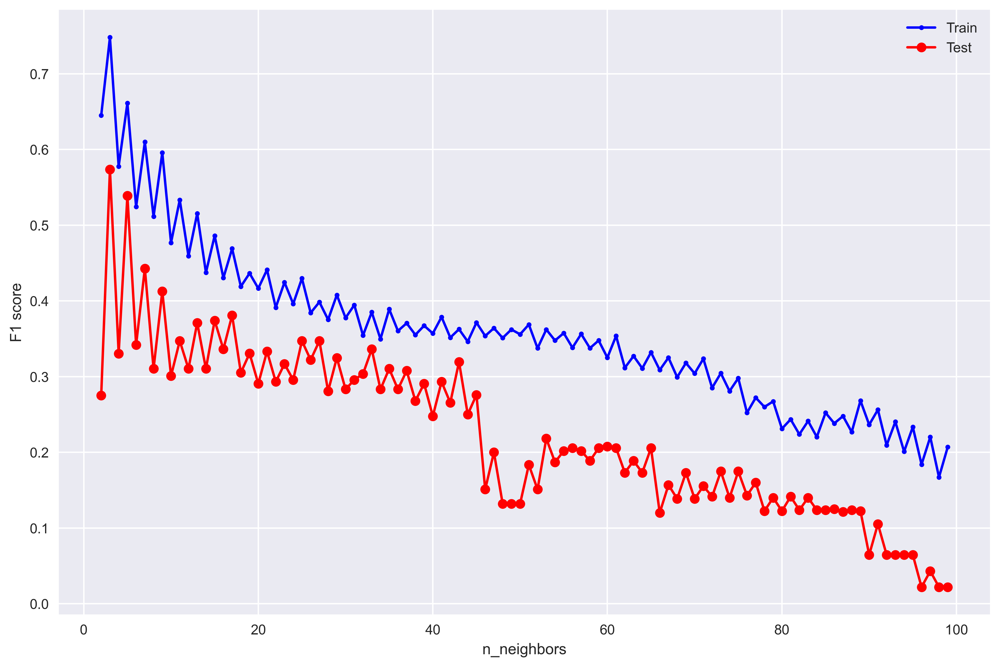

In [247]:
neighbors = list(range(2, 100))
train_scores, test_scores = [], []
for n_neighbors in neighbors :
    knn = KNeighborsClassifier(algorithm = 'brute', n_neighbors = n_neighbors, p = 1, n_jobs = -1)
    knn.fit(X_train, y_train)
    train_scores.append(metrics.f1_score(y_train, knn.predict(X_train)))
    test_scores.append(metrics.f1_score(y_test, knn.predict(X_test)))
    
plt.figure(figsize = (12, 8), dpi = 400)
plt.plot(list(range(2, 100)), train_scores, marker = '.', color = 'blue', label = 'Train')
plt.plot(list(range(2, 100)), test_scores, marker = 'o', color = 'red', label = 'Test')
plt.xlabel('n_neighbors')
plt.ylabel('F1 score')
plt.legend()
plt.show()

--- It seems that the problem is not the tuning, but the data !

--- Aiming to improve the model, from the categorical features, those ones with low correlation will be put aside, and from the the non-categorical ones, those which provide low separablity of the target classes will be eliminated from the dataset temporarily.

In [249]:
df_train.columns

Index(['Age', 'Experience', 'Income', 'Family', 'CCAvg', 'Education',
       'Mortgage', 'Securities Account', 'CD Account', 'Online', 'CreditCard',
       'City Code_0', 'City Code_1', 'City Code_2', 'City Code_3',
       'City Code_4', 'City Code_5', 'Target', 'Income - CCAvg',
       'Income - Family', 'Income - Experience', 'Income - Age', 'Income2'],
      dtype='object')

In [250]:
X = df_train[['Income', 'Family', 'CCAvg', 'Securities Account', 'CD Account']]
y = df_train['Target']

In [251]:
knn = KNeighborsClassifier(n_jobs = -1)
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
print(np.mean(cross_val_score(knn, X, y, scoring = 'f1', cv = kfold)))
print(cross_val_score(knn, X, y, scoring = 'f1', cv = kfold))

0.5879928925736906
[0.55629139 0.57324841 0.67096774 0.56050955 0.57894737]


--- May feature engineering and feature selection be the best way of KNN performance improvement !

In [252]:
df_train.columns

Index(['Age', 'Experience', 'Income', 'Family', 'CCAvg', 'Education',
       'Mortgage', 'Securities Account', 'CD Account', 'Online', 'CreditCard',
       'City Code_0', 'City Code_1', 'City Code_2', 'City Code_3',
       'City Code_4', 'City Code_5', 'Target', 'Income - CCAvg',
       'Income - Family', 'Income - Experience', 'Income - Age', 'Income2'],
      dtype='object')

In [253]:
X = df_train[['Income', 'Family', 'CCAvg', 'Education', 'Securities Account', 'CD Account']]
y = df_train['Target']

In [254]:
knn = KNeighborsClassifier(n_jobs = -1)
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
print(np.mean(cross_val_score(knn, X, y, scoring = 'f1', cv = kfold)))
print(cross_val_score(knn, X, y, scoring = 'f1', cv = kfold))

0.6895457450086464
[0.625      0.64335664 0.82580645 0.62745098 0.72611465]


--- Adding "Education" improved the results drastically!

--- Aiming time efficiency, a loop is being run to find other features that can improve the model.

In [255]:
remaining_features = ['Age', 'Experience', 'Mortgage', 'Online', 'CreditCard',
                      'City Code_0', 'City Code_1', 'City Code_2', 'City Code_3',
                      'City Code_4', 'City Code_5', 'Target', 'Income - CCAvg',
                      'Income - Family', 'Income - Experience', 'Income - Age', 'Income2']

In [256]:
X = df_train[['Income', 'Family', 'CCAvg', 'Education', 'Securities Account', 'CD Account']]
y = df_train['Target']
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
max_score = 0.6895457450086464

for feature in remaining_features:
    X_new = X.copy()
    X_new.insert(0, feature, df_train[feature])
    score = np.mean(cross_val_score(knn, X, y, scoring = 'f1', cv = kfold))
    if score > max_score:
        print(f'{feature} : {score}')
print('-')

-


--- None of the remaining features improved the model !

In [257]:
X = df_train[['Income', 'Family', 'CCAvg', 'Education', 'Securities Account', 'CD Account']]
y = df_train['Target']
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
max_score = 0.6895457450086464

for feature in X.columns:
    X_new = X.drop(feature, axis = 1)
    score = np.mean(cross_val_score(knn, X, y, scoring = 'f1', cv = kfold))
    if score > max_score:
        print(f'{feature} : {score}')
print('-')

-


--- Removing each of the features above worsens the model !

In [258]:
X = df_train[['Income', 'Family', 'CCAvg', 'Education', 'Securities Account', 'CD Account']]
y = df_train['Target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True, 
                                                    random_state = 1)

In [259]:
knn = KNeighborsClassifier(n_jobs = -1)
params = {'n_neighbors' : list(range(2, 50)),  'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute'],
          'leaf_size' : [10, 20, 30, 40, 50, 60, 70], 'p' : [1, 2]}
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
gridsearch = GridSearchCV(knn, param_grid = params, scoring = 'f1', n_jobs = -1, cv = kfold)

In [260]:
gridsearch.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
             estimator=KNeighborsClassifier(n_jobs=-1), n_jobs=-1,
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'leaf_size': [10, 20, 30, 40, 50, 60, 70],
                         'n_neighbors': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,
                                         14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
                                         24, 25, 26, 27, 28, 29, 30, 31, ...],
                         'p': [1, 2]},
             scoring='f1')

In [261]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'algorithm': 'auto', 'leaf_size': 10, 'n_neighbors': 3, 'p': 1}
0.7316170407439069


In [262]:
knn = KNeighborsClassifier(algorithm = 'auto', leaf_size = 10, n_neighbors = 3, p = 1, n_jobs = -1)
knn.fit(X_train, y_train)

KNeighborsClassifier(leaf_size=10, n_jobs=-1, n_neighbors=3, p=1)

In [263]:
# Performance on the train set:

classification_metrics(y_train, knn.predict(X_train))

accuracy :   0.9789473684210527
precision :  0.9651898734177216
recall :     0.8155080213903744
f1 :         0.8840579710144928
[[3415   11]
 [  69  305]]
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      3426
           1       0.97      0.82      0.88       374

    accuracy                           0.98      3800
   macro avg       0.97      0.91      0.94      3800
weighted avg       0.98      0.98      0.98      3800



In [264]:
# Performance on the test set:

classification_metrics(y_test, knn.predict(X_test))

accuracy :   0.9505263157894737
precision :  0.8387096774193549
recall :     0.5842696629213483
f1 :         0.6887417218543046
[[851  10]
 [ 37  52]]
              precision    recall  f1-score   support

           0       0.96      0.99      0.97       861
           1       0.84      0.58      0.69        89

    accuracy                           0.95       950
   macro avg       0.90      0.79      0.83       950
weighted avg       0.95      0.95      0.95       950



--- By removing some of the main features and tuning the hyperparameters, model performed better, but the performance evaluated on the test set is still not satisfying. Also, it is no way near the performance of best Logistic Regression model !

In [265]:
y_proba = knn.predict_proba(X_test)[:,1]
round(metrics.roc_auc_score(y_test, y_proba), 5)

0.91318

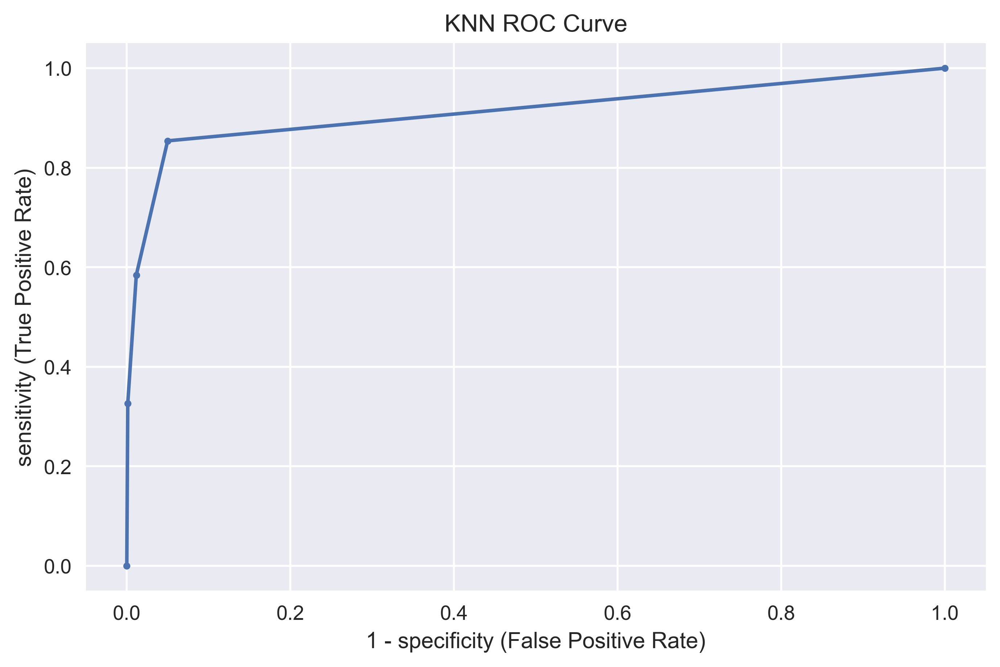

In [266]:
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_proba)
fig = plt.figure(figsize = (8, 5), dpi = 400)
plt.plot(fpr, tpr, marker = '.')
plt.xlabel('1 - specificity (False Positive Rate)')
plt.ylabel('sensitivity (True Positive Rate)')
plt.title('KNN ROC Curve')
plt.show()

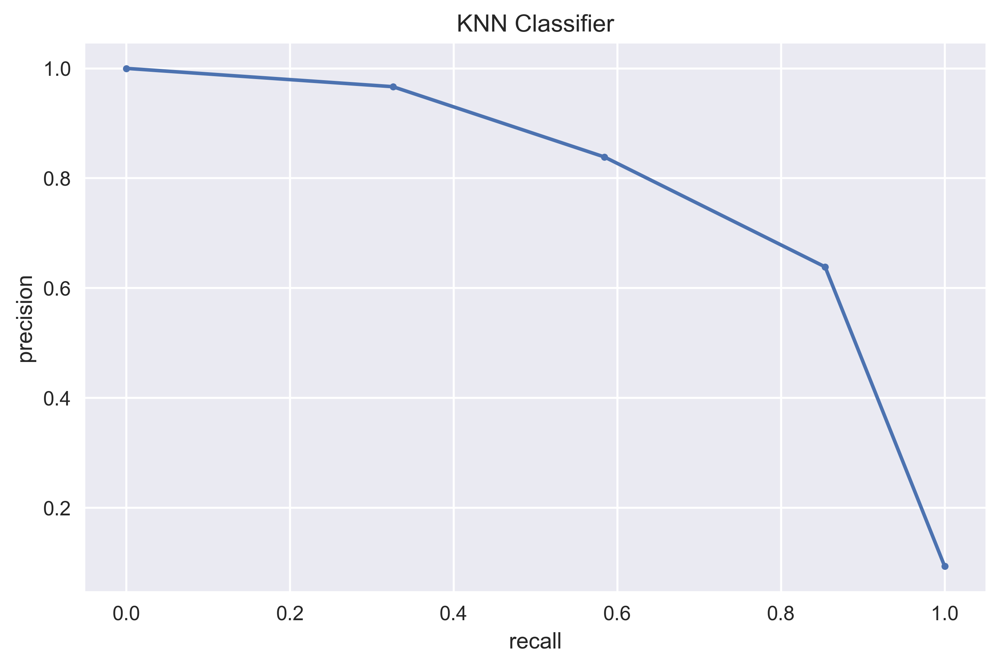

In [267]:
precision, recall, thresholds = metrics.precision_recall_curve(y_test, y_proba)
fig = plt.figure(figsize = (8, 5), dpi = 400)
plt.plot(recall, precision, marker = '.')
plt.xlabel('recall')
plt.ylabel('precision')
plt.title(f'KNN Classifier')
plt.show()

--- Based on the chars above, by increasing recall, preciosion decreased. So, a good f1 score might not be reachable using threshold adjustment techniques. However, these techniques are being implemented to make sure of this hypothesis.

In [268]:
fpr, tpr, thresholds = metrics.roc_curve(y_test, knn.predict_proba(X_test)[:,1])
j = tpr - fpr
best_index = np.argmax(j)
best_threshold = thresholds[best_index]
print(best_threshold)

0.3333333333333333


In [272]:
precision, recall, thresholds = metrics.precision_recall_curve(y_test, knn.predict_proba(X_test)[:,1])
f1 = (2 * precision * recall) / (precision + recall)
best_index = np.argmax(f1)
best_threshold = thresholds[best_index]
print(best_threshold)

0.3333333333333333


--- The best threshold is the same using both methods. 

In [269]:
y_pred = y_proba >= 0.3333333333333333

In [270]:
# Performance on the test set:

classification_metrics(y_test, y_pred)

accuracy :   0.9410526315789474
precision :  0.6386554621848739
recall :     0.8539325842696629
f1 :         0.7307692307692307
[[818  43]
 [ 13  76]]
              precision    recall  f1-score   support

           0       0.98      0.95      0.97       861
           1       0.64      0.85      0.73        89

    accuracy                           0.94       950
   macro avg       0.81      0.90      0.85       950
weighted avg       0.95      0.94      0.94       950



--- Performance of the model improved a lot after adjusting threshold, and it has a good prediction for class "1", but the downside is that the model predict relatively high number of false positives. In other words, the model is not precise enough !

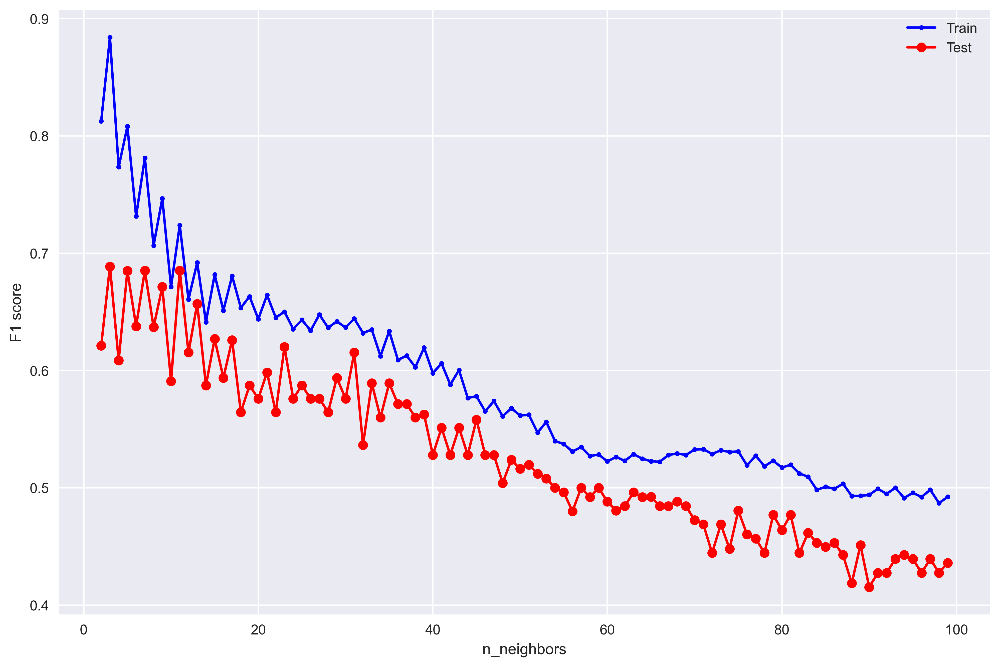

In [273]:
neighbors = list(range(2, 100))
train_scores, test_scores = [], []
for n_neighbors in neighbors :
    knn = KNeighborsClassifier(algorithm = 'auto', leaf_size = 10, n_neighbors = n_neighbors, p = 1,
                               n_jobs = -1)
    knn.fit(X_train, y_train)
    train_scores.append(metrics.f1_score(y_train, knn.predict(X_train)))
    test_scores.append(metrics.f1_score(y_test, knn.predict(X_test)))
    
plt.figure(figsize = (12, 8), dpi = 400)
plt.plot(list(range(2, 100)), train_scores, marker = '.', color = 'blue', label = 'Train')
plt.plot(list(range(2, 100)), test_scores, marker = 'o', color = 'red', label = 'Test')
plt.xlabel('n_neighbors')
plt.ylabel('F1 score')
plt.legend()
plt.show()

--- Number of neighbors still cannot help with finding a good model !

--- Sampling methods (oversampling and undersampling) may improve the model, but they will not be used. Even though, I read a lot about it and tried some methods on this data, I did not get good results on the test set and it might caused by not knowing enough about the fine details of these methods !

##### Losing lots of features, and yet low precision of the tuned KNN model, means that Logistic Regression is the better choice for this dataset.

### Naive Bayes Classifier

In [274]:
df_naive = df_train.drop(['Income - CCAvg','Income - Family', 'Income - Experience', 'Income - Age',
                          'Income2'], axis = 1)

df_naive.columns, df_naive.shape

(Index(['Age', 'Experience', 'Income', 'Family', 'CCAvg', 'Education',
        'Mortgage', 'Securities Account', 'CD Account', 'Online', 'CreditCard',
        'City Code_0', 'City Code_1', 'City Code_2', 'City Code_3',
        'City Code_4', 'City Code_5', 'Target'],
       dtype='object'),
 (4750, 18))

In [275]:
df_cont = df_naive[['Age', 'Experience', 'Income', 'CCAvg', 'Mortgage']]
df_disc = df_naive[['Family', 'Education', 'Securities Account', 'CD Account', 'Online', 'CreditCard',
                    'City Code_0', 'City Code_1', 'City Code_2', 'City Code_3','City Code_4',
                    'City Code_5']]

--- As we want to try naive bayes classifier on this data, and the fact that none of the naive bayes variations is suitable for mixed data types (discrete and continuous), data must be divided into to parts, so a suitable model can be trained with each of the two parts.

In [276]:
X_cont = df_cont
X_disc = df_disc
y = df_naive['Target']

In [277]:
cont_nb = GaussianNB()
disc_nb = ComplementNB()

In [278]:
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)

In [279]:
print(cross_val_score(cont_nb, X_cont, y, scoring = 'f1', cv = kfold))
print(cross_val_score(disc_nb, X_disc, y, scoring = 'f1', cv = kfold))

[0.47804878 0.43781095 0.52427184 0.54782609 0.52813853]
[0.27385892 0.25833333 0.33027523 0.26804124 0.36885246]


--- None of the estimators above has a reasonable prediction power!

--- First, continous part is being optimized.

In [280]:
from sklearn.preprocessing import PowerTransformer

In [281]:
scaler = MinMaxScaler()
transformer = PowerTransformer()
cont_nb = GaussianNB()
pipeline = Pipeline(steps = (['s', scaler], ['t', transformer], ['m', cont_nb]))

In [282]:
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
print(cross_val_score(pipeline, X_cont, y, scoring = 'f1', cv = kfold))
print(np.mean(cross_val_score(pipeline, X_cont, y, scoring = 'f1', cv = kfold)))

[0.49302326 0.44859813 0.53080569 0.5210084  0.52941176]
0.5045694483852187


--- Afer some trial and error changing the cells above, the best result achieved using both MinMaxScaler and PowerTransformer. Note that powertransfomer is used to transform the shape of distribution of the continuous features.

In [283]:
X_cont = df_cont.drop(['Age'], axis = 1)

In [284]:
scaler = MinMaxScaler()
transformer = PowerTransformer()
cont_nb = GaussianNB()
pipeline = Pipeline(steps = (['s', scaler], ['t', transformer], ['m', cont_nb]))

In [285]:
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
print(cross_val_score(pipeline, X_cont, y, scoring = 'f1', cv = kfold))
print(np.mean(cross_val_score(pipeline, X_cont, y, scoring = 'f1', cv = kfold)))

[0.50909091 0.44131455 0.53080569 0.5210084  0.52719665]
0.5058832412732641


--- Removing each of "Age" or "Experience" improve the model, as Naive Bayes is prone to highly correlated pair of features.

--- Due to the sensitive nature of Naive Bayes to highly correlated features, adding synthetic features does not sound logical for model improvement.

In [286]:
X_cont = df_cont.drop(['Age'], axis = 1)
X_cont['Income - Family'] = df_train['Income - Family']

In [287]:
scaler = MinMaxScaler()
transformer = PowerTransformer()
cont_nb = GaussianNB()
pipeline = Pipeline(steps = (['s', scaler], ['t', transformer], ['m', cont_nb]))

In [288]:
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
print(cross_val_score(pipeline, X_cont, y, scoring = 'f1', cv = kfold))
print(np.mean(cross_val_score(pipeline, X_cont, y, scoring = 'f1', cv = kfold)))

[0.59482759 0.56502242 0.58558559 0.6147541  0.6147541 ]
0.5949887580076915


--- Adding "Income - Family" features, that is a created using a continuous and a discrete feature, improved the model drastically. Considering this, for the final Naive Bayes prediction, "Family" may need to be removed from the discrete features !

In [289]:
X_cont = df_cont.drop(['Age'], axis = 1)
X_cont['Income - Family'] = df_train['Income - Family']

In [290]:
scaler = MinMaxScaler()
transformer = PowerTransformer()
cont_nb = GaussianNB()
pipeline = Pipeline(steps = (['t', transformer], ['s', scaler], ['m', cont_nb]))

In [291]:
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
print(cross_val_score(pipeline, X_cont, y, scoring = 'f1', cv = kfold))
print(np.mean(cross_val_score(pipeline, X_cont, y, scoring = 'f1', cv = kfold)))

[0.60526316 0.57272727 0.60747664 0.61087866 0.61924686]
0.6031185178297161


--- By another set of trial end error, it has been found that with putting the scaler between transfomer and the model, better results can be achieved.

In [292]:
X_cont = df_cont.drop(['Age'], axis = 1)
X_cont['Income - Family'] = df_train['Income - Family']
y = df_naive['Target']

X_train, X_test, y_train, y_test = train_test_split(X_cont, y, test_size = 0.2, shuffle = True, 
                                                    random_state = 1)

In [293]:
scaler = MinMaxScaler()
transformer = PowerTransformer()
cont_nb = GaussianNB()
pipeline = Pipeline(steps = (['t', transformer], ['s', scaler], ['m', cont_nb]))

In [294]:
pipeline.fit(X_train, y_train)

Pipeline(steps=[('t', PowerTransformer()), ('s', MinMaxScaler()),
                ['m', GaussianNB()]])

In [295]:
# Performance On the Train set :

classification_metrics(y_train, pipeline.predict(X_train))

accuracy :   0.9036842105263158
precision :  0.5073529411764706
recall :     0.7379679144385026
f1 :         0.6013071895424837
[[3158  268]
 [  98  276]]
              precision    recall  f1-score   support

           0       0.97      0.92      0.95      3426
           1       0.51      0.74      0.60       374

    accuracy                           0.90      3800
   macro avg       0.74      0.83      0.77      3800
weighted avg       0.92      0.90      0.91      3800



In [296]:
# Performance On the Test set :

classification_metrics(y_test, pipeline.predict(X_test))

accuracy :   0.9052631578947369
precision :  0.49640287769784175
recall :     0.7752808988764045
f1 :         0.6052631578947368
[[791  70]
 [ 20  69]]
              precision    recall  f1-score   support

           0       0.98      0.92      0.95       861
           1       0.50      0.78      0.61        89

    accuracy                           0.91       950
   macro avg       0.74      0.85      0.78       950
weighted avg       0.93      0.91      0.91       950



--- Consistency of the metrics prove that the model is not overfitted.

--- As the Naive Byaes algorithm is not a good estimator for assigning probability, roc_auc_score and threshold adjustment techneques will not be used.

In [297]:
X_disc = df_disc
y = df_naive['Target']

In [298]:
disc_nb = ComplementNB()

In [299]:
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
print(cross_val_score(disc_nb, X_disc, y, scoring = 'f1', cv = kfold))
print(np.mean(cross_val_score(disc_nb, X_disc, y, scoring = 'f1', cv = kfold)))

[0.27385892 0.25833333 0.33027523 0.26804124 0.36885246]
0.29987223599655055


In [300]:
# Initial results of the model is not good enough!

In [301]:
X_disc = df_disc[['Family', 'Education', 'Securities Account', 'CD Account', 'Online',
       'CreditCard']]

In [302]:
disc_nb = ComplementNB()
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
print(cross_val_score(disc_nb, X_disc, y, scoring = 'f1', cv = kfold))
print(np.mean(cross_val_score(disc_nb, X_disc, y, scoring = 'f1', cv = kfold)))

[0.28272251 0.28571429 0.31818182 0.3047619  0.39583333]
0.3174427710160695


--- Removing "City Code" columns improved the model. 

In [303]:
X_disc = df_disc[['Family', 'Education', 'Securities Account', 'CD Account']]

In [304]:
disc_nb = ComplementNB()
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
print(cross_val_score(disc_nb, X_disc, y, scoring = 'f1', cv = kfold))
print(np.mean(cross_val_score(disc_nb, X_disc, y, scoring = 'f1', cv = kfold)))

[0.32653061 0.29761905 0.38848921 0.33962264 0.38216561]
0.34688542302040287


--- Also removing "CreditCard" and "Online" features improved the model. It may happened due to the low correlation of these features with the target.

In [305]:
X_disc = df_disc[['Education', 'Securities Account', 'CD Account']]

In [306]:
disc_nb = ComplementNB()
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
print(cross_val_score(disc_nb, X_disc, y, scoring = 'f1', cv = kfold))
print(np.mean(cross_val_score(disc_nb, X_disc, y, scoring = 'f1', cv = kfold)))

[0.32653061 0.33103448 0.38848921 0.33962264 0.38216561]
0.35356851004831746


--- Removing "Family" resulted in an improvement. As the continuous part of the features includes "Income - Family" and it is highly correlated with "Family", and considering that "Family" is not correlated with the target, removing it seems logical.

##### Now that two models are fitted on continuous and discrete data, final model can be built with two approaches : 

--- 1. Fit Guassian NB on the continuous data, get the predictions and add it to the discrete data. Then fit Complement NB on the discrete data to get the final prediction.

--- 2. Fit Guassian NB and Complement NB simultaneously, then multyplying probabilities, dividing by the prior probability of target classes. After normalizing, predictions can be achieved comparing to the default threshold.

##### Note that the statistically proven method is the second approach. First approach is more like a random guess!

In [307]:
scaler = MinMaxScaler()
transformer = PowerTransformer()
cont_nb = GaussianNB()
cont_pipe = Pipeline(steps = (['t', transformer], ['s', scaler], ['m', cont_nb]))

In [308]:
X_cont = df_cont.drop(['Age'], axis = 1)
X_cont['Income - Family'] = df_train['Income - Family']
y = df_naive['Target']

In [309]:
cont_pipe.fit(X_cont, y)

Pipeline(steps=[('t', PowerTransformer()), ('s', MinMaxScaler()),
                ['m', GaussianNB()]])

In [310]:
y_pred = cont_pipe.predict(X_cont)

In [311]:
X_disc = df_disc[['Education', 'Securities Account', 'CD Account']]
X_disc['Guassian Prediction'] = y_pred

<ipython-input-311-910a8e58d2bc>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_disc['Guassian Prediction'] = y_pred


In [312]:
disc_nb = ComplementNB()
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
print(cross_val_score(disc_nb, X_disc, y, scoring = 'f1', cv = kfold))
print(np.mean(cross_val_score(disc_nb, X_disc, y, scoring = 'f1', cv = kfold)))

[0.57894737 0.5498008  0.5785124  0.57039711 0.58909091]
0.5733497165864566


--- First way did not returned satisfying results as it was expected.

In [313]:
X_cont = df_cont.drop(['Age'], axis = 1)
X_cont['Income - Family'] = df_train['Income - Family']
X_disc = df_disc[['Education', 'Securities Account', 'CD Account']]
y = df_naive['Target']

In [314]:
X_cont_train, X_cont_test, y_train, y_test = train_test_split(X_cont, y, test_size = 0.2, shuffle = True, 
                                                    random_state = 1)
X_disc_train, X_disc_test = train_test_split(X_disc, test_size = 0.2, shuffle = True, 
                                                    random_state = 1)

In [315]:
scaler = MinMaxScaler()
transformer = PowerTransformer()
cont_nb = GaussianNB()

In [316]:
cont_pipe = Pipeline(steps = (['t', transformer], ['s', scaler], ['m', cont_nb]))
disc_nb = ComplementNB()

In [317]:
cont_pipe.fit(X_cont_train, y_train)
disc_nb.fit(X_disc_train, y_train)

ComplementNB()

In [318]:
y_proba_cont = cont_pipe.predict_proba(X_cont_test)
y_proba_disc = disc_nb.predict_proba(X_disc_test)

In [319]:
guassian_proba = pd.DataFrame(y_proba_cont, columns = ['Class_0_cont', 'Class_1_cont'])
guassian_proba

,Class_0_cont,Class_1_cont
0,0.455603,5.443974e-01
1,0.999994,6.107158e-06
2,1.000000,5.643136e-10
3,0.999966,3.443980e-05
4,1.000000,2.826476e-15
...,...,...
945,0.999958,4.239944e-05
946,1.000000,3.859858e-09
947,0.921756,7.824426e-02
948,1.000000,4.862268e-09


In [320]:
complement_proba = pd.DataFrame(y_proba_disc, columns = ['Class_0_disc', 'Class_1_disc'])
complement_proba

,Class_0_disc,Class_1_disc
0,0.572777,0.427223
1,0.571311,0.428689
2,0.572777,0.427223
3,0.548710,0.451290
4,0.524413,0.475587
...,...,...
945,0.572777,0.427223
946,0.548710,0.451290
947,0.164388,0.835612
948,0.572777,0.427223


In [321]:
probabilities = pd.concat([guassian_proba, complement_proba], axis = 1)
probabilities

,Class_0_cont,Class_1_cont,Class_0_disc,Class_1_disc
0,0.455603,5.443974e-01,0.572777,0.427223
1,0.999994,6.107158e-06,0.571311,0.428689
2,1.000000,5.643136e-10,0.572777,0.427223
3,0.999966,3.443980e-05,0.548710,0.451290
4,1.000000,2.826476e-15,0.524413,0.475587
...,...,...,...,...
945,0.999958,4.239944e-05,0.572777,0.427223
946,1.000000,3.859858e-09,0.548710,0.451290
947,0.921756,7.824426e-02,0.164388,0.835612
948,1.000000,4.862268e-09,0.572777,0.427223


In [322]:
probabilities['Class 0'] = probabilities['Class_0_cont'] * probabilities['Class_0_disc']
probabilities['Class 1'] = probabilities['Class_1_cont'] * probabilities['Class_1_disc']
predict_proba = probabilities.drop(['Class_0_cont', 'Class_1_cont', 'Class_0_disc', 'Class_1_disc'], axis = 1)
predict_proba

,Class 0,Class 1
0,0.260959,2.325792e-01
1,0.571308,2.618069e-06
2,0.572777,2.410879e-10
3,0.548691,1.554234e-05
4,0.524413,1.344235e-15
...,...,...
945,0.572753,1.811402e-05
946,0.548710,1.741915e-09
947,0.151525,6.538187e-02
948,0.572777,2.077274e-09


In [323]:
prior_0 = sum(y_test == 0) / len(y_test)
prior_1 = sum(y_test == 1) / len(y_test)
print(prior_0)
print(prior_1)

0.9063157894736842
0.09368421052631579


In [324]:
# Dividing by the prior of target classes, cause the multyplyication produce an extra P(y)

predict_proba['Class_0_divided'] = predict_proba['Class 0'] / prior_0
predict_proba['Class_1_divided'] = predict_proba['Class 1'] / prior_1
predict_proba

,Class 0,Class 1,Class_0_divided,Class_1_divided
0,0.260959,2.325792e-01,0.287933,2.482587e+00
1,0.571308,2.618069e-06,0.630363,2.794568e-05
2,0.572777,2.410879e-10,0.631984,2.573410e-09
3,0.548691,1.554234e-05,0.605408,1.659014e-04
4,0.524413,1.344235e-15,0.578621,1.434858e-14
...,...,...,...,...
945,0.572753,1.811402e-05,0.631957,1.933519e-04
946,0.548710,1.741915e-09,0.605429,1.859348e-08
947,0.151525,6.538187e-02,0.167188,6.978964e-01
948,0.572777,2.077274e-09,0.631984,2.217315e-08


In [325]:
sum_probas = predict_proba['Class_0_divided'] + predict_proba['Class_1_divided']
sum_probas

0      2.770520
1      0.630391
2      0.631984
3      0.605574
4      0.578621
         ...   
945    0.632150
946    0.605429
947    0.865085
948    0.631984
949    0.662029
Length: 950, dtype: float64

In [326]:
predict_proba['Class_0_norm'] = predict_proba['Class_0_divided'] / sum_probas
predict_proba['Class_1_norm'] = predict_proba['Class_1_divided'] / sum_probas
predict_proba

,Class 0,Class 1,Class_0_divided,Class_1_divided,Class_0_norm,Class_1_norm
0,0.260959,2.325792e-01,0.287933,2.482587e+00,0.103928,8.960724e-01
1,0.571308,2.618069e-06,0.630363,2.794568e-05,0.999956,4.433071e-05
2,0.572777,2.410879e-10,0.631984,2.573410e-09,1.000000,4.071956e-09
3,0.548691,1.554234e-05,0.605408,1.659014e-04,0.999726,2.739572e-04
4,0.524413,1.344235e-15,0.578621,1.434858e-14,1.000000,2.479790e-14
...,...,...,...,...,...,...
945,0.572753,1.811402e-05,0.631957,1.933519e-04,0.999694,3.058639e-04
946,0.548710,1.741915e-09,0.605429,1.859348e-08,1.000000,3.071124e-08
947,0.151525,6.538187e-02,0.167188,6.978964e-01,0.193262,8.067378e-01
948,0.572777,2.077274e-09,0.631984,2.217315e-08,1.000000,3.508499e-08


In [327]:
y_pred = predict_proba['Class_1_norm'] >= 0.5

In [328]:
classification_metrics(y_test, y_pred)

accuracy :   0.8410526315789474
precision :  0.36403508771929827
recall :     0.9325842696629213
f1 :         0.5236593059936908
[[716 145]
 [  6  83]]
              precision    recall  f1-score   support

           0       0.99      0.83      0.90       861
           1       0.36      0.93      0.52        89

    accuracy                           0.84       950
   macro avg       0.68      0.88      0.71       950
weighted avg       0.93      0.84      0.87       950



--- Second approach is worse than the second one !

##### Considering all the results up to now, Logistic Regression is the best model.

--- Now we train the model with the best algorithm, and check the generalization error on the holdout set.

### Evaluating Generalization

In [329]:
df_train.columns

Index(['Age', 'Experience', 'Income', 'Family', 'CCAvg', 'Education',
       'Mortgage', 'Securities Account', 'CD Account', 'Online', 'CreditCard',
       'City Code_0', 'City Code_1', 'City Code_2', 'City Code_3',
       'City Code_4', 'City Code_5', 'Target', 'Income - CCAvg',
       'Income - Family', 'Income - Experience', 'Income - Age', 'Income2'],
      dtype='object')

In [330]:
data_holdout['Income - CCAvg'] = data_holdout['Income'] * data_holdout['CCAvg']
data_holdout['Income - Family'] = data_holdout['Income'] * data_holdout['Family']
data_holdout['Income - Experience'] = data_holdout['Income'] * data_holdout['Experience']
data_holdout['Income - Age'] = data_holdout['Income'] * data_holdout['Age']
data_holdout['Income2'] = data_holdout['Income'] ** 2
data_holdout

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,...,City Code_2,City Code_3,City Code_4,City Code_5,Target,Income - CCAvg,Income - Family,Income - Experience,Income - Age,Income2
2764,31,5,84,1,2.9,3,105,0,0,0,...,1,0,1,1,0,243.6,84,420,2604,7056
4767,35,9,45,3,0.9,1,101,1,0,0,...,0,1,1,0,0,40.5,135,405,1575,2025
3814,34,9,35,3,1.3,1,0,0,0,0,...,1,1,1,1,0,45.5,105,315,1190,1225
3499,49,23,114,1,0.3,1,286,0,0,1,...,0,0,1,0,0,34.2,114,2622,5586,12996
2735,36,12,70,3,2.6,2,165,0,0,1,...,0,0,0,1,0,182.0,210,840,2520,4900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3904,29,5,18,1,0.4,3,94,0,0,1,...,0,1,0,1,0,7.2,18,90,522,324
4932,59,35,111,1,4.3,1,0,0,0,1,...,1,0,1,1,0,477.3,111,3885,6549,12321
1050,53,27,145,2,6.1,3,294,0,1,1,...,1,1,1,0,1,884.5,290,3915,7685,21025
4340,34,10,92,2,2.7,1,0,1,1,0,...,1,1,1,0,0,248.4,184,920,3128,8464


In [331]:
X = df_train.drop('Target', axis = 1)
y = df_train['Target']

In [332]:
reg = LogisticRegression(solver = 'liblinear', max_iter = 20000)
params = {'penalty' : ['l1', 'l2'], 'C' : [0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100], 
          'class_weight' : [None, 'balanced'], 'dual' : [True, False], 'warm_start' : [False, True]}
kfold = KFold(n_splits = 5, shuffle = True, random_state = 1)
gridsearch = GridSearchCV(reg, param_grid = params, scoring = 'f1', n_jobs = -1, cv = kfold)

In [333]:
gridsearch.fit(X, y)

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:918: UserWarning: One or more of the test scores are non-finite: [       nan        nan 0.51811727 0.53599947 0.80075125 0.80075125
 0.79702621 0.79702621        nan        nan 0.49835321 0.49827294
 0.68418143 0.68316947 0.66458179 0.66458179        nan        nan
 0.39284711 0.43347131 0.81039844 0.81039844 0.81769727 0.81769727
        nan        nan 0.49614409 0.48688656 0.69169951 0.69169951
 0.67769577 0.67769577        nan        nan 0.40189446 0.47628584
 0.81418234 0.81418234 0.81031316 0.81031316        nan        nan
 0.35604757 0.38229027 0.6949598  0.6949598  0.66413426 0.66413426
        nan        nan 0.43474798 0.46859304 0.81682777 0.81682777
 0.81401003 0.81401003        nan        nan 0.47440734 0.43769414
 0.69725986 0.69725986 0.67641784 0.67641784        nan        nan
 0.48090396 0.37527648 0.81433018 0.81433018 0.81357786 0.81357786
        nan        nan 0.53021905 0.46531486 0.6994842

GridSearchCV(cv=KFold(n_splits=5, random_state=1, shuffle=True),
             estimator=LogisticRegression(max_iter=20000, solver='liblinear'),
             n_jobs=-1,
             param_grid={'C': [0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100],
                         'class_weight': [None, 'balanced'],
                         'dual': [True, False], 'penalty': ['l1', 'l2'],
                         'warm_start': [False, True]},
             scoring='f1')

In [334]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'C': 20, 'class_weight': None, 'dual': False, 'penalty': 'l1', 'warm_start': False}
0.819000395155169


In [335]:
reg = LogisticRegression(solver = 'liblinear', penalty = 'l1', C = 20, max_iter = 50000)
reg.fit(X, y)

LogisticRegression(C=20, max_iter=50000, penalty='l1', solver='liblinear')

In [336]:
classification_metrics(y, reg.predict(X))

accuracy :   0.9677894736842105
precision :  0.8799019607843137
recall :     0.775377969762419
f1 :         0.8243398392652124
[[4238   49]
 [ 104  359]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      4287
           1       0.88      0.78      0.82       463

    accuracy                           0.97      4750
   macro avg       0.93      0.88      0.90      4750
weighted avg       0.97      0.97      0.97      4750



In [340]:
y_proba = reg.predict_proba(X)[:, 1]
precision, recall, thresholds = metrics.precision_recall_curve(y, y_proba)
f1 = (2 * precision * recall) / (precision + recall)
best_index = np.argmax(f1)
best_threshold = thresholds[best_index]
print(best_threshold)

0.4198940682152891


In [341]:
classification_metrics(y, y_proba >= best_threshold)

accuracy :   0.9696842105263158
precision :  0.8616780045351474
recall :     0.8207343412526998
f1 :         0.8407079646017699
[[4226   61]
 [  83  380]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      4287
           1       0.86      0.82      0.84       463

    accuracy                           0.97      4750
   macro avg       0.92      0.90      0.91      4750
weighted avg       0.97      0.97      0.97      4750



In [342]:
X_holdout = data_holdout.drop('Target', axis = 1)
y_holdout = data_holdout['Target']

In [347]:
y_pred = reg.predict_proba(X_holdout)[:, 1] >= best_threshold

In [348]:
classification_metrics(y_holdout, y_pred)

accuracy :   0.972
precision :  0.8125
recall :     0.7647058823529411
f1 :         0.787878787878788
[[230   3]
 [  4  13]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       233
           1       0.81      0.76      0.79        17

    accuracy                           0.97       250
   macro avg       0.90      0.88      0.89       250
weighted avg       0.97      0.97      0.97       250



--- Evalutions on the holdout set shows that the model in general is not as precise as it is on the train data. Also, recall is quite lower than the train set, but there is no severe sign of overfitting problem.

##### Finally, the model bulit above is the final model for this dataset.

### Assignment Final Answer

##### Assignment smaple :
--- ID = 5071, Age = 42, Experience = 16, Income = 30 ZIP Code = 92032, Family = 3, CCAvg = 1.2, Education = Advanced, Mortgage = 0, Securitites Account = 1, CD Account = 0, Online = 1, CreditCard = 1

In [349]:
data

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard,City Code,Target
0,25,1,49,4,1.6,1,0,1,0,0,0,11,0
1,45,19,34,3,1.5,1,0,1,0,0,0,00,0
2,39,15,11,1,1.0,1,0,0,0,0,0,47,0
3,35,9,100,1,2.7,2,0,0,0,0,0,41,0
4,35,8,45,4,1.0,2,0,0,0,0,1,13,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,29,3,40,1,1.9,3,0,0,0,1,0,26,0
4996,30,4,15,4,0.4,1,85,0,0,1,0,20,0
4997,63,39,24,2,0.3,3,0,0,0,0,0,30,0
4998,65,40,49,3,0.5,2,0,0,0,1,0,00,0


In [350]:
# Values are being entered as they are in the data before encoding, so there is no "ID, instead of "Zip Code"
# only it's second and third digits are being entered as "City Code".

unknown_data = np.array([[42, 16, 30, 3, 1.2, 3, 0, 1, 0, 1, 1, 20, -1]])

In [352]:
unknown_df = pd.DataFrame(unknown_data, columns = ['Age', 'Experience', 'Income', 'Family', 'CCAvg', 'Education',
       'Mortgage', 'Securities Account', 'CD Account', 'Online', 'CreditCard',
       'City Code', 'Target'])
unknown_df

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard,City Code,Target
0,42.0,16.0,30.0,3.0,1.2,3.0,0.0,1.0,0.0,1.0,1.0,20.0,-1.0


In [353]:
unknown = encoder.transform(unknown_df)
unknown

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,CreditCard,City Code_0,City Code_1,City Code_2,City Code_3,City Code_4,City Code_5,Target
0,42.0,16.0,30.0,3.0,1.2,3.0,0.0,1.0,0.0,1.0,1.0,0,0,0,0,0,0,-1.0


In [354]:
df_train.columns

Index(['Age', 'Experience', 'Income', 'Family', 'CCAvg', 'Education',
       'Mortgage', 'Securities Account', 'CD Account', 'Online', 'CreditCard',
       'City Code_0', 'City Code_1', 'City Code_2', 'City Code_3',
       'City Code_4', 'City Code_5', 'Target', 'Income - CCAvg',
       'Income - Family', 'Income - Experience', 'Income - Age', 'Income2'],
      dtype='object')

In [355]:
unknown['Income - CCAvg'] = unknown['Income'] * unknown['CCAvg']
unknown['Income - Family'] = unknown['Income'] * unknown['Family']
unknown['Income - Experience'] = unknown['Income'] * unknown['Experience']
unknown['Income - Age'] = unknown['Income'] * unknown['Age']
unknown['Income2'] = unknown['Income'] ** 2

In [356]:
X_unknown = unknown.drop('Target', axis = 1)
X_unknown

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Securities Account,CD Account,Online,...,City Code_1,City Code_2,City Code_3,City Code_4,City Code_5,Income - CCAvg,Income - Family,Income - Experience,Income - Age,Income2
0,42.0,16.0,30.0,3.0,1.2,3.0,0.0,1.0,0.0,1.0,...,0,0,0,0,0,36.0,90.0,480.0,1260.0,900.0


In [357]:
reg.predict(X_unknown)

array([0], dtype=int64)

--- The precidtion for the sample provided in the exercise is "0". 